In [1]:
import numpy as np
from numpy.fft import rfft, rfftfreq


from scipy import signal
from scipy.fft import fft, fftshift
from scipy.special._ufuncs import gammainc, gamma
from scipy.optimize import fminbound
from scipy.optimize import curve_fit

import os

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from matplotlib import gridspec
from matplotlib.patches import Rectangle
from matplotlib.patches import Patch

import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.time import Time
from astropy.visualization import ImageNormalize, SqrtStretch
from astropy.io import fits
from astropy.visualization.mpl_normalize import AsymmetricPercentileInterval
from astropy.visualization import astropy_mpl_style


import sunpy.coordinates  # NOQA
import sunpy.map
import sunpy.data.sample
from sunpy.net import Fido
from sunpy.net import attrs as a
from sunpy.visualization.animator import MapSequenceAnimator
from sunpy.map import Map
from sunpy.physics.differential_rotation import solar_rotate_coordinate
from sunpy.coordinates import Helioprojective, get_body_heliographic_stonyhurst
from sunpy.time import parse_time

import datetime as dt




from wavelet_function import wavelet

import pywt


import aiapy.data.sample as sample_data
from aiapy.calibrate import register, update_pointing



from PIL import Image
plt.rcParams['font.family'] = 'Times New Roman'

In [2]:
def Fits_to_maps(file):
    """
    file - string to location of wanted files
    """
    # Creating path to images of specified wavelength
    path = os.listdir(file)
    
    # Creating empty array to append processed maps
    maps = []

    # Looping over each image file in the directory and turning them into maps
    for img in path:
        img_path = os.path.join(file, img)
        
        # Loading the FITS file as a SunPy map
        aia_map = sunpy.map.Map(img_path)
        
        # # Check if aia_map is a list (indicating multiple HDUs) and select the first one
        # if isinstance(aia_map, list):
        #     aia_map = aia_map[0]  # Select the primary HDU if only one is needed
        
        maps.append(aia_map)
    
    return maps

In [3]:
def submaps(maps):

    submaps = []
    for i in maps :
        bottom_left = SkyCoord(340 * u.arcsec, -275 * u.arcsec, frame=i.coordinate_frame)
        top_right = SkyCoord(500 * u.arcsec, -150 * u.arcsec, frame=i.coordinate_frame)   
        submap = i.submap(bottom_left=bottom_left, top_right=top_right)
        submaps.append(submap)

    return submaps

In [4]:
def intenisty_sum(maps):


    intensity = []
 # summing intenisty of every pixel in the images 
    for map in maps:
        intensity_sum = map.data.sum()
        intensity.append(intensity_sum)
    return intensity

In [5]:
def windowed_fourier(intensity_array,cadence):
   
    intensity_cal = []
    for i in intensity_array:
        intensity = (i-np.mean(intensity_array))/np.std(intensity_array)
        intensity_cal.append(intensity)
    
    # intenisty_cal = np.ma.masked_less(intensity_cal, 0)

    window = signal.windows.hann(len(intensity_cal))

    plt.figure(figsize = (15,15))
    intensity_window = window*intensity_cal

    fft_result = np.fft.fft(intensity_window)
    fft = (np.abs(fft_result)**2)/np.var(intensity_window)
    freqs = np.fft.fftfreq(len(intensity_window), cadence)

    # plt.plot(1/(freqs),(fft))
    # plt.yscale('log')
    # plt.xscale('log')
    # plt.xlabel("Period (s)")
    # plt.ylabel("Magnitude")
    # plt.title("Intensity ")
    # plt.savefig(fname = '171PowerSpectrum.jpeg',format="jpeg", bbox_inches="tight")

    # plt.show()

    return freqs, fft

In [6]:
def PowerFunction(x,A,a):
    return np.log(A)+np.log(x)*(a)

In [7]:
# maps_1700 = Fits_to_maps('fully_calibrated_FD_1700')
# maps_1700 = sorted(maps_1700,key = lambda m:m.date)

# time_axis = Fits_to_maps('AIA_1700_prep_rot_done')
# time_axis = sorted(time_axis,key = lambda m:m.date)
# time_axis_1700 = [map.date.datetime for map in time_axis]
# time_float_list_1700 = [
#     t.hour + t.minute / 60 + t.second / 3600 + t.microsecond / 3_600_000_000 for t in time_axis_1700
# ]

In [8]:
# plt.figure(figsize=(12,12))
# maps_1700[0].plot()

In [9]:
path = os.listdir('fully_calibrated_FD_94_fixingtime')
maps = []
for img in path:
    if img == '.DS_Store':
        continue
        
    img_path = os.path.join('fully_calibrated_FD_94_fixingtime', img)
    aia_map = sunpy.map.Map(img_path)
    
    maps.append(aia_map)

maps_94 = sorted(maps,key = lambda m:m.date)

maps_94 = submaps(maps_94)

# print(maps_94[0])
# maps_94[0].plot()
# plt.show()

# print(maps_94[230])
# maps_94[230].plot()
# plt.show()

KeyboardInterrupt: 

In [10]:
path = os.listdir('fully_calibrated_FD_171_fixingtime')
maps = []
for img in path:
    if img == '.DS_Store':
        continue
        
    img_path = os.path.join('fully_calibrated_FD_171_fixingtime', img)
    aia_map = sunpy.map.Map(img_path)
    
    maps.append(aia_map)

maps_171 = sorted(maps,key = lambda m:m.date)

maps_171 = submaps(maps_171)

In [11]:
path = os.listdir('fully_calibrated_FD_304_fixingtime')
maps = []
for img in path:
    if img == '.DS_Store':
        continue
        
    img_path = os.path.join('fully_calibrated_FD_304_fixingtime', img)
    aia_map = sunpy.map.Map(img_path)
    
    maps.append(aia_map)

maps_304 = sorted(maps,key = lambda m:m.date)

maps_304 = submaps(maps_304)

In [12]:
path = os.listdir('fully_calibrated_FD_1700_fixingtime')
maps = []
for img in path:
    if img == '.DS_Store':
        continue
        
    img_path = os.path.join('fully_calibrated_FD_1700_fixingtime', img)
    aia_map = sunpy.map.Map(img_path)
    
    maps.append(aia_map)

maps_1700 = sorted(maps,key = lambda m:m.date)

maps_1700 = submaps(maps_1700)

In [13]:
submaps_1700 = submaps(maps_1700)

2013-06-13 09:20:30.710000 2013-06-13 09:20:30.710000


<function matplotlib.pyplot.show(close=None, block=None)>

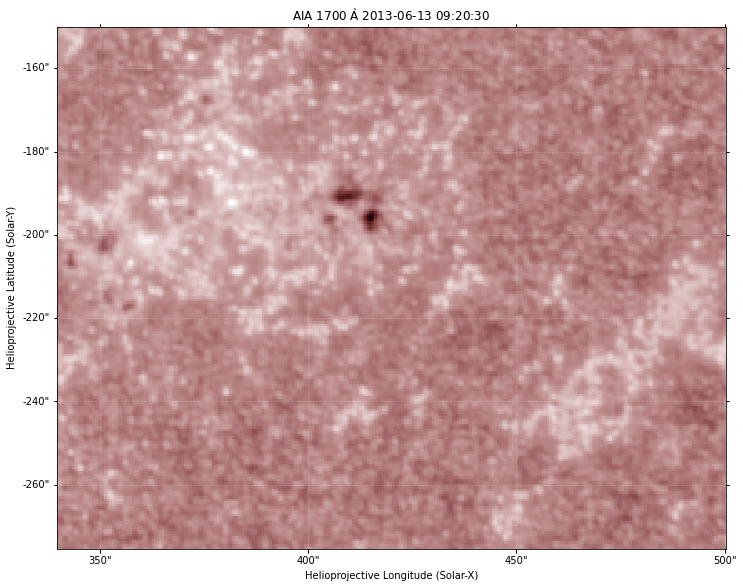

In [14]:
print(submaps_1700[0].date.datetime, submaps_1700[100].date.datetime)

plt.figure(figsize = (12,12))
submaps_1700[100].plot()
plt.show

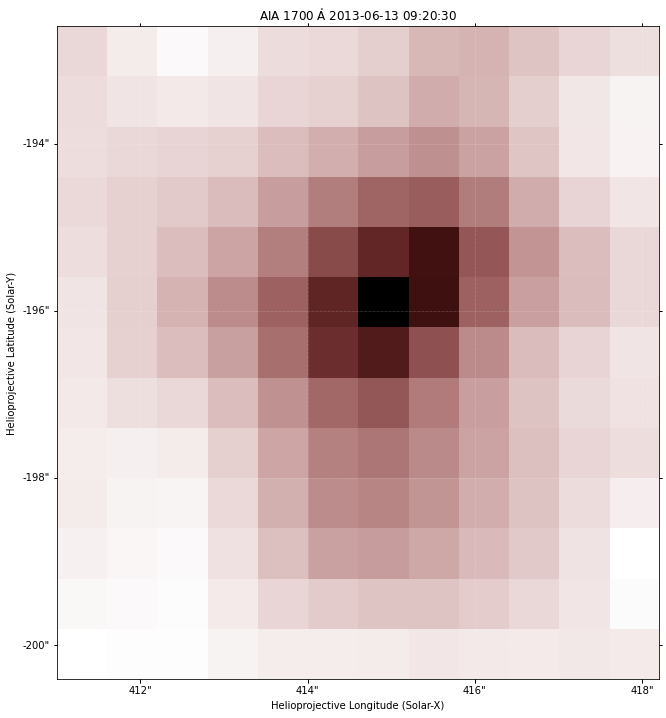

In [15]:
sunspot_1700 = []
for i in submaps_1700 :
    # bottom_left = SkyCoord(412* u.arcsec, -198 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(418 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)     maybe still a bit big 
    # bottom_left = SkyCoord(413* u.arcsec, -197.5 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(416.5 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)    not as expected
    bottom_left = SkyCoord(411* u.arcsec, -200 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(418 * u.arcsec, -193 * u.arcsec, frame=i.coordinate_frame)       

    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    sunspot_1700.append(submap)

plt.figure(figsize = (12,12))
sunspot_1700[1].plot()
plt.show()

In [16]:
sunspot_1700_intensity = intenisty_sum(sunspot_1700)
print(sunspot_1700_intensity)

plt.figure(figsize = (12,12))
plt.plot(time_float_list_1700,sunspot_1700_intensity)
plt.xlabel('Fractional Time')
plt.ylabel('Intensity')
plt.title('1700 ROI light curve')
plt.show()

[119060.63813408172, 120663.93143377441, 122621.91474702346, 116854.0725671288, 127354.29810322665, 125474.74340327672, 120708.60096562517, 129219.77767112262, 116662.47890437374, 117186.14285956915, 118855.70551408493, 122484.09227072766, 121295.08729712796, 121372.7425593107, 122227.19419071704, 120419.62253789805, 123872.93818446592, 123540.47965125082, 118749.23187094831, 131654.3633379907, 128578.86196085258, 123663.73322841636, 116431.12655481641, 118082.36854231337, 121155.91413751806, 127101.8948472303, 120691.4946673383, 126374.6180076268, 122932.5807887132, 125685.25569357483, 127548.72929877527, 117558.98747796015, 128946.68138708119, 121020.96189004477, 125942.90362737112, 125497.71667917394, 121980.4654363773, 112710.5050682447, 121786.64444313163, 124403.47587430317, 119609.43688037198, 126247.29827701327, 107437.32412108185, 125597.45626427562, 125097.80377895894, 124870.13864094805, 120527.16217453551, 125605.83007291149, 121933.73427291842, 126302.42578126673, 122766.8

NameError: name 'time_float_list_1700' is not defined

<Figure size 864x864 with 0 Axes>

In [ ]:
submaps_94 = submaps(maps_94)

sunspot_94 = []
for i in submaps_94 :
    # bottom_left = SkyCoord(412* u.arcsec, -198 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(418 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)     maybe still a bit big 
    # bottom_left = SkyCoord(413* u.arcsec, -197.5 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(416.5 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)    not as expected
    bottom_left = SkyCoord(411* u.arcsec, -200 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(418 * u.arcsec, -193 * u.arcsec, frame=i.coordinate_frame)       

    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    sunspot_94.append(submap)



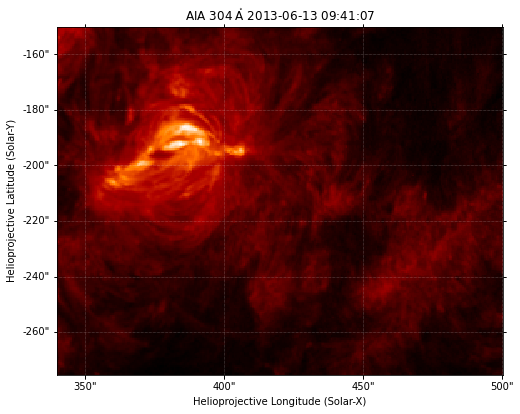

MovieWriter imagemagick unavailable; using Pillow instead.


In [58]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': maps_304[0].wcs})

im = maps_304[0].plot(cmap = 'sdoaia304',axes=ax)

def update(i):
    ax.images[0].set_array(maps_304[i].data)  
    ax.set_title(f"Frame {i + 1}")  

anim = FuncAnimation(fig, update, frames=len(maps_304), interval=200, repeat=True)
plt.show()



anim.save('solar_flare_animation_304_12_12_24.gif', writer='imagemagick')



Text(0.5, 1.0, '94 ROI light curve')

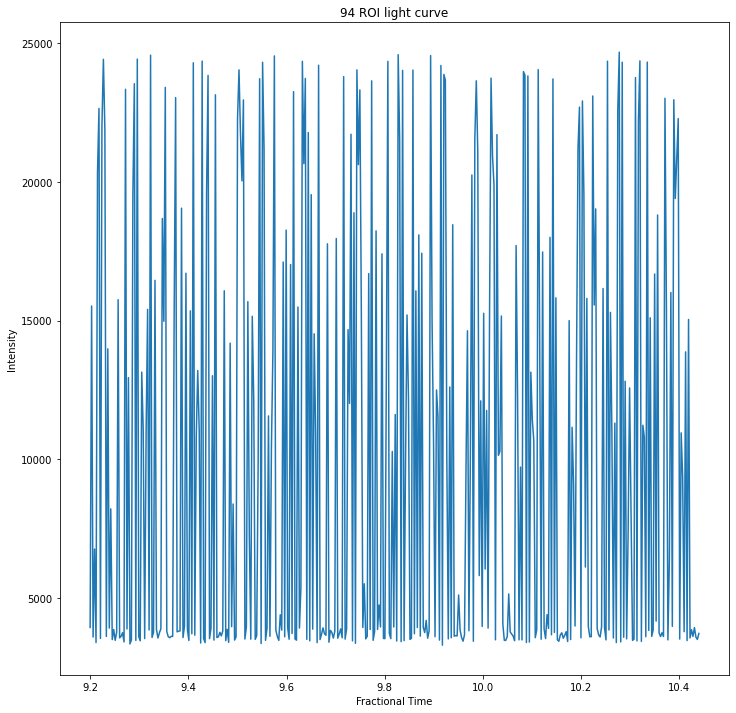

In [ ]:
time = np.linspace(9.20 ,10.44 ,414)

len(time)
sunspot_94_intensity = intenisty_sum(sunspot_94)

plt.figure(figsize = (12,12))
plt.plot(time[0:414],sunspot_94_intensity)
plt.xlabel('Fractional Time')
plt.ylabel('Intensity')
plt.title('94 ROI light curve')

# MAIN CODE STARTS HERE EVERYTHING ABOVE IS NOT SORTED BY TIME 

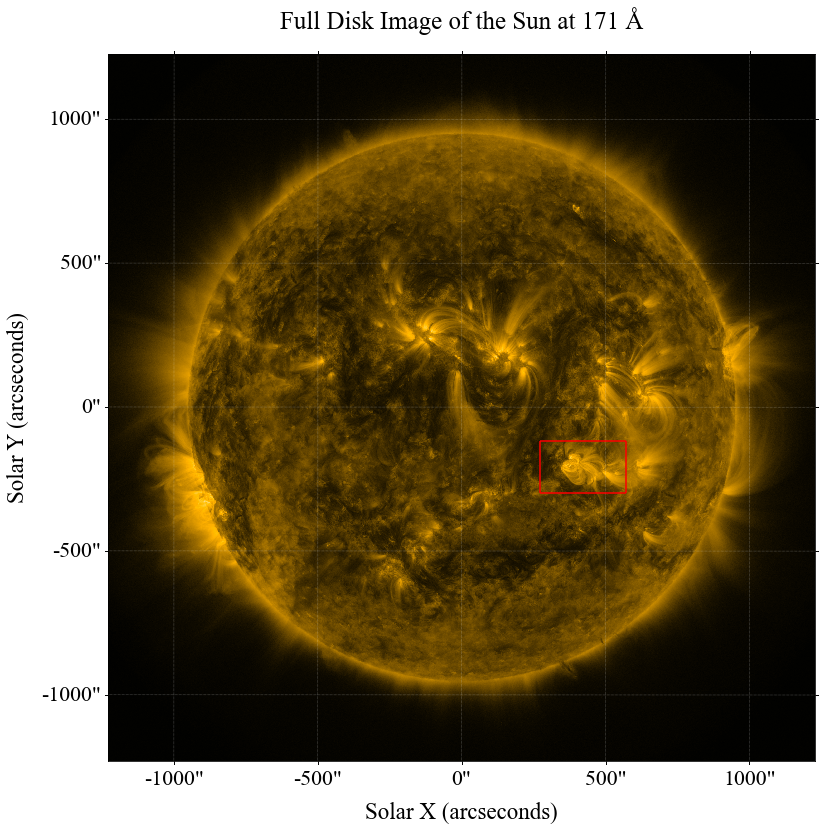

In [9]:
aia_map = sunpy.map.Map('AIA_June_2013_171/aia_lev1_171a_2013_06_13t09_20_11_34z_image_lev1.fits')





fig = plt.figure(figsize = (13,13))
ax = fig.add_subplot(projection=aia_map)
aia_map.plot(axes=ax)
aia_map.plot(axes=ax)
ax.set_title("Full Disk Image of the Sun at 171 Å", fontsize = 25,pad=25)
# plt.colorbar()
plt.xlabel('Solar X (arcseconds)',fontsize = 23)
plt.ylabel('Solar Y (arcseconds)',fontsize = 23)

ax.tick_params(axis='x', labelsize=22)  
ax.tick_params(axis='y', labelsize=22)
# box 1 
plt.hlines(1850,3000,2500, color = 'red' )
plt.hlines(1550,3000,2500, color = 'red' )
plt.vlines(3000,1550,1850,color = 'red')
plt.vlines(2500,1550,1850,color = 'red')






plt.savefig("Full_Disk_171_FIXED.pdf", format="pdf", bbox_inches="tight")  # Use bbox_inches to trim whitespace


plt.show()

In [10]:
# Loading in time sorted 1700 data

map_list_1700 = os.listdir('fully_calibrated_FD_1700_fixingtime')
path = np.sort(map_list_1700)

maps_1700 = []
for img in path:
    img_path = os.path.join('fully_calibrated_FD_1700_fixingtime', img)
    
    aia_map = sunpy.map.Map(img_path)
    
    maps_1700.append(aia_map)


submaps_1700 = submaps(maps_1700)

In [11]:
# Loading in time sorted 304 data

map_list_304 = os.listdir('fully_calibrated_FD_304_fixingtime')
path = np.sort(map_list_304)

maps_304 = []
for img in path:
    img_path = os.path.join('fully_calibrated_FD_304_fixingtime', img)
    
    aia_map = sunpy.map.Map(img_path)
    
    maps_304.append(aia_map)


submaps_304 = submaps(maps_304)

In [12]:
# Loading in time sorted 171 data

map_list_171 = os.listdir('fully_calibrated_FD_171_fixingtime')
path = np.sort(map_list_171)

maps_171 = []
for img in path:
    img_path = os.path.join('fully_calibrated_FD_171_fixingtime', img)
    
    aia_map = sunpy.map.Map(img_path)
    
    maps_171.append(aia_map)


submaps_171 = submaps(maps_171)

In [13]:
# Loading in time sorted 94 data

map_list_94 = os.listdir('fully_calibrated_FD_94_fixingtime')
path = np.sort(map_list_94)

maps_94 = []
for img in path:
    img_path = os.path.join('fully_calibrated_FD_94_fixingtime', img)
    
    aia_map = sunpy.map.Map(img_path)
    
    maps_94.append(aia_map)


submaps_94 = submaps(maps_94)

In [14]:
# fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': submaps_304[0].wcs})

# im = submaps_304[0].plot(cmap = 'sdoaia304',axes=ax)

# def update(i):
#     ax.images[0].set_array(submaps_304[i].data)  
#     ax.set_title(f"Frame {i + 1}")  

# anim = FuncAnimation(fig, update, frames=len(submaps_304), interval=200, repeat=True)
# plt.show()



# anim.save('solar_flare_animation_304_12_12_24.gif', writer='imagemagick')


In [15]:
print(len(submaps_1700),len(submaps_304),len(submaps_171),len(submaps_94))

183 283 401 412


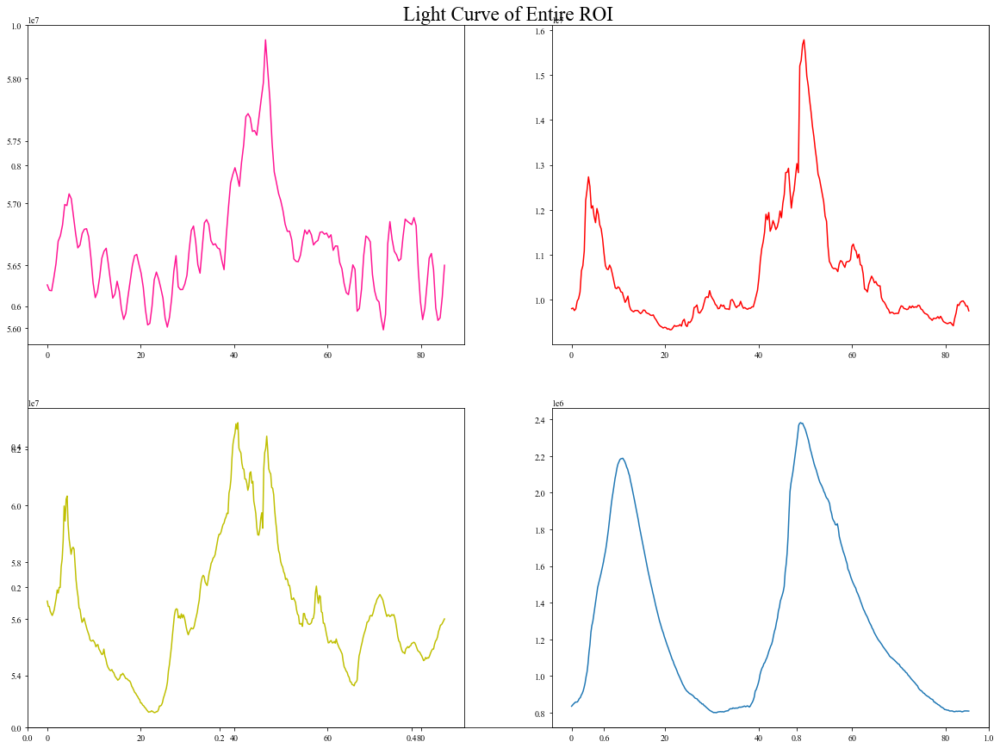

In [95]:
# submaps_intensity_1700 = intenisty_sum(submaps_1700)
# time_1700 = np.linspace(9.203,10.445,183)

# submaps_intensity_304 = intenisty_sum(submaps_304)
# time_304 = np.linspace(9.2,10.445,283)

# submaps_intensity_171 = intenisty_sum(submaps_171)
# time_171 = np.linspace(9.201,10.45,401)

# submaps_intensity_94 = intenisty_sum(submaps_94)
# time_94 = np.linspace(9.2,10.445,412)

submaps_intensity_1700 = intenisty_sum(submaps_1700)
time_1700 = np.linspace(0,85,183)

submaps_intensity_304 = intenisty_sum(submaps_304)
time_304 = np.linspace(0,85,283)

submaps_intensity_171 = intenisty_sum(submaps_171)
time_171 = np.linspace(0,85,401)

submaps_intensity_94 = intenisty_sum(submaps_94)
time_94 = np.linspace(0,85,412)


plt.figure(1,figsize = (20,15))
plt.title('Light Curve of Entire ROI',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,submaps_intensity_1700,color = 'deeppink')

plt.subplot(222)
plt.plot(time_304,submaps_intensity_304,color = 'red')

plt.subplot(223)
plt.plot(time_171,submaps_intensity_171,color = 'y')

plt.subplot(224)
plt.plot(time_94,submaps_intensity_94)
plt.show()



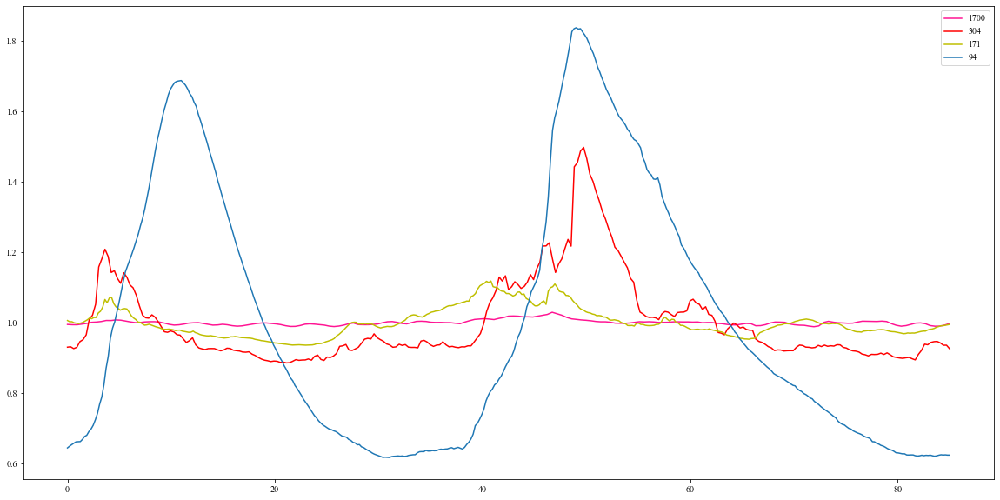

In [96]:
plt.figure(1,figsize = (20,10))


plt.plot(time_1700,submaps_intensity_1700/np.mean(submaps_intensity_1700),label = '1700',color = 'deeppink')
plt.plot(time_304,submaps_intensity_304/np.mean(submaps_intensity_304),label = '304',color = 'red')
plt.plot(time_171,submaps_intensity_171/np.mean(submaps_intensity_171),label = '171',color = 'y')
plt.plot(time_94,submaps_intensity_94/np.mean(submaps_intensity_94),label = '94')
plt.legend()
plt.show()

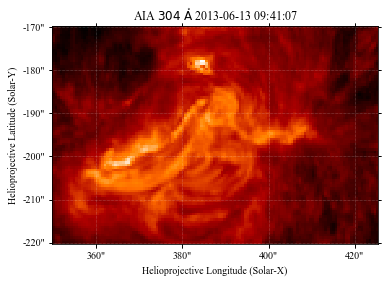

In [97]:
flare_304 = []
for i in submaps_304 :
    bottom_left = SkyCoord(350* u.arcsec, -220 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(425 * u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)  
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    flare_304.append(submap)

flare_304[0].plot()

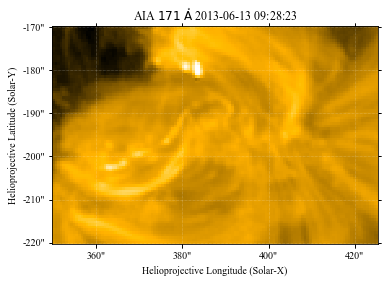

In [98]:
flare_171 = []
for i in submaps_171 :
    bottom_left = SkyCoord(350* u.arcsec, -220 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(425 * u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)  
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    flare_171.append(submap)

flare_171[0].plot()

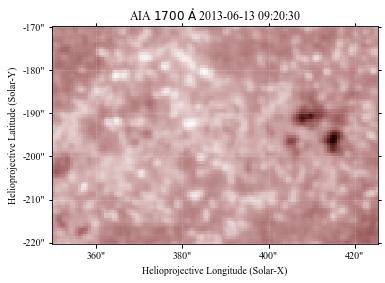

In [99]:
flare_1700 = []
for i in submaps_1700 :
    bottom_left = SkyCoord(350* u.arcsec, -220 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(425 * u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)  
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    flare_1700.append(submap)

flare_1700[0].plot()

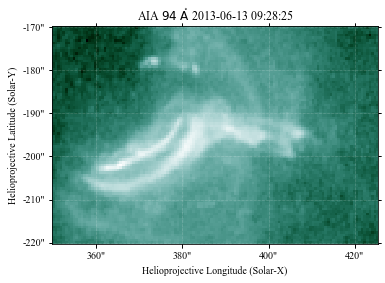

In [100]:
flare_94 = []
for i in submaps_94 :
    bottom_left = SkyCoord(350* u.arcsec, -220 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(425 * u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)  
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    flare_94.append(submap)

flare_94[0].plot()

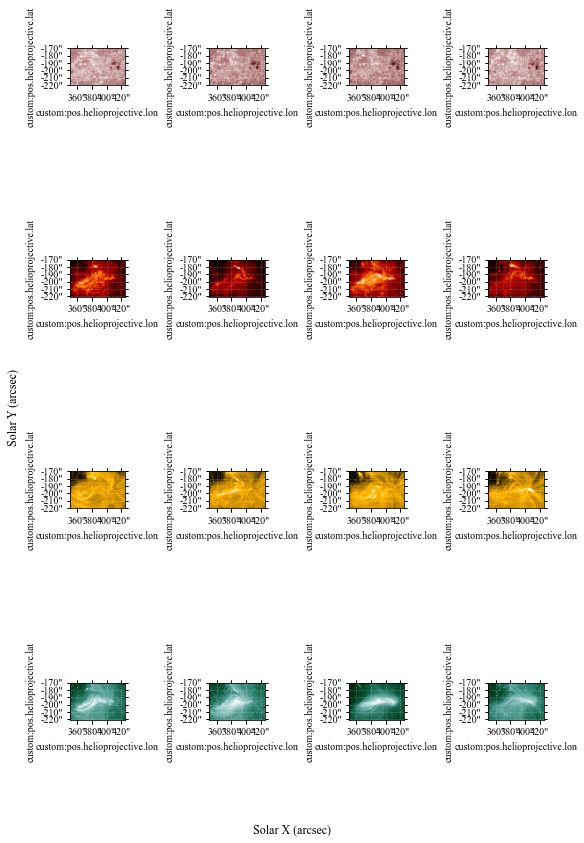

In [101]:
# plt.subplot(441)
# flare_1700[0].plot()
# plt.subplot(442)
# flare_1700[61].plot()
# plt.subplot(443)
# flare_1700[122].plot()
# plt.subplot(444)
# flare_1700[183].plot()

# plt.subplot(445)
# flare_304[0].plot
# plt.subplot(446)
# flare_304[94].plot
# plt.subplot(447)
# flare_304[188].plot
# plt.subplot(448)
# flare_304[283].plot()

# plt.subplot(449)
# flare_171[0].plot
# plt.subplot(4410)
# flare_171[134].plot
# plt.subplot(4411)
# flare_171[268].plot()
# plt.subplot(4412)
# flare_171[401].plot()

# plt.subplot(4413)
# flare_94[0].plot
# plt.subplot(4414)
# flare_94[137].plot
# plt.subplot(4415)
# flare_94[274].plot()
# plt.subplot(4416)
# flare_94[412].plot()

maps = [
    flare_1700[0],
    flare_1700[61],
    flare_1700[122],
    flare_1700[182],
    flare_304[0],
    flare_304[94],
    flare_304[188],
    flare_304[282],
    flare_171[0],
    flare_171[134],
    flare_171[268],
    flare_171[400],
    flare_94[0],
    flare_94[137],
    flare_94[274],
    flare_94[411],
]

# Set up the plot grid
fig = plt.figure(figsize=(8, 12), constrained_layout=True)
axes = []

# Create a 4x4 grid with WCS-compatible axes
for i in range(4):
    for j in range(4):
        ax = fig.add_subplot(4, 4, i * 4 + j + 1, projection=maps[i * 4 + j].wcs)
        axes.append(ax)

# Loop through the axes and SunPy maps to plot them
def plot_map(ax, smap):
    smap.plot(axes=ax, annotate=False)
    ax.set_xlabel('')  # Remove individual x-axis labels
    ax.set_ylabel('')  # Remove individual y-axis labels

for ax, smap in zip(axes, maps):
    plot_map(ax, smap)

# Add a single shared x-axis label and y-axis label
fig.supxlabel('Solar X (arcsec)')
fig.supylabel('Solar Y (arcsec)')


# Display the plot
plt.savefig("multiplewavebands.pdf", format="pdf", bbox_inches="tight")  # Use bbox_inches to trim whitespace

plt.show()

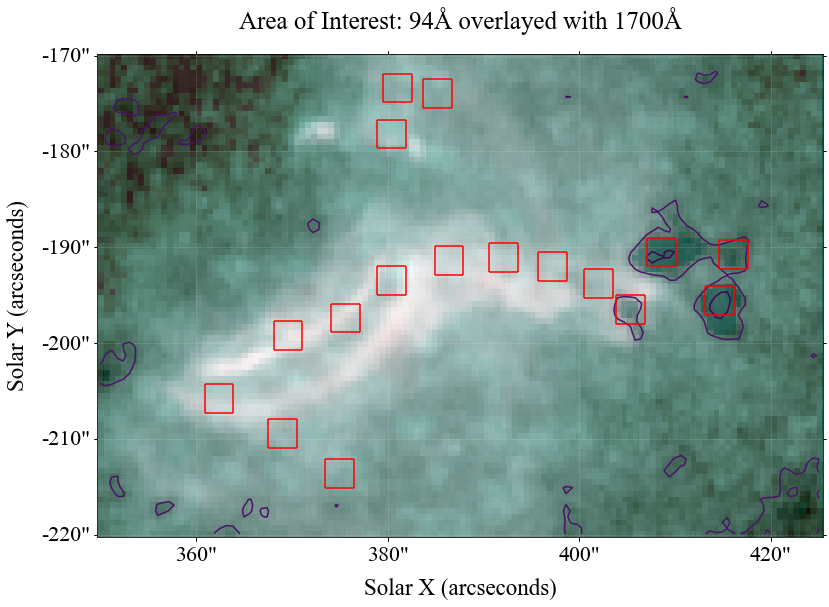

In [102]:
levels = [5,10,100]*u.percent

fig = plt.figure(figsize = (13,13))
ax = fig.add_subplot(projection=flare_94[0])
flare_94[0].plot(axes=ax, clip_interval=(1, 99.9)*u.percent, zorder=0)
flare_1700[0].plot(axes=ax, clip_interval=(1, 99.97)*u.percent, alpha=0.3,
              autoalign=True, zorder=1)
flare_1700[0].draw_contours(axes=ax, levels=levels, zorder=2)
ax.set_title("Area of Interest: 94Å overlayed with 1700Å", fontsize = 25,pad=25)
# plt.colorbar()
plt.xlabel('Solar X (arcseconds)',fontsize = 23)
plt.ylabel('Solar Y (arcseconds)',fontsize = 23)

ax.tick_params(axis='x', labelsize=22)  
ax.tick_params(axis='y', labelsize=22)
# box 1 
plt.hlines(37,30,35, color = 'red' )
plt.hlines(32,30,35, color = 'red' )
plt.vlines(30,32,37,color = 'red')
plt.vlines(35,32,37,color = 'red')


# box 2 done
plt.hlines(40,40,45, color = 'red' )
plt.hlines(35,40,45, color = 'red' )
plt.vlines(40,35,40,color = 'red')
plt.vlines(45,35,40,color = 'red')

# box 3
plt.hlines(41.5,48,53, color = 'red' )
plt.hlines(46.5,48,53, color = 'red' )
plt.vlines(48,46.5,41.5,color = 'red')
plt.vlines(53,46.5,41.5,color = 'red')

# box 4 done
plt.hlines(45,58,63, color = 'red' )
plt.hlines(50,58,63, color = 'red' )
plt.vlines(58,45,50,color = 'red')
plt.vlines(63,45,50,color = 'red')

# box 5
plt.hlines(45.5,67.5,72.5, color = 'red' )
plt.hlines(50.5,67.5,72.5, color = 'red' )
plt.vlines(67.5,45.5,50.5,color = 'red')
plt.vlines(72.5,45.5,50.5,color = 'red')

# box 6 done
plt.hlines(49,76,81, color = 'red' )
plt.hlines(44,76,81, color = 'red' )
plt.vlines(76,44,49,color = 'red')
plt.vlines(81,44,49,color = 'red')


# box 7
plt.hlines(46,84,89, color = 'red' )
plt.hlines(41,84,89, color = 'red' )
plt.vlines(84,41,46,color = 'red')
plt.vlines(89,41,46,color = 'red')

# box 8 done
plt.hlines(41.5,89.5,94.5, color = 'red' )
plt.hlines(36.5,89.5,94.5, color = 'red' )
plt.vlines(89.5,36.5,41.5,color = 'red')
plt.vlines(94.5,36.5,41.5,color = 'red')

#--------------------------------------------------------------------------------------------
# boxes around magnetic loops in the middle  (left to right)



plt.hlines(67,48,53, color = 'red' )
plt.hlines(72,48,53, color = 'red' )
plt.vlines(48,67,72,color = 'red')
plt.vlines(53,67,72,color = 'red')


plt.hlines(75,49,54, color = 'red' )
plt.hlines(80,49,54, color = 'red' )
plt.vlines(49,75,80,color = 'red')
plt.vlines(54,75,80,color = 'red')

plt.hlines(74,56,61, color = 'red' )
plt.hlines(79,56,61, color = 'red' )
plt.vlines(56,74,79,color = 'red')
plt.vlines(61,74,79,color = 'red')


#------------------------------------------------------------------------------------------------
# boxes around magnetic loops at the front (bottom to top)

plt.hlines(43,105,110, color = 'red' )
plt.hlines(38,105,110, color = 'red' )
plt.vlines(105,38,43,color = 'red')
plt.vlines(110,38,43,color = 'red')

plt.hlines(51,107.5,112.5, color = 'red' )
plt.hlines(46,107.5,112.5, color = 'red' )
plt.vlines(107.5,46,51,color = 'red')
plt.vlines(112.5,46,51,color = 'red')

plt.hlines(51.5,95,100, color = 'red' )
plt.hlines(46.5,95,100, color = 'red' )
plt.vlines(95,46.5,51.5,color = 'red')
plt.vlines(100,46.5,51.5,color = 'red')

#------------------------------------------------------------------------------------------------
# boxes at back of flare  (right to left)

plt.hlines(13,39,44, color = 'red' )
plt.hlines(8,39,44, color = 'red' )
plt.vlines(39,8,13,color = 'red')
plt.vlines(44,8,13,color = 'red')


plt.hlines(20,29,34, color = 'red' )
plt.hlines(15,29,34, color = 'red' )
plt.vlines(29,15,20,color = 'red')
plt.vlines(34,15,20,color = 'red')


plt.hlines(26,18,23, color = 'red' )
plt.hlines(21,18,23, color = 'red' )
plt.vlines(18,21,26,color = 'red')
plt.vlines(23,21,26,color = 'red')

plt.savefig("94_1700_overlay_map.pdf", format="pdf", bbox_inches="tight")  # Use bbox_inches to trim whitespace


plt.show()

In [103]:
maps_list = (maps_1700,maps_304,maps_171,maps_94)
cadence = (24,12,12,12)
box = (1,2,3,4)

In [104]:
def lightcurve_WFT(maps, BLx, BLy, TRx, TRy,cadence):

    sub = []
    for i in maps :
        bottom_left = SkyCoord(BLx * u.arcsec,BLy*u.arcsec, frame=i.coordinate_frame)
        top_right = SkyCoord(TRx * u.arcsec,TRy*u.arcsec, frame=i.coordinate_frame)    
        submap = i.submap(bottom_left=bottom_left, top_right=top_right)
        sub.append(submap)

    sub_intensity = intenisty_sum(sub)
    
    freqs, fft = windowed_fourier(sub_intensity,cadence)
    period = 1/freqs

    return sub_intensity , period,fft

# Boxes across the flare

# Box 1 Light Curve and Fourier Spectrum

In [105]:
BLx = 368.5
BLy = -201
TRx = 371.5  
TRy = -198
sub_intensity_1700_box1 , period_1700_box1, fft_1700_box1 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box1 , period_304_box1, fft_304_box1 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box1 , period_171_box1, fft_171_box1 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box1 , period_94_box1, fft_94_box1 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

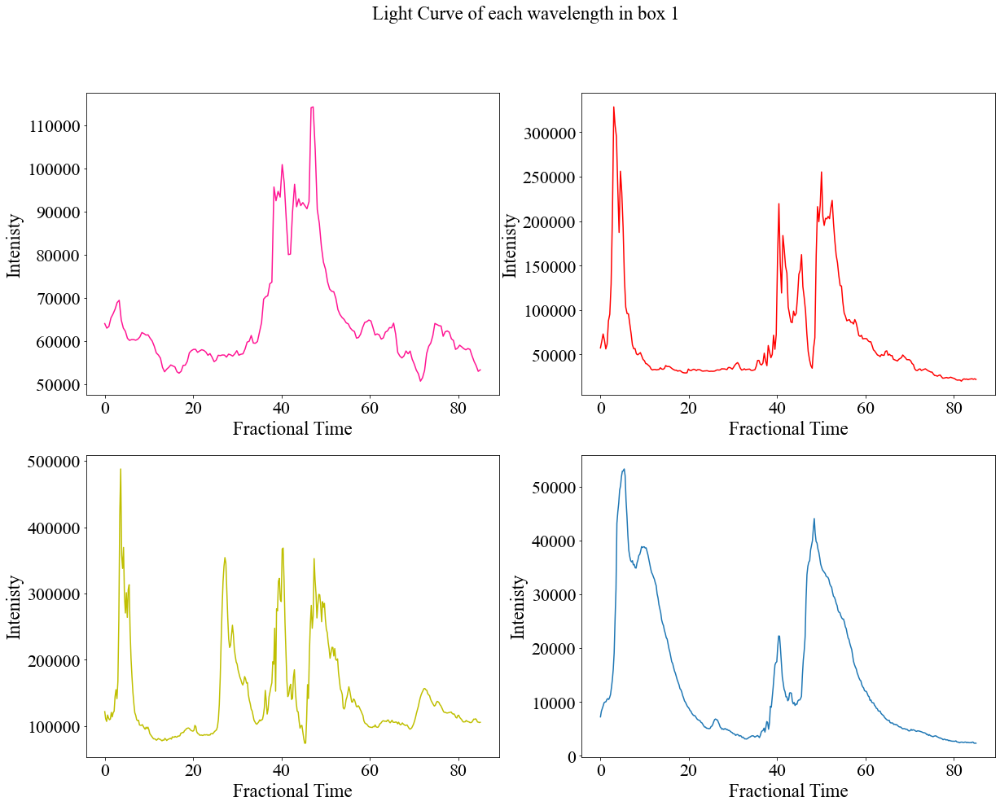

In [106]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 1',fontsize = 23)

plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box1,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22)
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box1,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22)
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box1,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22)
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box1)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/3104903841.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box1[1:200]),params_171_box1[1]*(np.log(period_304_box1[1:200]))+np.log(params_171_box1[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.0082095448345862
The gradient for the 304 waveband is 2.0746417026477215
The gradient for the 171 waveband is 1.7343560271896332
The gradient for the 94 waveband is 2.816254609179178


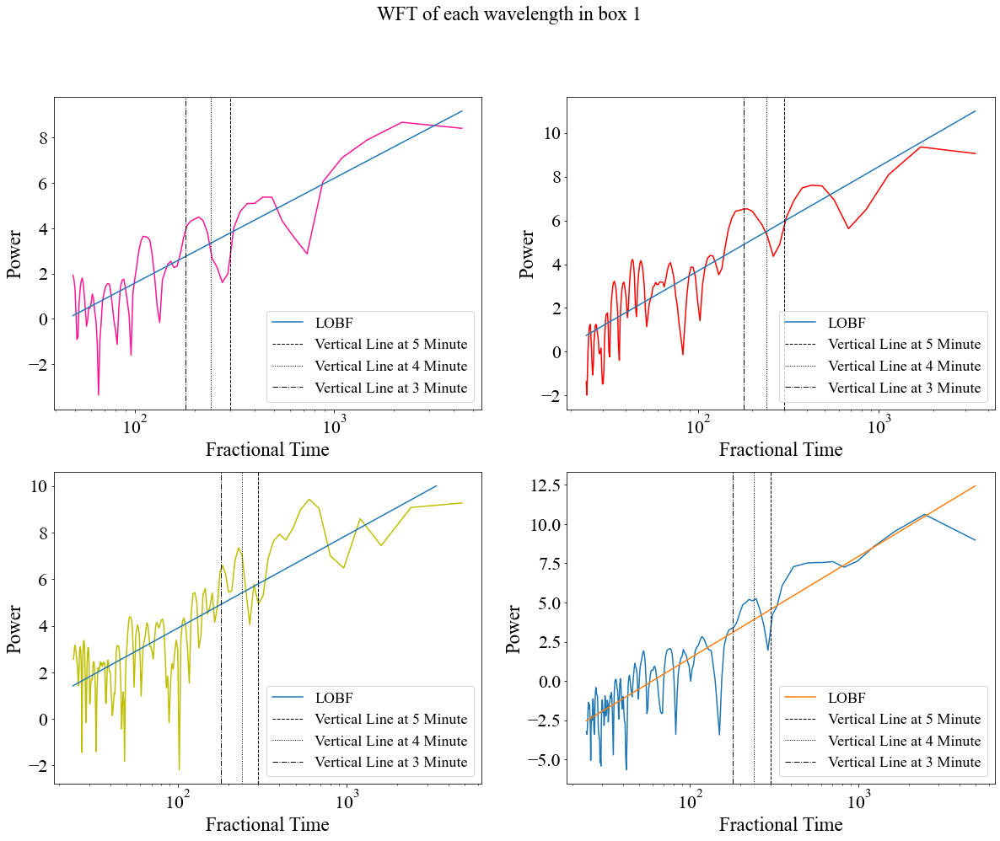

In [107]:
params_1700_box1,params_covarience = curve_fit(PowerFunction,period_1700_box1[1:91],np.log(fft_1700_box1[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box1 = PowerFunction((np.log(period_1700_box1[1:91])),(params_1700_box1[0]),(params_1700_box1[1]))

params_304_box1,params_covarience = curve_fit(PowerFunction,period_304_box1[1:141],np.log(fft_304_box1[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box1 = PowerFunction((np.log(period_304_box1[1:141])),(params_304_box1[0]),(params_304_box1[1]))

params_171_box1,params_covarience = curve_fit(PowerFunction,period_171_box1[1:200],np.log(fft_171_box1[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box1 = PowerFunction((np.log(period_171_box1[1:200])),(params_171_box1[0]),(params_171_box1[1]))

params_94_box1,params_covarience = curve_fit(PowerFunction,period_94_box1[1:205],np.log(fft_94_box1[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box1 = PowerFunction((np.log(period_94_box1[1:205])),(params_94_box1[0]),(params_94_box1[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box1[1]}')
print(f'The gradient for the 304 waveband is {params_304_box1[1]}')
print(f'The gradient for the 171 waveband is {params_171_box1[1]}')
print(f'The gradient for the 94 waveband is {params_94_box1[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 1',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box1[1:91]),np.log(fft_1700_box1[1:91]),color = 'deeppink')
plt.plot((period_1700_box1[1:91]),params_1700_box1[1]*(np.log(period_1700_box1[1:91]))+np.log(params_1700_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box1[1:141]),np.log(fft_304_box1[1:141]),color = 'red')
plt.plot((period_304_box1[1:141]),params_304_box1[1]*(np.log(period_304_box1[1:141]))+np.log(params_304_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box1[1:200]),np.log(fft_171_box1[1:200]),color = 'y')
plt.plot((period_304_box1[1:200]),params_171_box1[1]*(np.log(period_304_box1[1:200]))+np.log(params_171_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box1[1:205]),np.log(fft_94_box1[1:205]))
plt.plot((period_94_box1[1:205]),params_94_box1[1]*(np.log(period_94_box1[1:205]))+np.log(params_94_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)
plt.show()

# Box 2 Light Curve and Widowed Fourier Transform 

In [108]:
# box 1 

BLx = 375
BLy = -199
TRx = 378  
TRy = -196 
sub_intensity_1700_box1 , period_1700_box1, fft_1700_box1 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box1 , period_304_box1, fft_304_box1 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box1 , period_171_box1, fft_171_box1 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box1 , period_94_box1, fft_94_box1 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

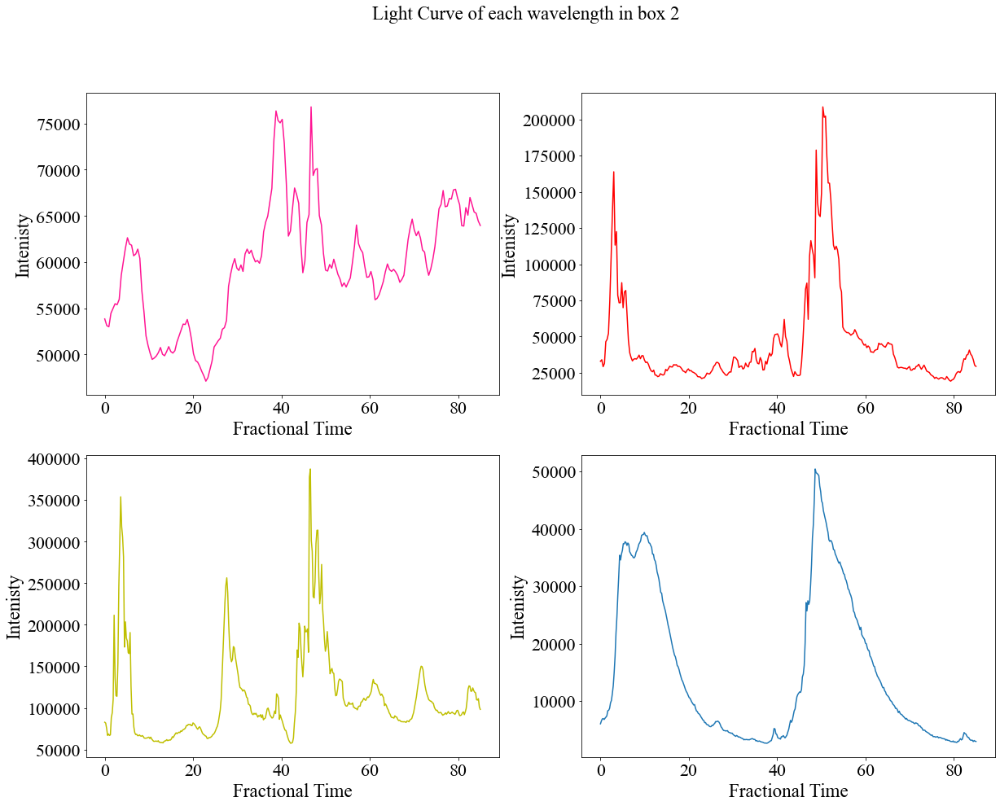

In [109]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 2',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box1,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box1,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box1,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box1)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/3353740707.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box1[1:200]),params_171_box1[1]*(np.log(period_304_box1[1:200]))+np.log(params_171_box1[0]),label = 'LOBF')


The gradient for the 1700 waveband is 1.6934095197565469
The gradient for the 304 waveband is 1.817413868499986
The gradient for the 171 waveband is 1.6712178600897212
The gradient for the 94 waveband is 2.626069145310352


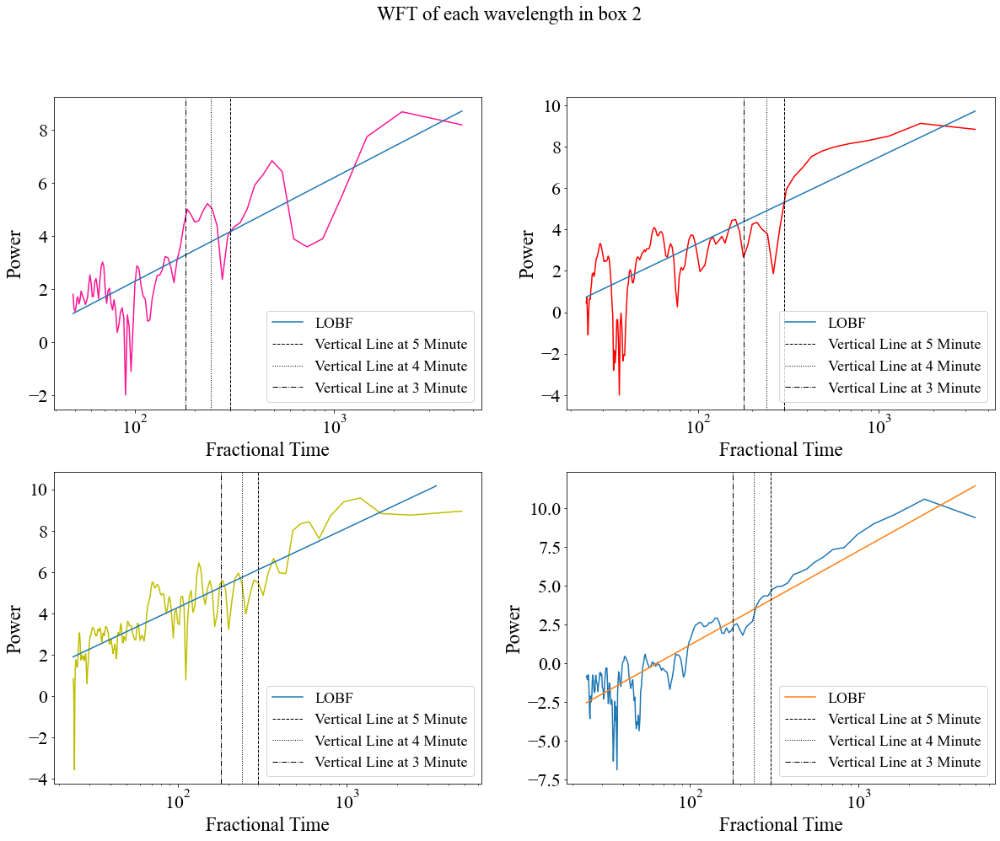

In [110]:
params_1700_box1,params_covarience = curve_fit(PowerFunction,period_1700_box1[1:91],np.log(fft_1700_box1[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box1 = PowerFunction((np.log(period_1700_box1[1:91])),(params_1700_box1[0]),(params_1700_box1[1]))

params_304_box1,params_covarience = curve_fit(PowerFunction,period_304_box1[1:141],np.log(fft_304_box1[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box1 = PowerFunction((np.log(period_304_box1[1:141])),(params_304_box1[0]),(params_304_box1[1]))

params_171_box1,params_covarience = curve_fit(PowerFunction,period_171_box1[1:200],np.log(fft_171_box1[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box1 = PowerFunction((np.log(period_171_box1[1:200])),(params_171_box1[0]),(params_171_box1[1]))

params_94_box1,params_covarience = curve_fit(PowerFunction,period_94_box1[1:205],np.log(fft_94_box1[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box1 = PowerFunction((np.log(period_94_box1[1:205])),(params_94_box1[0]),(params_94_box1[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box1[1]}')
print(f'The gradient for the 304 waveband is {params_304_box1[1]}')
print(f'The gradient for the 171 waveband is {params_171_box1[1]}')
print(f'The gradient for the 94 waveband is {params_94_box1[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 2',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box1[1:91]),np.log(fft_1700_box1[1:91]),color = 'deeppink')
plt.plot((period_1700_box1[1:91]),params_1700_box1[1]*(np.log(period_1700_box1[1:91]))+np.log(params_1700_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box1[1:141]),np.log(fft_304_box1[1:141]),color = 'red')
plt.plot((period_304_box1[1:141]),params_304_box1[1]*(np.log(period_304_box1[1:141]))+np.log(params_304_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box1[1:200]),np.log(fft_171_box1[1:200]),color = 'y')
plt.plot((period_304_box1[1:200]),params_171_box1[1]*(np.log(period_304_box1[1:200]))+np.log(params_171_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box1[1:205]),np.log(fft_94_box1[1:205]))
plt.plot((period_94_box1[1:205]),params_94_box1[1]*(np.log(period_94_box1[1:205]))+np.log(params_94_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

# Box 3 Fourier Transform and Light Curve

In [111]:
BLx = 379
BLy = -195
TRx = 382  
TRy = -192 
sub_intensity_1700_box2 , period_1700_box2, fft_1700_box2 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box2, period_304_box2, fft_304_box2 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box2 , period_171_box2, fft_171_box2 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box2 , period_94_box2, fft_94_box2 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

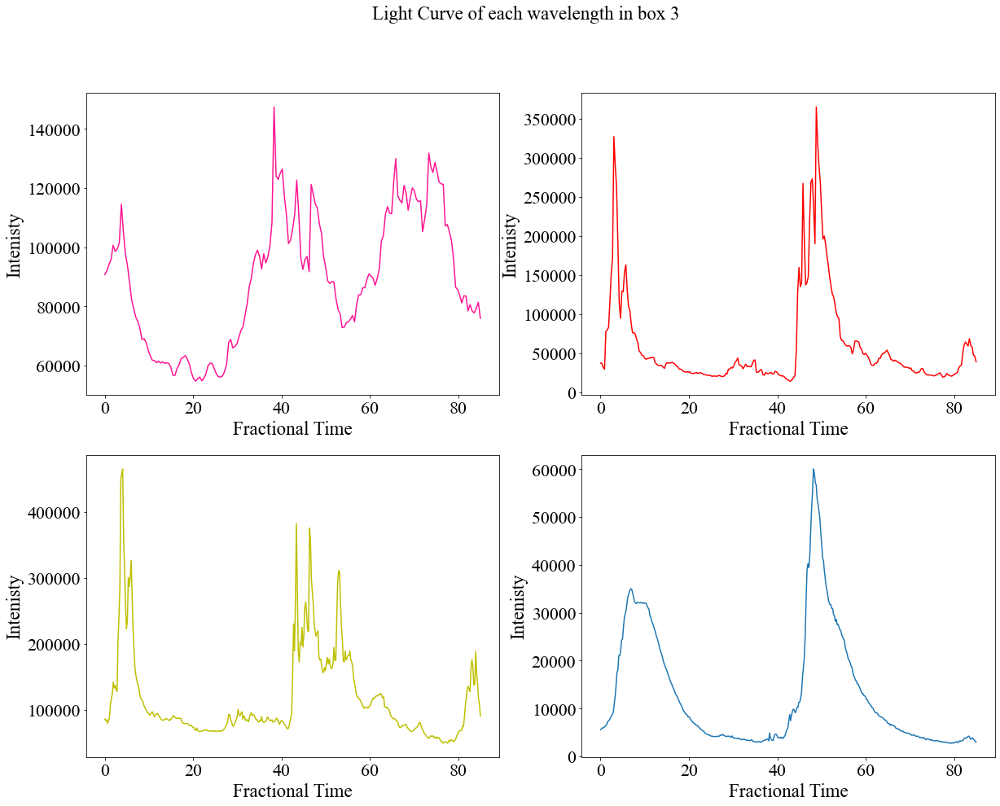

In [112]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 3',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box2,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box2,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box2,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box2)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/3067713649.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')


The gradient for the 1700 waveband is 1.5228114974507845
The gradient for the 304 waveband is 1.5064088269611056
The gradient for the 171 waveband is 1.8329798411709297
The gradient for the 94 waveband is 2.840725531203312


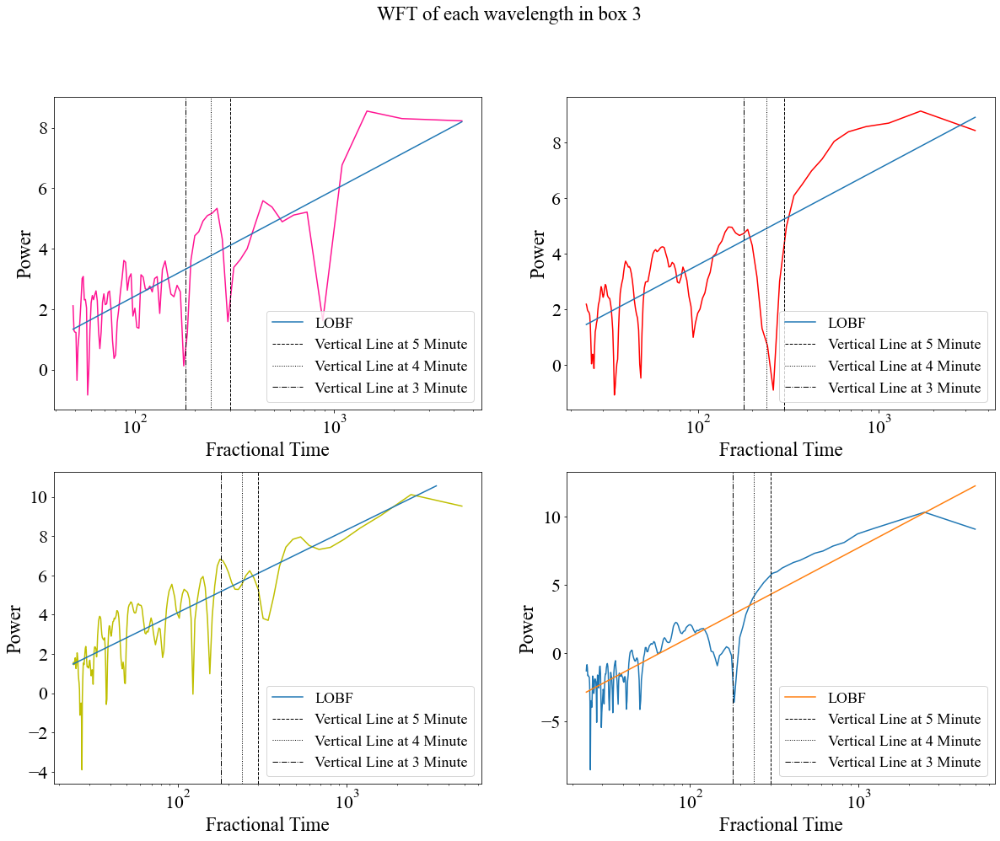

In [113]:
params_1700_box2,params_covarience = curve_fit(PowerFunction,period_1700_box2[1:91],np.log(fft_1700_box2[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box2 = PowerFunction((np.log(period_1700_box2[1:91])),(params_1700_box2[0]),(params_1700_box2[1]))

params_304_box2,params_covarience = curve_fit(PowerFunction,period_304_box2[1:141],np.log(fft_304_box2[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box2 = PowerFunction((np.log(period_304_box2[1:141])),(params_304_box2[0]),(params_304_box2[1]))

params_171_box2,params_covarience = curve_fit(PowerFunction,period_171_box2[1:200],np.log(fft_171_box2[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box2 = PowerFunction((np.log(period_171_box2[1:200])),(params_171_box2[0]),(params_171_box2[1]))

params_94_box2,params_covarience = curve_fit(PowerFunction,period_94_box2[1:205],np.log(fft_94_box2[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box2 = PowerFunction((np.log(period_94_box2[1:205])),(params_94_box2[0]),(params_94_box2[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box2[1]}')
print(f'The gradient for the 304 waveband is {params_304_box2[1]}')
print(f'The gradient for the 171 waveband is {params_171_box2[1]}')
print(f'The gradient for the 94 waveband is {params_94_box2[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 3',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box2[1:91]),np.log(fft_1700_box2[1:91]),color = 'deeppink')
plt.plot((period_1700_box2[1:91]),params_1700_box2[1]*(np.log(period_1700_box2[1:91]))+np.log(params_1700_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box2[1:141]),np.log(fft_304_box2[1:141]),color = 'red')
plt.plot((period_304_box2[1:141]),params_304_box2[1]*(np.log(period_304_box2[1:141]))+np.log(params_304_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box2[1:200]),np.log(fft_171_box2[1:200]),color = 'y')
plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box2[1:205]),np.log(fft_94_box2[1:205]))
plt.plot((period_94_box2[1:205]),params_94_box2[1]*(np.log(period_94_box2[1:205]))+np.log(params_94_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

# Box 4 Fourier Transform and Light Curve

In [114]:
BLx = 384
BLy = -193
TRx = 387  
TRy = -190
sub_intensity_1700_box2 , period_1700_box2, fft_1700_box2 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box2, period_304_box2, fft_304_box2 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box2 , period_171_box2, fft_171_box2 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box2 , period_94_box2, fft_94_box2 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

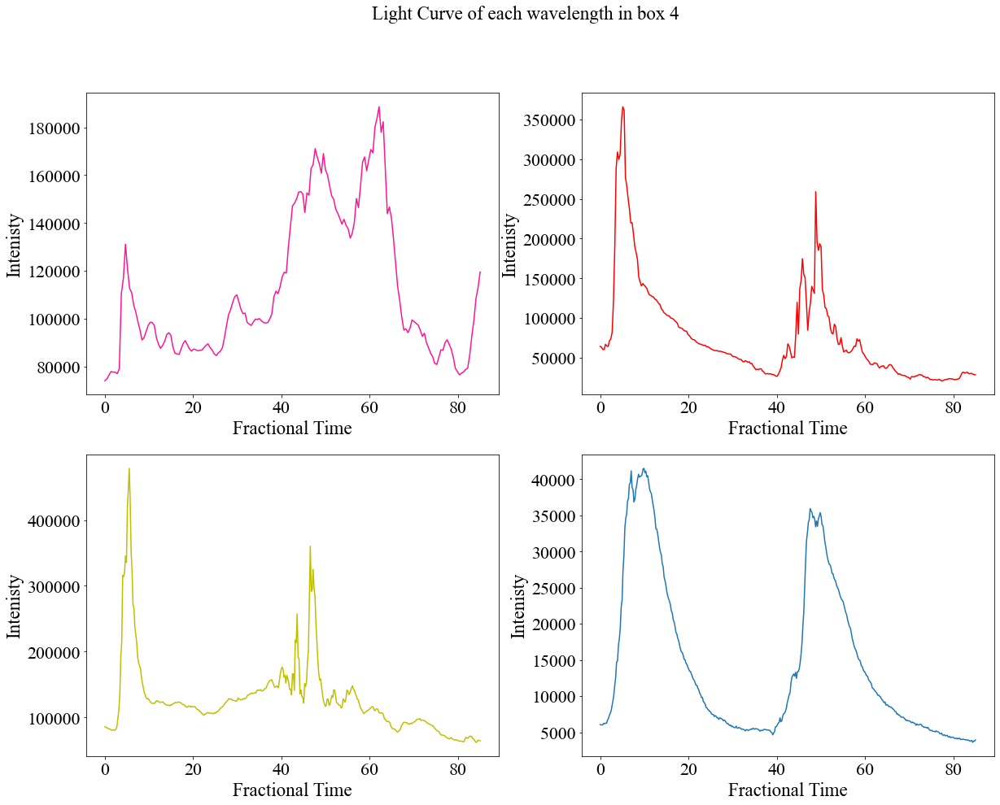

In [115]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 4',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box2,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box2,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box2,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box2)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/2452098811.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.1974265163031386
The gradient for the 304 waveband is 1.2847901334166583
The gradient for the 171 waveband is 1.6952096592732369
The gradient for the 94 waveband is 2.6835144681031795


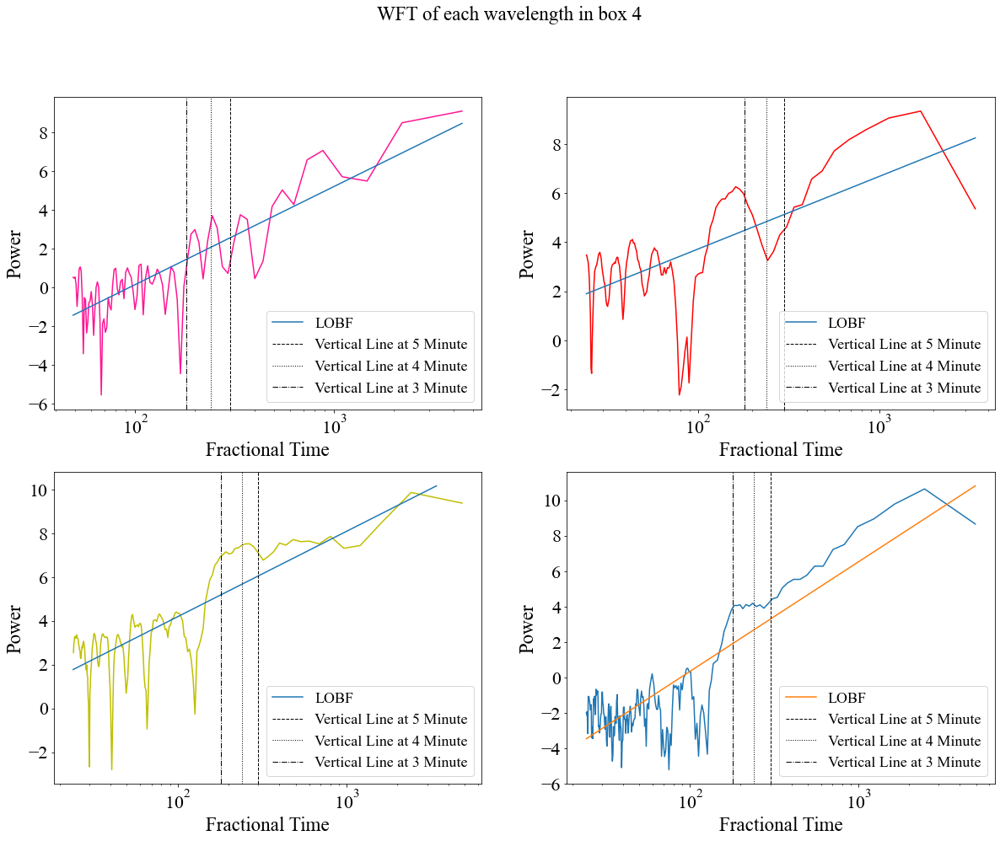

In [116]:
params_1700_box2,params_covarience = curve_fit(PowerFunction,period_1700_box2[1:91],np.log(fft_1700_box2[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box2 = PowerFunction((np.log(period_1700_box2[1:91])),(params_1700_box2[0]),(params_1700_box2[1]))

params_304_box2,params_covarience = curve_fit(PowerFunction,period_304_box2[1:141],np.log(fft_304_box2[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box2 = PowerFunction((np.log(period_304_box2[1:141])),(params_304_box2[0]),(params_304_box2[1]))

params_171_box2,params_covarience = curve_fit(PowerFunction,period_171_box2[1:200],np.log(fft_171_box2[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box2 = PowerFunction((np.log(period_171_box2[1:200])),(params_171_box2[0]),(params_171_box2[1]))

params_94_box2,params_covarience = curve_fit(PowerFunction,period_94_box2[1:205],np.log(fft_94_box2[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box2 = PowerFunction((np.log(period_94_box2[1:205])),(params_94_box2[0]),(params_94_box2[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box2[1]}')
print(f'The gradient for the 304 waveband is {params_304_box2[1]}')
print(f'The gradient for the 171 waveband is {params_171_box2[1]}')
print(f'The gradient for the 94 waveband is {params_94_box2[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 4',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box2[1:91]),np.log(fft_1700_box2[1:91]),color = 'deeppink')
plt.plot((period_1700_box2[1:91]),params_1700_box2[1]*(np.log(period_1700_box2[1:91]))+np.log(params_1700_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box2[1:141]),np.log(fft_304_box2[1:141]),color = 'red')
plt.plot((period_304_box2[1:141]),params_304_box2[1]*(np.log(period_304_box2[1:141]))+np.log(params_304_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box2[1:200]),np.log(fft_171_box2[1:200]),color = 'y')
plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box2[1:205]),np.log(fft_94_box2[1:205]))
plt.plot((period_94_box2[1:205]),params_94_box2[1]*(np.log(period_94_box2[1:205]))+np.log(params_94_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

# Box 5 Fourier Transfrom and Light Curve

In [117]:
BLx = 391
BLy = -193.5
TRx = 394  
TRy = -190.5
sub_intensity_1700_box3 , period_1700_box3, fft_1700_box3 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box3, period_304_box3, fft_304_box3 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box3 , period_171_box3, fft_171_box3 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box3 , period_94_box3, fft_94_box3 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

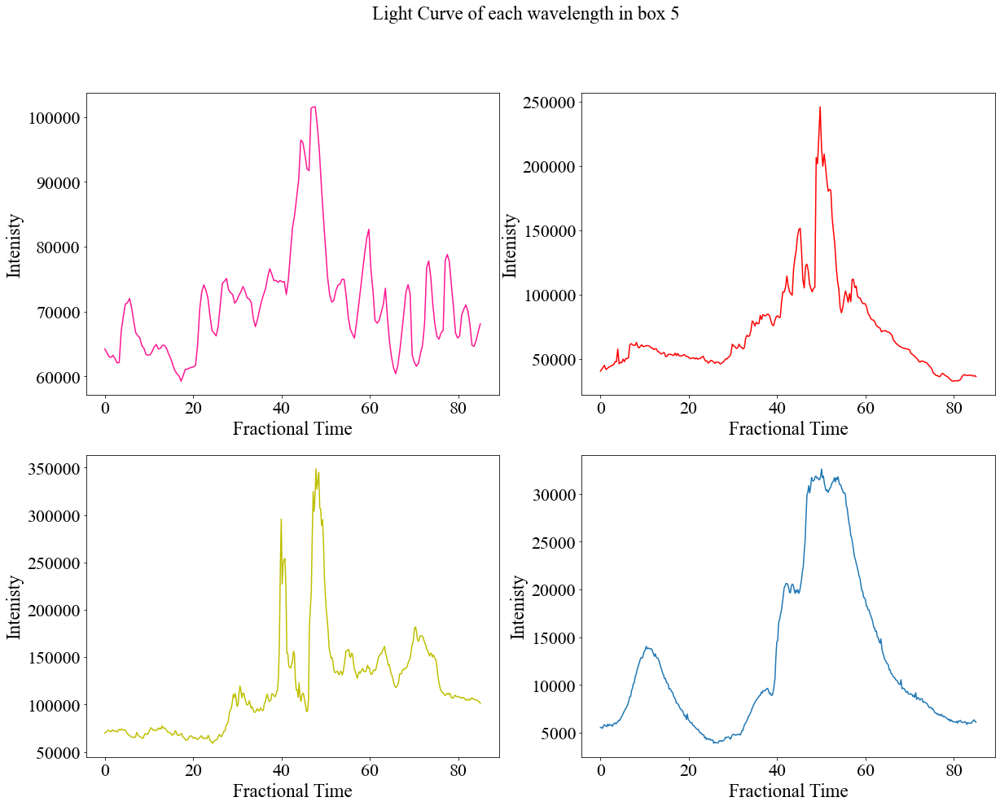

In [118]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 5',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box3,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box3,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box3,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box3)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/2859246018.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.6291903494862994
The gradient for the 304 waveband is 1.9090332242456736
The gradient for the 171 waveband is 2.076433851461981
The gradient for the 94 waveband is 2.4600742240455484


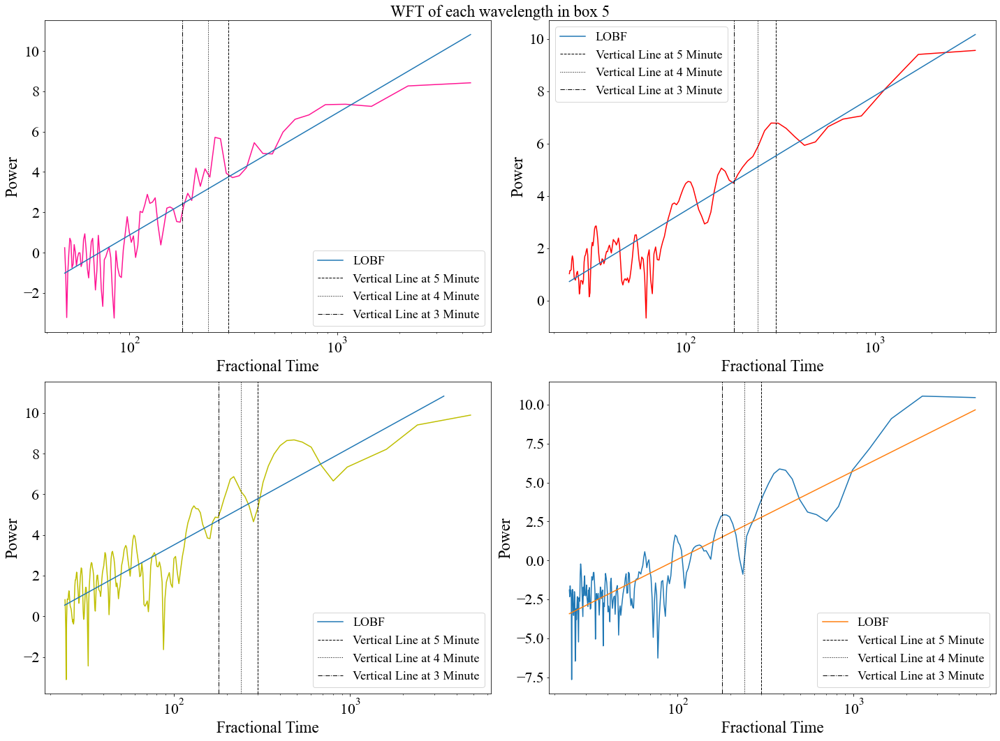

In [119]:
params_1700_box3,params_covarience = curve_fit(PowerFunction,period_1700_box3[1:91],np.log(fft_1700_box3[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box3 = PowerFunction((np.log(period_1700_box3[1:91])),(params_1700_box3[0]),(params_1700_box3[1]))

params_304_box3,params_covarience = curve_fit(PowerFunction,period_304_box3[1:141],np.log(fft_304_box3[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box3 = PowerFunction((np.log(period_304_box3[1:141])),(params_304_box3[0]),(params_304_box3[1]))

params_171_box3,params_covarience = curve_fit(PowerFunction,period_171_box3[1:200],np.log(fft_171_box3[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box3 = PowerFunction((np.log(period_171_box3[1:200])),(params_171_box3[0]),(params_171_box3[1]))

params_94_box3,params_covarience = curve_fit(PowerFunction,period_94_box3[1:205],np.log(fft_94_box3[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box3 = PowerFunction((np.log(period_94_box3[1:205])),(params_94_box3[0]),(params_94_box3[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box3[1]}')
print(f'The gradient for the 304 waveband is {params_304_box3[1]}')
print(f'The gradient for the 171 waveband is {params_171_box3[1]}')
print(f'The gradient for the 94 waveband is {params_94_box3[1]}')

plt.figure(figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 5',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box3[1:91]),np.log(fft_1700_box3[1:91]),color = 'deeppink')
plt.plot((period_1700_box3[1:91]),params_1700_box3[1]*(np.log(period_1700_box3[1:91]))+np.log(params_1700_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box3[1:141]),np.log(fft_304_box3[1:141]),color = 'red')
plt.plot((period_304_box3[1:141]),params_304_box3[1]*(np.log(period_304_box3[1:141]))+np.log(params_304_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box3[1:200]),np.log(fft_171_box3[1:200]),color = 'y')
plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box3[1:205]),np.log(fft_94_box3[1:205]))
plt.plot((period_94_box3[1:205]),params_94_box3[1]*(np.log(period_94_box3[1:205]))+np.log(params_94_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.tight_layout()
plt.show()

# Box 6 Fourier Transform and Light Curve 

In [120]:
BLx = 396
BLy = -194
TRx = 399  
TRy = -191 
sub_intensity_1700_box3 , period_1700_box3, fft_1700_box3 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box3, period_304_box3, fft_304_box3 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box3 , period_171_box3, fft_171_box3 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box3 , period_94_box3, fft_94_box3 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

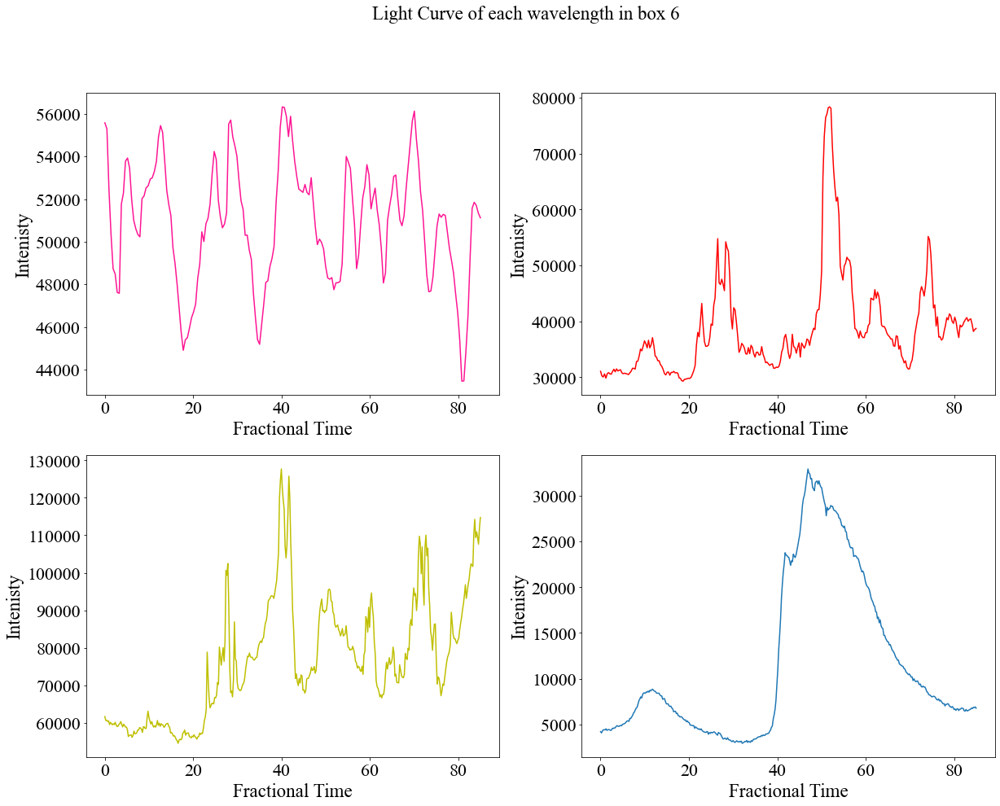

In [121]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 6',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box3,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box3,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box3,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box3)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/3558289098.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.144150664384891
The gradient for the 304 waveband is 2.3710228038906562
The gradient for the 171 waveband is 2.158703605421047
The gradient for the 94 waveband is 2.7797556690584715


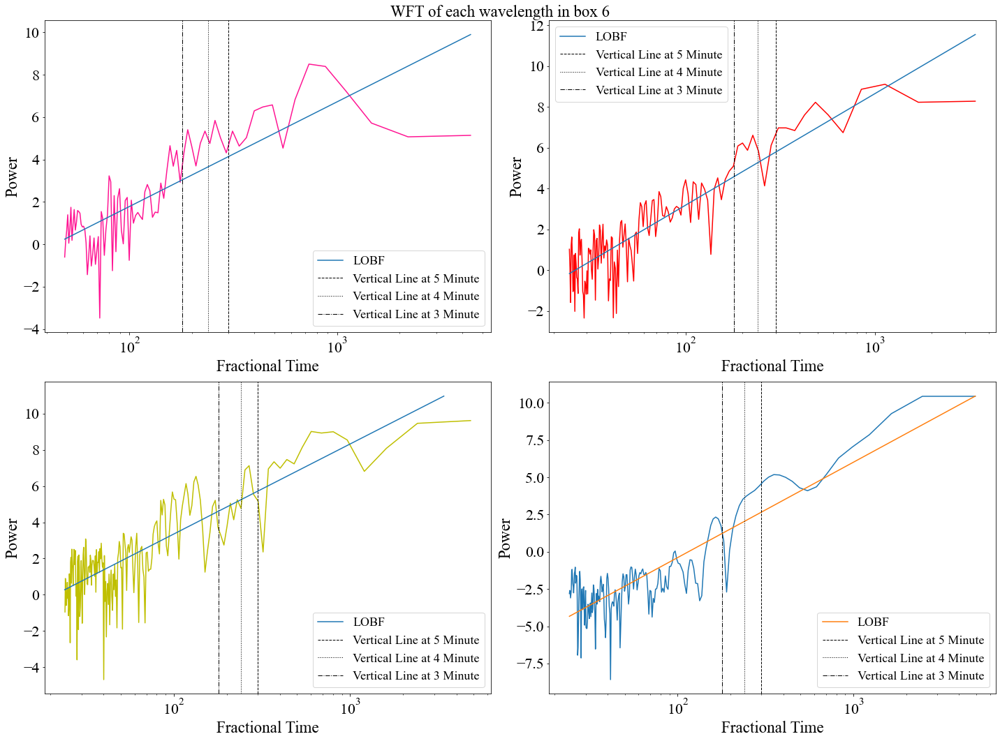

In [122]:
params_1700_box3,params_covarience = curve_fit(PowerFunction,period_1700_box3[1:91],np.log(fft_1700_box3[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box3 = PowerFunction((np.log(period_1700_box3[1:91])),(params_1700_box3[0]),(params_1700_box3[1]))

params_304_box3,params_covarience = curve_fit(PowerFunction,period_304_box3[1:141],np.log(fft_304_box3[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box3 = PowerFunction((np.log(period_304_box3[1:141])),(params_304_box3[0]),(params_304_box3[1]))

params_171_box3,params_covarience = curve_fit(PowerFunction,period_171_box3[1:200],np.log(fft_171_box3[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box3 = PowerFunction((np.log(period_171_box3[1:200])),(params_171_box3[0]),(params_171_box3[1]))

params_94_box3,params_covarience = curve_fit(PowerFunction,period_94_box3[1:205],np.log(fft_94_box3[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box3 = PowerFunction((np.log(period_94_box3[1:205])),(params_94_box3[0]),(params_94_box3[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box3[1]}')
print(f'The gradient for the 304 waveband is {params_304_box3[1]}')
print(f'The gradient for the 171 waveband is {params_171_box3[1]}')
print(f'The gradient for the 94 waveband is {params_94_box3[1]}')

plt.figure(figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 6',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box3[1:91]),np.log(fft_1700_box3[1:91]),color = 'deeppink')
plt.plot((period_1700_box3[1:91]),params_1700_box3[1]*(np.log(period_1700_box3[1:91]))+np.log(params_1700_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box3[1:141]),np.log(fft_304_box3[1:141]),color = 'red')
plt.plot((period_304_box3[1:141]),params_304_box3[1]*(np.log(period_304_box3[1:141]))+np.log(params_304_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box3[1:200]),np.log(fft_171_box3[1:200]),color = 'y')
plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box3[1:205]),np.log(fft_94_box3[1:205]))
plt.plot((period_94_box3[1:205]),params_94_box3[1]*(np.log(period_94_box3[1:205]))+np.log(params_94_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.tight_layout()
plt.show()

# Box 7 fourier Transform and Light Curve 

In [123]:
BLx = 400.5
BLy = -195
TRx = 403.5  
TRy = -192  
sub_intensity_1700_box4 , period_1700_box4, fft_1700_box4 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box4, period_304_box4, fft_304_box4 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box4 , period_171_box4, fft_171_box4 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box4 , period_94_box4, fft_94_box4 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

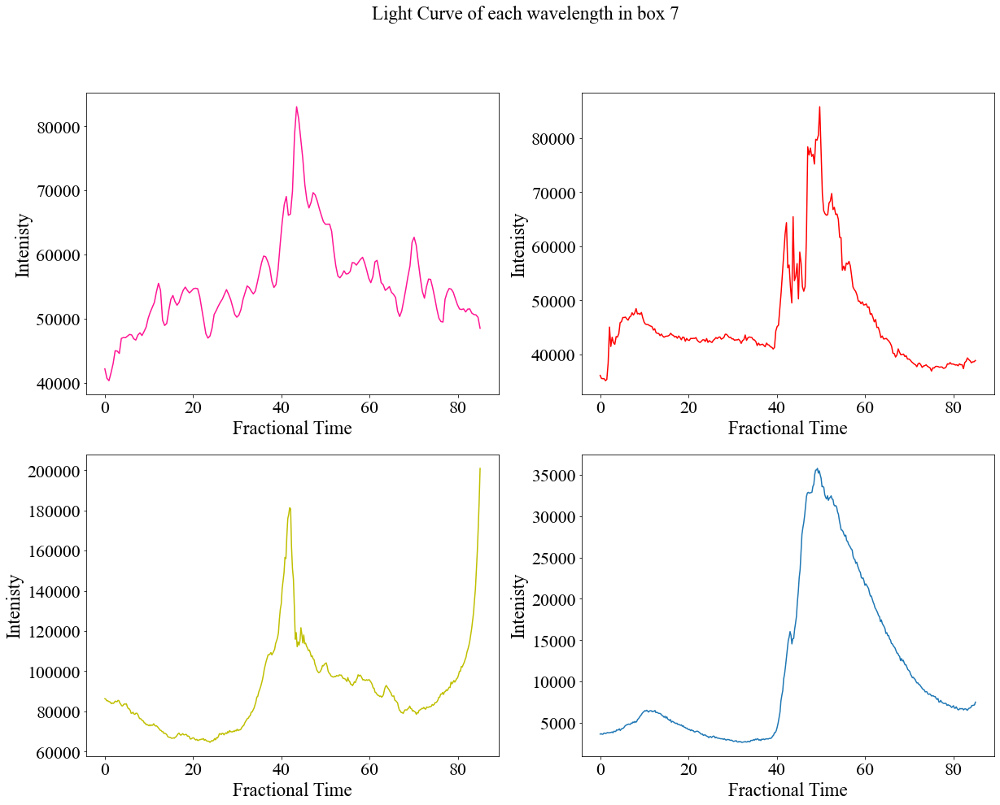

In [124]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 7',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box4,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box4,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box4,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box4)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/436954014.py:51: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box4[1:200]),params_171_box4[1]*(np.log(period_304_box4[1:200]))+np.log(params_171_box4[0]),label = 'LOBF')


The gradient for the 1700 waveband is 3.087820693060838
The gradient for the 304 waveband is 1.818822737548546
The gradient for the 171 waveband is 2.570944332182214
The gradient for the 94 waveband is 2.748502802844913


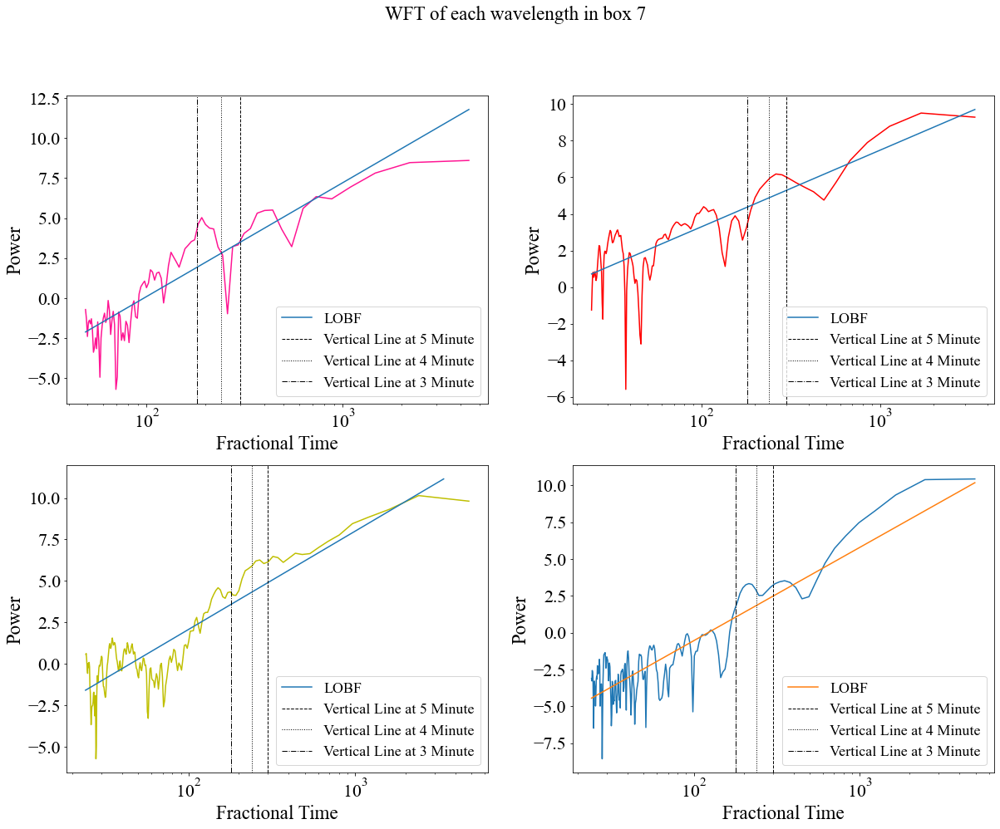

In [125]:
params_1700_box4,params_covarience = curve_fit(PowerFunction,period_1700_box4[1:91],np.log(fft_1700_box4[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box4 = PowerFunction((np.log(period_1700_box4[1:91])),(params_1700_box4[0]),(params_1700_box4[1]))

params_304_box4,params_covarience = curve_fit(PowerFunction,period_304_box4[1:141],np.log(fft_304_box4[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box4 = PowerFunction((np.log(period_304_box4[1:141])),(params_304_box4[0]),(params_304_box4[1]))

params_171_box4,params_covarience = curve_fit(PowerFunction,period_171_box4[1:200],np.log(fft_171_box4[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box4 = PowerFunction((np.log(period_171_box4[1:200])),(params_171_box4[0]),(params_171_box4[1]))

params_94_box4,params_covarience = curve_fit(PowerFunction,period_94_box4[1:205],np.log(fft_94_box4[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box4 = PowerFunction((np.log(period_94_box4[1:205])),(params_94_box4[0]),(params_94_box4[1]))


print(f'The gradient for the 1700 waveband is {params_1700_box4[1]}')
print(f'The gradient for the 304 waveband is {params_304_box4[1]}')
print(f'The gradient for the 171 waveband is {params_171_box4[1]}')
print(f'The gradient for the 94 waveband is {params_94_box4[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 7',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box4[1:91]),np.log(fft_1700_box4[1:91]),color = 'deeppink')
plt.plot((period_1700_box4[1:91]),params_1700_box4[1]*(np.log(period_1700_box4[1:91]))+np.log(params_1700_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box4[1:141]),np.log(fft_304_box4[1:141]),color = 'red')
plt.plot((period_304_box4[1:141]),params_304_box4[1]*(np.log(period_304_box4[1:141]))+np.log(params_304_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box4[1:200]),np.log(fft_171_box4[1:200]),color = 'y')
plt.plot((period_304_box4[1:200]),params_171_box4[1]*(np.log(period_304_box4[1:200]))+np.log(params_171_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box4[1:205]),np.log(fft_94_box4[1:205]))
plt.plot((period_94_box4[1:205]),params_94_box4[1]*(np.log(period_94_box4[1:205]))+np.log(params_94_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

# Box 8 Wndowed Fourier Tranform and Light Curve

In [126]:
BLx = 402
BLy = -195
TRx = 405  
TRy = -192
sub_intensity_1700_box4 , period_1700_box4, fft_1700_box4 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box4, period_304_box4, fft_304_box4 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box4 , period_171_box4, fft_171_box4 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box4 , period_94_box4, fft_94_box4 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

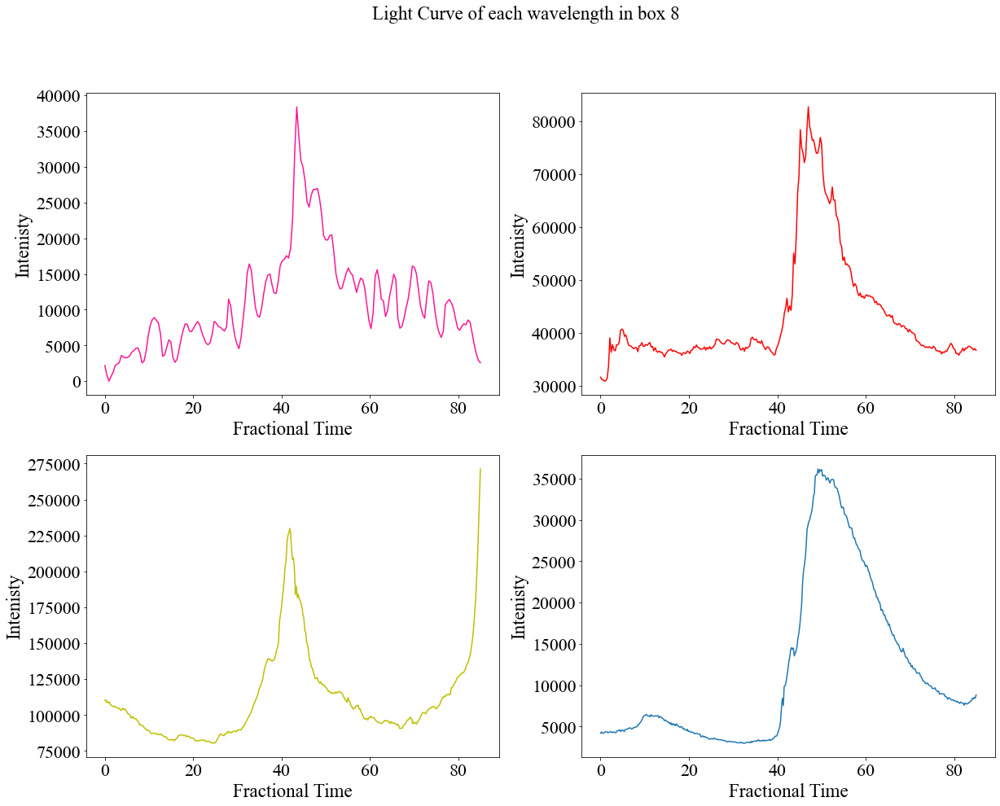

In [127]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 8',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box4-np.min(sub_intensity_1700_box4),color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box4,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box4,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box4)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

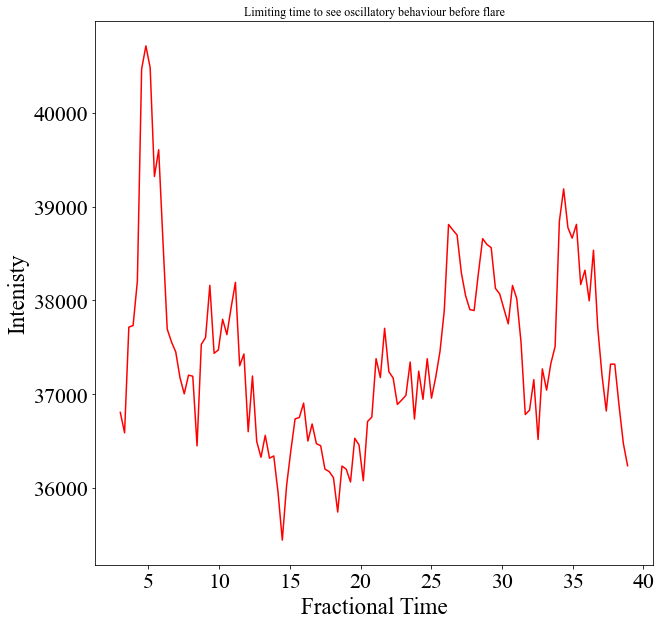

In [128]:

plt.figure(figsize = (10,10))
plt.plot(time_304[10:130],sub_intensity_304_box4[10:130],color = 'red')
plt.title('Limiting time to see oscillatory behaviour before flare')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/954397579.py:51: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box4[1:200]),params_171_box4[1]*(np.log(period_304_box4[1:200]))+np.log(params_171_box4[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.859334095821959
The gradient for the 304 waveband is 2.34675769339557
The gradient for the 171 waveband is 2.4569606644990865
The gradient for the 94 waveband is 2.46614490307021


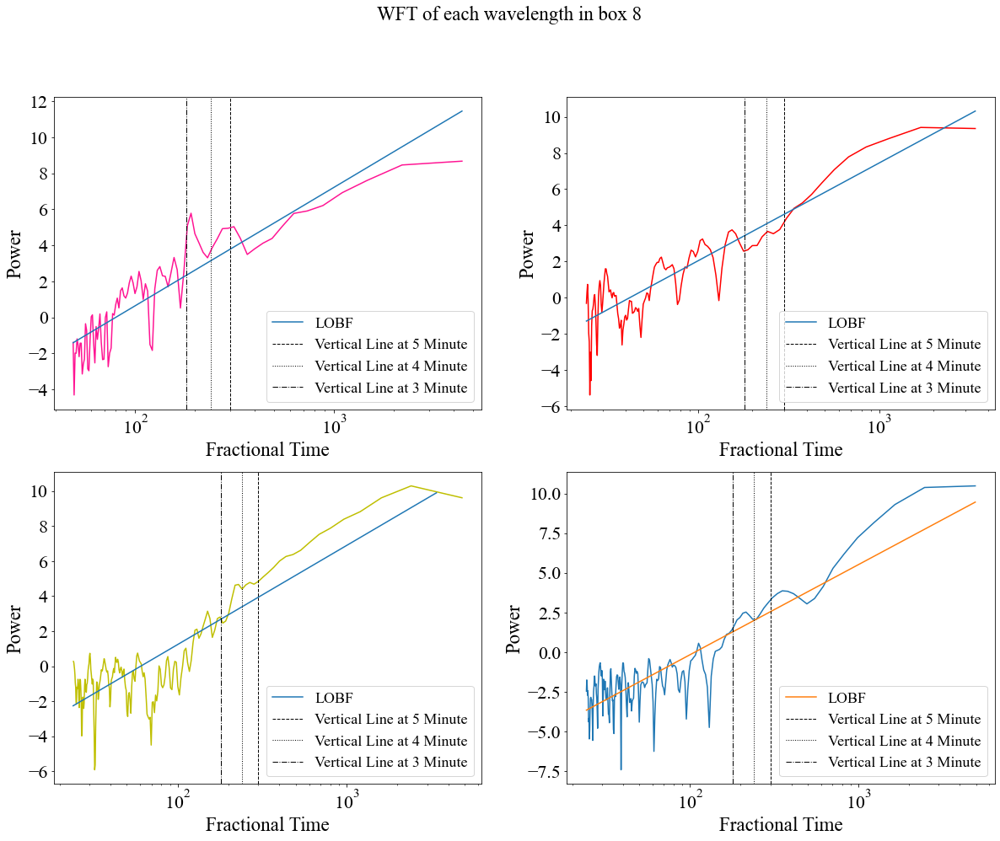

In [129]:
params_1700_box4,params_covarience = curve_fit(PowerFunction,period_1700_box4[1:91],np.log(fft_1700_box4[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box4 = PowerFunction((np.log(period_1700_box4[1:91])),(params_1700_box4[0]),(params_1700_box4[1]))

params_304_box4,params_covarience = curve_fit(PowerFunction,period_304_box4[1:141],np.log(fft_304_box4[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box4 = PowerFunction((np.log(period_304_box4[1:141])),(params_304_box4[0]),(params_304_box4[1]))

params_171_box4,params_covarience = curve_fit(PowerFunction,period_171_box4[1:200],np.log(fft_171_box4[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box4 = PowerFunction((np.log(period_171_box4[1:200])),(params_171_box4[0]),(params_171_box4[1]))

params_94_box4,params_covarience = curve_fit(PowerFunction,period_94_box4[1:205],np.log(fft_94_box4[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box4 = PowerFunction((np.log(period_94_box4[1:205])),(params_94_box4[0]),(params_94_box4[1]))


print(f'The gradient for the 1700 waveband is {params_1700_box4[1]}')
print(f'The gradient for the 304 waveband is {params_304_box4[1]}')
print(f'The gradient for the 171 waveband is {params_171_box4[1]}')
print(f'The gradient for the 94 waveband is {params_94_box4[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 8',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box4[1:91]),np.log(fft_1700_box4[1:91]),color = 'deeppink')
plt.plot((period_1700_box4[1:91]),params_1700_box4[1]*(np.log(period_1700_box4[1:91]))+np.log(params_1700_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box4[1:141]),np.log(fft_304_box4[1:141]),color = 'red')
plt.plot((period_304_box4[1:141]),params_304_box4[1]*(np.log(period_304_box4[1:141]))+np.log(params_304_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box4[1:200]),np.log(fft_171_box4[1:200]),color = 'y')
plt.plot((period_304_box4[1:200]),params_171_box4[1]*(np.log(period_304_box4[1:200]))+np.log(params_171_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box4[1:205]),np.log(fft_94_box4[1:205]))
plt.plot((period_94_box4[1:205]),params_94_box4[1]*(np.log(period_94_box4[1:205]))+np.log(params_94_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

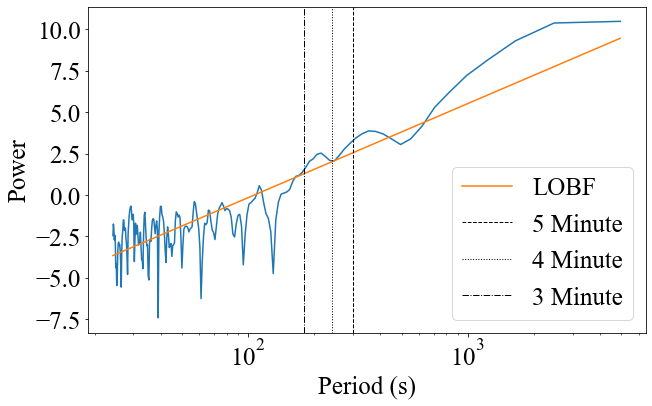

In [130]:
plt.figure(figsize = (10,6))
plt.plot((period_94_box4[1:205]),np.log(fft_94_box4[1:205]))
plt.plot((period_94_box4[1:205]),params_94_box4[1]*(np.log(period_94_box4[1:205]))+np.log(params_94_box4[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='3 Minute')
plt.xlabel('Period (s)',fontsize = 25)
plt.ylabel('Power',fontsize = 25)
plt.yticks(fontsize=25) 
plt.xticks(fontsize=25)
plt.legend(fontsize = 25, loc = 'lower right')

plt.savefig("Bad_Function_94_2.pdf", format="pdf", bbox_inches="tight")  # Use bbox_inches to trim whitespace

plt.show()

# Boxes around the top middle (left to right)

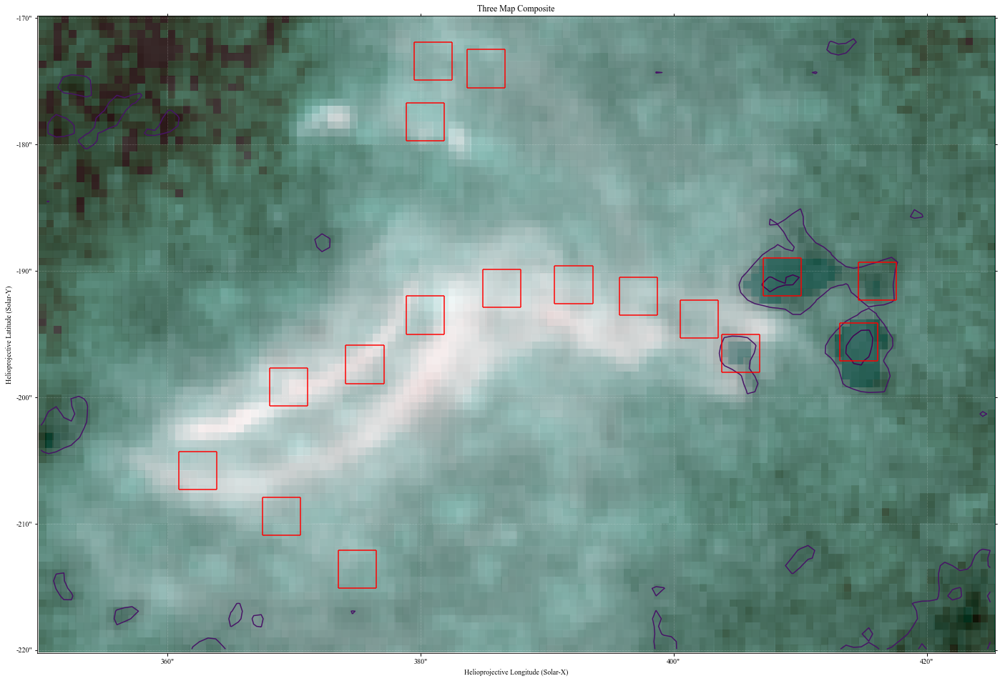

In [131]:
levels = [5,10,100]*u.percent

fig = plt.figure(figsize = (24,24))
ax = fig.add_subplot(projection=flare_94[0])
flare_94[0].plot(axes=ax, clip_interval=(1, 99.9)*u.percent, zorder=0)
flare_1700[0].plot(axes=ax, clip_interval=(1, 99.97)*u.percent, alpha=0.3,
              autoalign=True, zorder=1)
flare_1700[0].draw_contours(axes=ax, levels=levels, zorder=2)
ax.set_title("Three Map Composite")
# plt.colorbar()

# box 1 
plt.hlines(37,30,35, color = 'red' )
plt.hlines(32,30,35, color = 'red' )
plt.vlines(30,32,37,color = 'red')
plt.vlines(35,32,37,color = 'red')


# box 2 done
plt.hlines(40,40,45, color = 'red' )
plt.hlines(35,40,45, color = 'red' )
plt.vlines(40,35,40,color = 'red')
plt.vlines(45,35,40,color = 'red')

# box 3
plt.hlines(41.5,48,53, color = 'red' )
plt.hlines(46.5,48,53, color = 'red' )
plt.vlines(48,46.5,41.5,color = 'red')
plt.vlines(53,46.5,41.5,color = 'red')

# box 4 done
plt.hlines(45,58,63, color = 'red' )
plt.hlines(50,58,63, color = 'red' )
plt.vlines(58,45,50,color = 'red')
plt.vlines(63,45,50,color = 'red')

# box 5
plt.hlines(45.5,67.5,72.5, color = 'red' )
plt.hlines(50.5,67.5,72.5, color = 'red' )
plt.vlines(67.5,45.5,50.5,color = 'red')
plt.vlines(72.5,45.5,50.5,color = 'red')

# box 6 done
plt.hlines(49,76,81, color = 'red' )
plt.hlines(44,76,81, color = 'red' )
plt.vlines(76,44,49,color = 'red')
plt.vlines(81,44,49,color = 'red')


# box 7
plt.hlines(46,84,89, color = 'red' )
plt.hlines(41,84,89, color = 'red' )
plt.vlines(84,41,46,color = 'red')
plt.vlines(89,41,46,color = 'red')

# box 8 done
plt.hlines(41.5,89.5,94.5, color = 'red' )
plt.hlines(36.5,89.5,94.5, color = 'red' )
plt.vlines(89.5,36.5,41.5,color = 'red')
plt.vlines(94.5,36.5,41.5,color = 'red')

#--------------------------------------------------------------------------------------------
# boxes around magnetic loops in the middle  (left to right)



plt.hlines(67,48,53, color = 'red' )
plt.hlines(72,48,53, color = 'red' )
plt.vlines(48,67,72,color = 'red')
plt.vlines(53,67,72,color = 'red')


plt.hlines(75,49,54, color = 'red' )
plt.hlines(80,49,54, color = 'red' )
plt.vlines(49,75,80,color = 'red')
plt.vlines(54,75,80,color = 'red')

plt.hlines(74,56,61, color = 'red' )
plt.hlines(79,56,61, color = 'red' )
plt.vlines(56,74,79,color = 'red')
plt.vlines(61,74,79,color = 'red')


#------------------------------------------------------------------------------------------------
# boxes around magnetic loops at the front (bottom to top)

plt.hlines(43,105,110, color = 'red' )
plt.hlines(38,105,110, color = 'red' )
plt.vlines(105,38,43,color = 'red')
plt.vlines(110,38,43,color = 'red')

plt.hlines(51,107.5,112.5, color = 'red' )
plt.hlines(46,107.5,112.5, color = 'red' )
plt.vlines(107.5,46,51,color = 'red')
plt.vlines(112.5,46,51,color = 'red')

plt.hlines(51.5,95,100, color = 'red' )
plt.hlines(46.5,95,100, color = 'red' )
plt.vlines(95,46.5,51.5,color = 'red')
plt.vlines(100,46.5,51.5,color = 'red')

#------------------------------------------------------------------------------------------------
# boxes at back of flare  (right to left)

plt.hlines(13,39,44, color = 'red' )
plt.hlines(8,39,44, color = 'red' )
plt.vlines(39,8,13,color = 'red')
plt.vlines(44,8,13,color = 'red')


plt.hlines(20,29,34, color = 'red' )
plt.hlines(15,29,34, color = 'red' )
plt.vlines(29,15,20,color = 'red')
plt.vlines(34,15,20,color = 'red')


plt.hlines(26,18,23, color = 'red' )
plt.hlines(21,18,23, color = 'red' )
plt.vlines(18,21,26,color = 'red')
plt.vlines(23,21,26,color = 'red')

plt.show()

# Box 1 (left most)

In [132]:
BLx = 379
BLy = -179.5
TRx = 382  
TRy = -176.5  
sub_intensity_1700_box1 , period_1700_box1, fft_1700_box1 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box1, period_304_box1, fft_304_box1 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box1 , period_171_box1, fft_171_box1 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box1 , period_94_box1, fft_94_box1 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

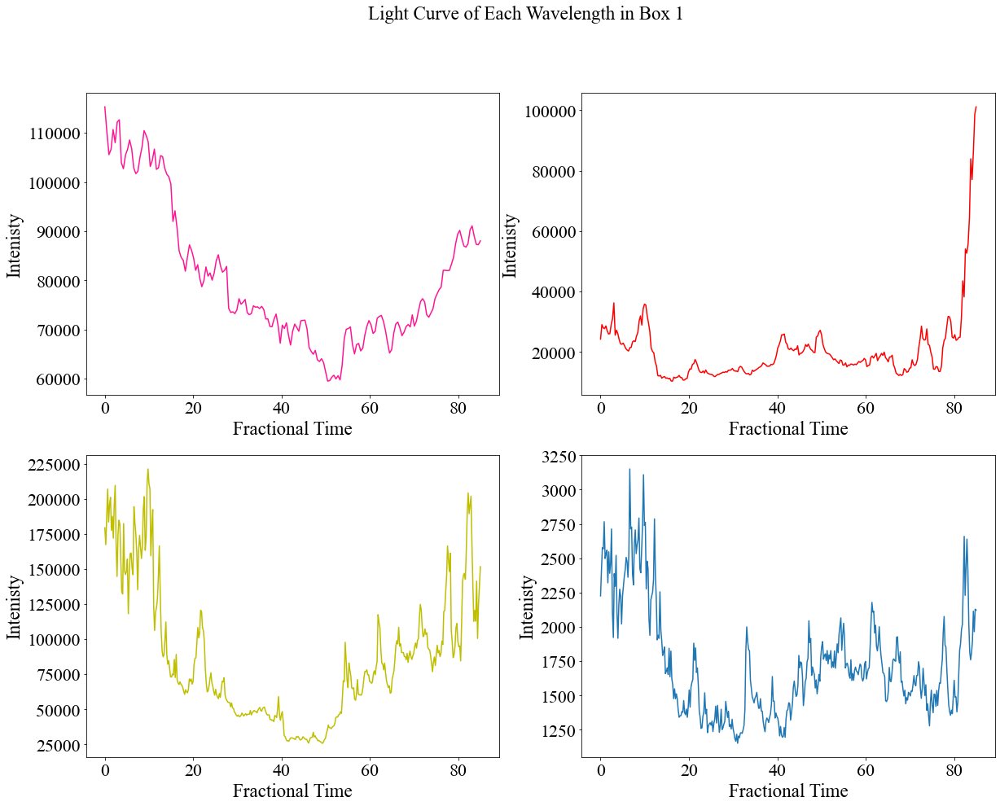

In [133]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of Each Wavelength in Box 1', fontsize=23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box1,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box1,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box1,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box1)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

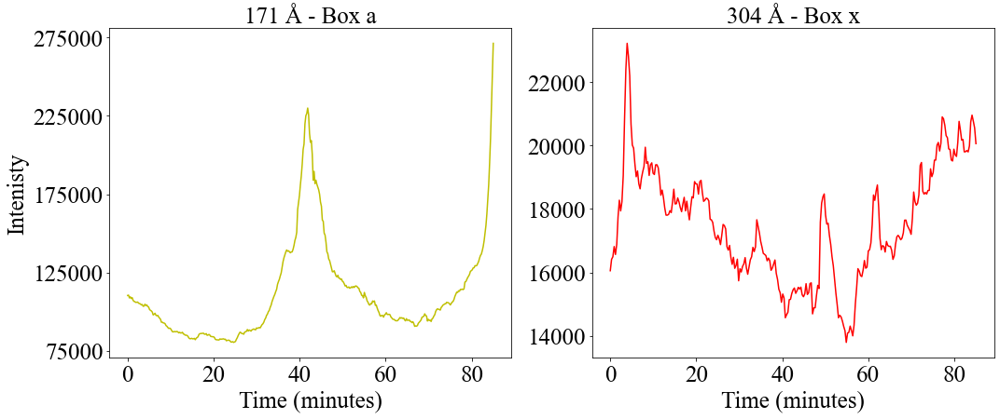

In [209]:
# plt.figure(figsize=(10,10))
# plt.plot(time_171,sub_intensity_171_box4,color = 'y')
# plt.plot(time_304,sub_intensity_304_box1,color = 'red')
# plt.xlabel('Fractional Time',fontsize = 23)
# plt.ylabel('Intenisty',fontsize = 23)
# plt.yticks(fontsize=22) 
# plt.xticks(fontsize=22)
# plt.title('Box a - 171 Å ',fontsize = 23)
# plt.savefig("94_1700_overlay_map.pdf", format="pdf", bbox_inches="tight")  # Use bbox_inches to trim whitespace

# plt.show()
plt.figure(2,figsize = (17,13))

plt.subplot(221)
plt.plot(time_171,sub_intensity_171_box4,color = 'y')
plt.xlabel('Time (minutes)',fontsize = 25)
plt.ylabel('Intenisty',fontsize = 25)
plt.title('171 Å - Box a',fontsize = 25)
plt.yticks([75000,125000,175000,225000,275000],fontsize=25) 
plt.xticks(fontsize=25)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box1,color = 'red')
plt.xlabel('Time (minutes)',fontsize = 25)
# plt.ylabel('Intenisty',fontsize = 25)
plt.yticks(fontsize=25) 
plt.title('304 Å - Box x',fontsize = 25)
plt.xticks(fontsize=25)

plt.subplots_adjust(hspace = 0)  # Increase vertical spacing between subplots
plt.savefig("171_304_peakatend_4.pdf", format="pdf", bbox_inches="tight")  # Use bbox_inches to trim whitespace

plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/3270931317.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box1[1:200]),params_171_box1[1]*(np.log(period_304_box1[1:200]))+np.log(params_171_box1[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.1367000022864318
The gradient for the 304 waveband is 2.1142445617815593
The gradient for the 171 waveband is 1.8032638815519115
The gradient for the 94 waveband is 1.5918823363516716


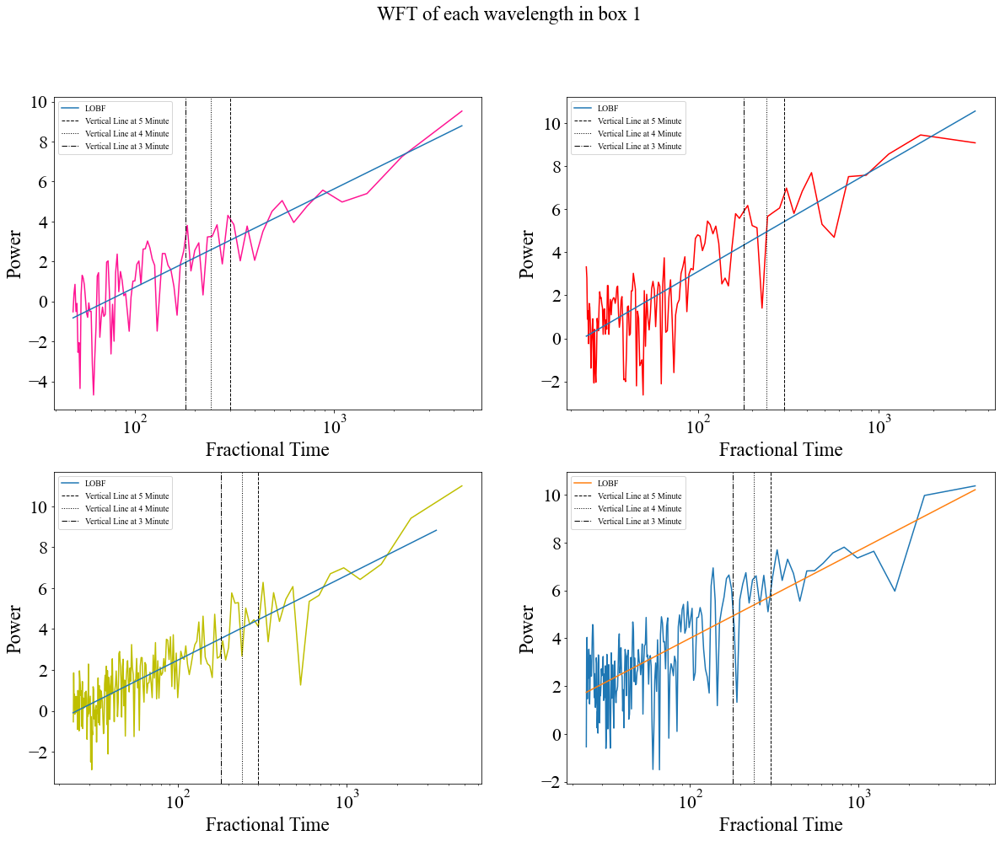

In [135]:
params_1700_box1,params_covarience = curve_fit(PowerFunction,period_1700_box1[1:91],np.log(fft_1700_box1[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box1 = PowerFunction((np.log(period_1700_box1[1:91])),(params_1700_box1[0]),(params_1700_box1[1]))

params_304_box1,params_covarience = curve_fit(PowerFunction,period_304_box1[1:141],np.log(fft_304_box1[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box1 = PowerFunction((np.log(period_304_box1[1:141])),(params_304_box1[0]),(params_304_box1[1]))

params_171_box1,params_covarience = curve_fit(PowerFunction,period_171_box1[1:200],np.log(fft_171_box1[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box1 = PowerFunction((np.log(period_171_box1[1:200])),(params_171_box1[0]),(params_171_box1[1]))

params_94_box1,params_covarience = curve_fit(PowerFunction,period_94_box1[1:205],np.log(fft_94_box1[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box1 = PowerFunction((np.log(period_94_box1[1:205])),(params_94_box1[0]),(params_94_box1[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box1[1]}')
print(f'The gradient for the 304 waveband is {params_304_box1[1]}')
print(f'The gradient for the 171 waveband is {params_171_box1[1]}')
print(f'The gradient for the 94 waveband is {params_94_box1[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 1',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box1[1:91]),np.log(fft_1700_box1[1:91]),color = 'deeppink')
plt.plot((period_1700_box1[1:91]),params_1700_box1[1]*(np.log(period_1700_box1[1:91]))+np.log(params_1700_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.legend()
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot((period_304_box1[1:141]),np.log(fft_304_box1[1:141]),color = 'red')
plt.plot((period_304_box1[1:141]),params_304_box1[1]*(np.log(period_304_box1[1:141]))+np.log(params_304_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.legend()
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot((period_171_box1[1:200]),np.log(fft_171_box1[1:200]),color = 'y')
plt.plot((period_304_box1[1:200]),params_171_box1[1]*(np.log(period_304_box1[1:200]))+np.log(params_171_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.legend()
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot((period_94_box1[1:205]),np.log(fft_94_box1[1:205]))
plt.plot((period_94_box1[1:205]),params_94_box1[1]*(np.log(period_94_box1[1:205]))+np.log(params_94_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend()


plt.show()

# Box 2 (highest box)

In [136]:
BLx = 379.5
BLy = -175
TRx = 382.5 
TRy = -172  
sub_intensity_1700_box2 , period_1700_box2, fft_1700_box2 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box2, period_304_box2, fft_304_box2 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box2 , period_171_box2, fft_171_box2 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box2 , period_94_box2, fft_94_box2 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

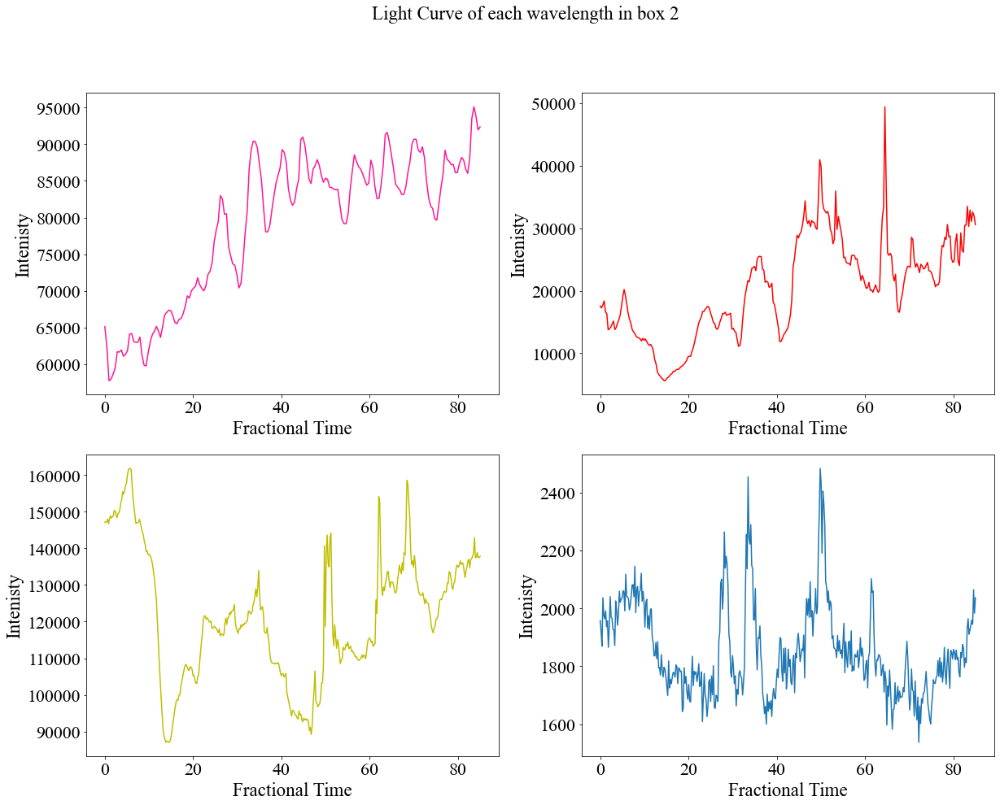

In [137]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 2',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box2,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box2,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box2,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box2)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1552744547.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.384253109848323
The gradient for the 304 waveband is 2.005920527463262
The gradient for the 171 waveband is 1.5412291376994527
The gradient for the 94 waveband is 1.3998088628236027


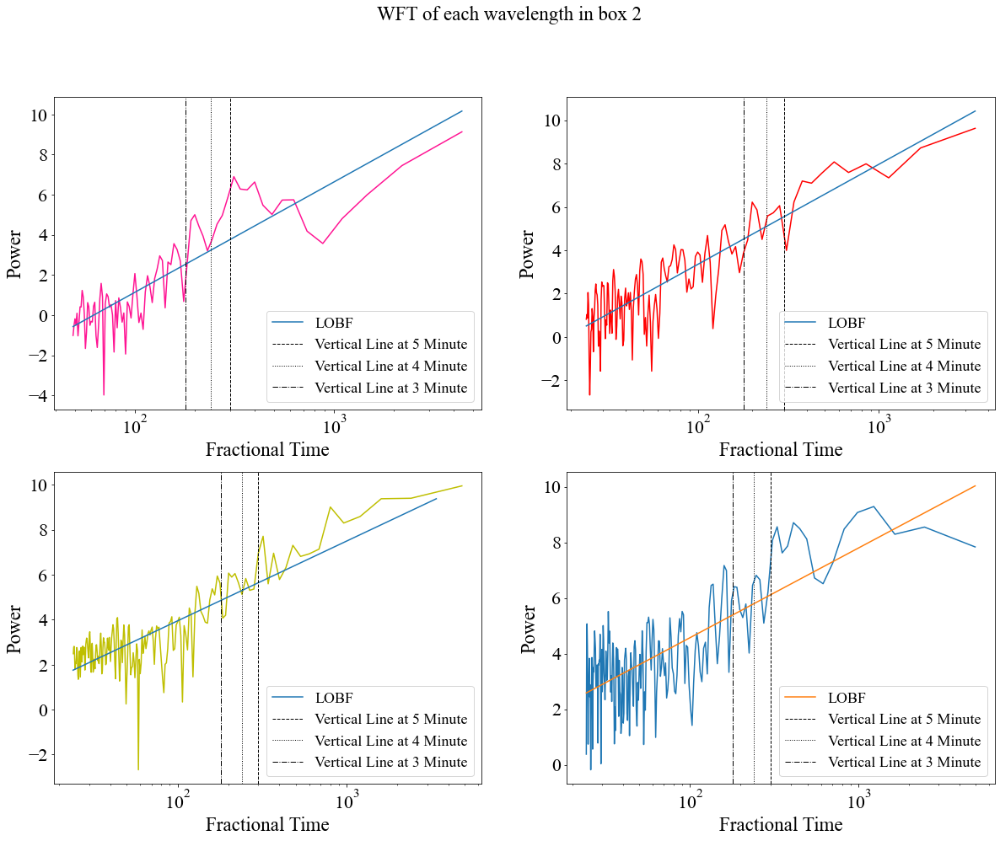

In [138]:
params_1700_box2,params_covarience = curve_fit(PowerFunction,period_1700_box2[1:91],np.log(fft_1700_box2[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box2 = PowerFunction((np.log(period_1700_box2[1:91])),(params_1700_box2[0]),(params_1700_box2[1]))

params_304_box2,params_covarience = curve_fit(PowerFunction,period_304_box2[1:141],np.log(fft_304_box2[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box2 = PowerFunction((np.log(period_304_box2[1:141])),(params_304_box2[0]),(params_304_box2[1]))

params_171_box2,params_covarience = curve_fit(PowerFunction,period_171_box2[1:200],np.log(fft_171_box2[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box2 = PowerFunction((np.log(period_171_box2[1:200])),(params_171_box2[0]),(params_171_box2[1]))

params_94_box2,params_covarience = curve_fit(PowerFunction,period_94_box2[1:205],np.log(fft_94_box2[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box2 = PowerFunction((np.log(period_94_box2[1:205])),(params_94_box2[0]),(params_94_box2[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box2[1]}')
print(f'The gradient for the 304 waveband is {params_304_box2[1]}')
print(f'The gradient for the 171 waveband is {params_171_box2[1]}')
print(f'The gradient for the 94 waveband is {params_94_box2[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 2',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box2[1:91]),np.log(fft_1700_box2[1:91]),color = 'deeppink')
plt.plot((period_1700_box2[1:91]),params_1700_box2[1]*(np.log(period_1700_box2[1:91]))+np.log(params_1700_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box2[1:141]),np.log(fft_304_box2[1:141]),color = 'red')
plt.plot((period_304_box2[1:141]),params_304_box2[1]*(np.log(period_304_box2[1:141]))+np.log(params_304_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box2[1:200]),np.log(fft_171_box2[1:200]),color = 'y')
plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box2[1:205]),np.log(fft_94_box2[1:205]))
plt.plot((period_94_box2[1:205]),params_94_box2[1]*(np.log(period_94_box2[1:205]))+np.log(params_94_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

# Box 3 (right most)

In [139]:
BLx = 382.5
BLy = -174.5
TRx = 385.5 
TRy = -171.5 
sub_intensity_1700_box3 , period_1700_box3, fft_1700_box3 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box3, period_304_box3, fft_304_box3 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box3 , period_171_box3, fft_171_box3 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box3 , period_94_box3, fft_94_box3 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

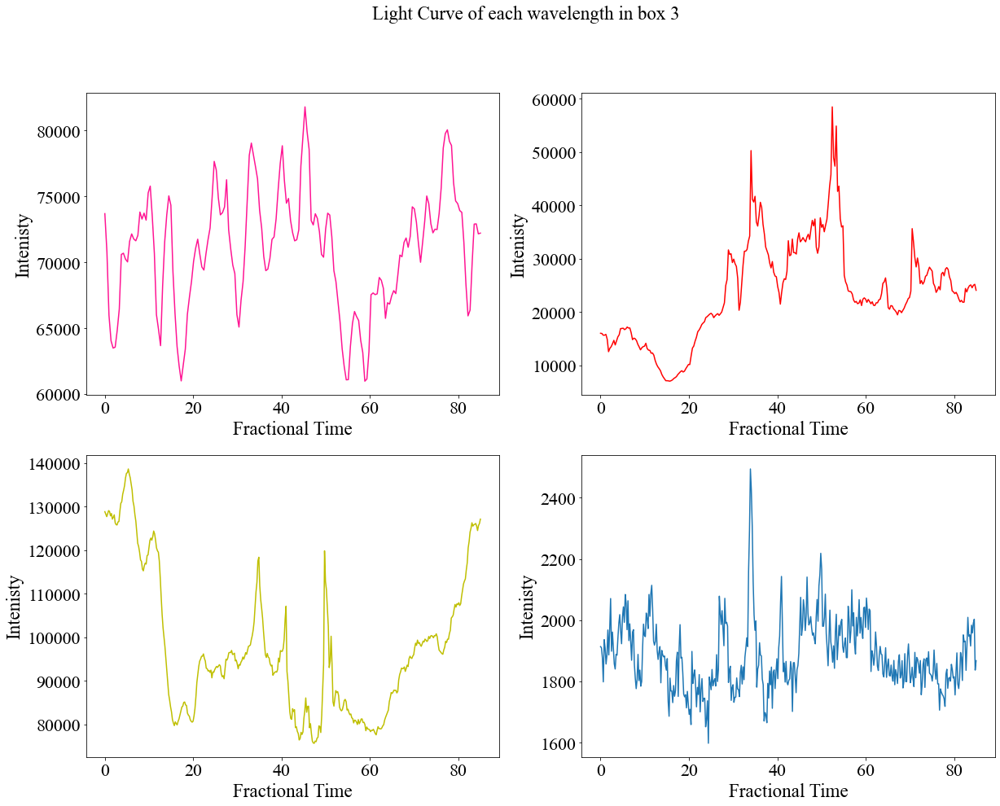

In [140]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 3',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box3,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box3,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box3,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box3)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/2815980188.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.3778355020786943
The gradient for the 304 waveband is 1.606895470821312
The gradient for the 171 waveband is 1.9214297903750062
The gradient for the 94 waveband is 1.3605306333218465


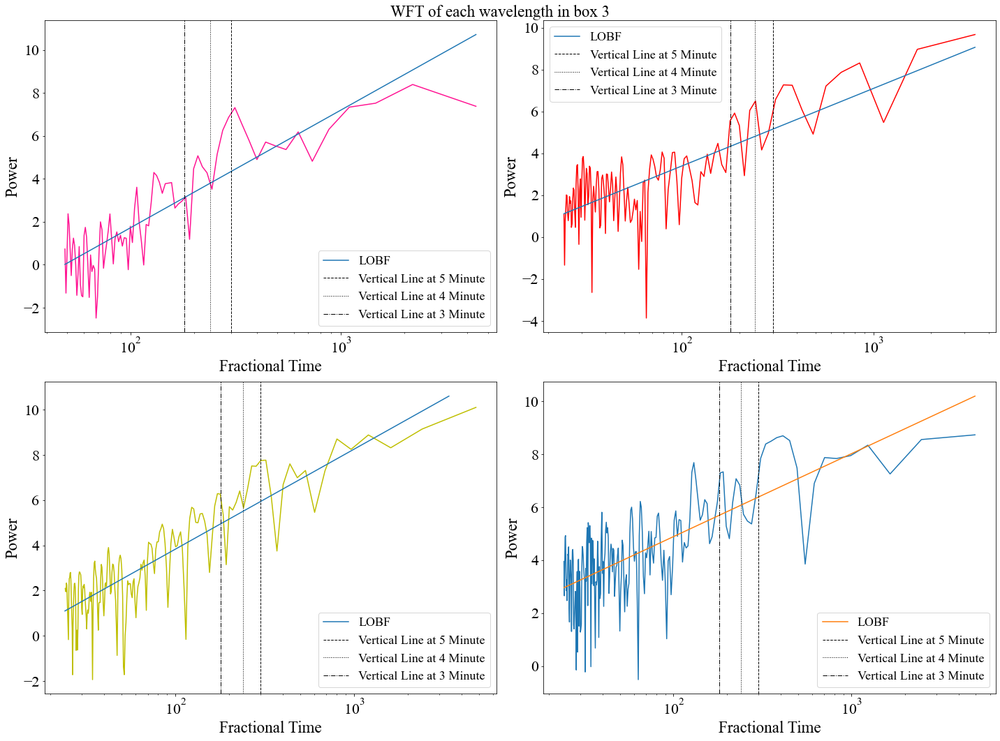

In [141]:
params_1700_box3,params_covarience = curve_fit(PowerFunction,period_1700_box3[1:91],np.log(fft_1700_box3[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box3 = PowerFunction((np.log(period_1700_box3[1:91])),(params_1700_box3[0]),(params_1700_box3[1]))

params_304_box3,params_covarience = curve_fit(PowerFunction,period_304_box3[1:141],np.log(fft_304_box3[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box3 = PowerFunction((np.log(period_304_box3[1:141])),(params_304_box3[0]),(params_304_box3[1]))

params_171_box3,params_covarience = curve_fit(PowerFunction,period_171_box3[1:200],np.log(fft_171_box3[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box3 = PowerFunction((np.log(period_171_box3[1:200])),(params_171_box3[0]),(params_171_box3[1]))

params_94_box3,params_covarience = curve_fit(PowerFunction,period_94_box3[1:205],np.log(fft_94_box3[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box3 = PowerFunction((np.log(period_94_box3[1:205])),(params_94_box3[0]),(params_94_box3[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box3[1]}')
print(f'The gradient for the 304 waveband is {params_304_box3[1]}')
print(f'The gradient for the 171 waveband is {params_171_box3[1]}')
print(f'The gradient for the 94 waveband is {params_94_box3[1]}')

plt.figure(figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 3',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box3[1:91]),np.log(fft_1700_box3[1:91]),color = 'deeppink')
plt.plot((period_1700_box3[1:91]),params_1700_box3[1]*(np.log(period_1700_box3[1:91]))+np.log(params_1700_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box3[1:141]),np.log(fft_304_box3[1:141]),color = 'red')
plt.plot((period_304_box3[1:141]),params_304_box3[1]*(np.log(period_304_box3[1:141]))+np.log(params_304_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box3[1:200]),np.log(fft_171_box3[1:200]),color = 'y')
plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box3[1:205]),np.log(fft_94_box3[1:205]))
plt.plot((period_94_box3[1:205]),params_94_box3[1]*(np.log(period_94_box3[1:205]))+np.log(params_94_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.tight_layout()
plt.show()

# Boxes around front of flare (bottom to top)

# BOx 1 bottom

In [142]:
BLx = 413
BLy = -196.5
TRx = 416  
TRy = -193.5
sub_intensity_1700_box1 , period_1700_box1, fft_1700_box1 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box1, period_304_box1, fft_304_box1 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box1 , period_171_box1, fft_171_box1 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box1 , period_94_box1, fft_94_box1 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

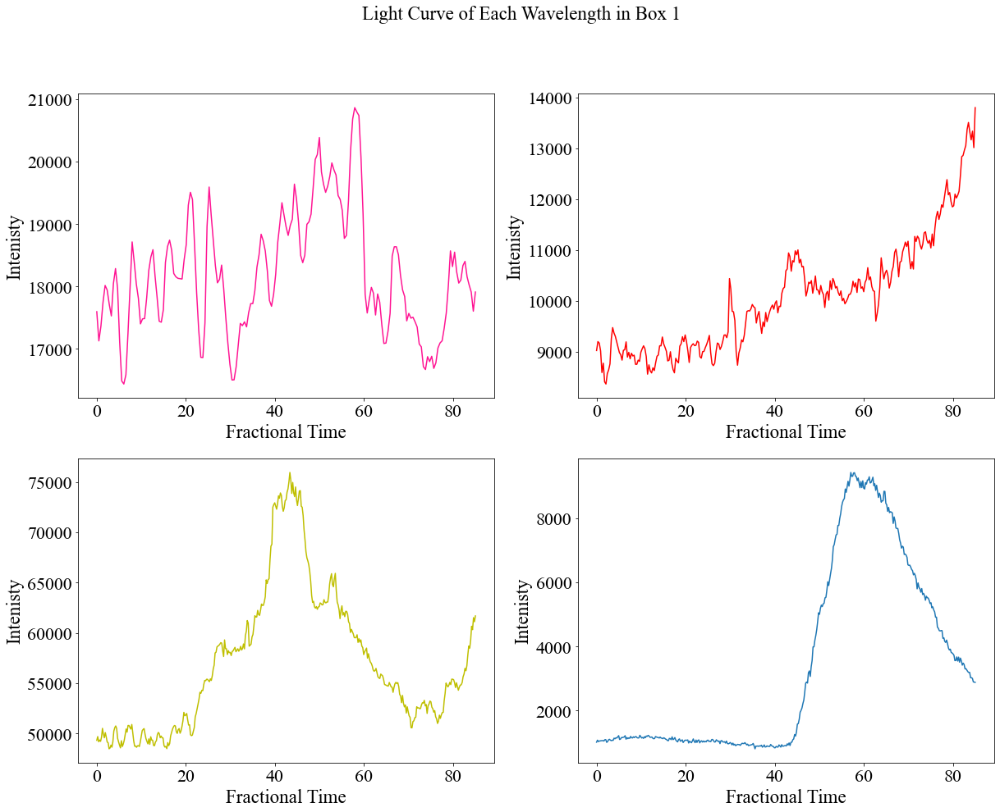

In [143]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of Each Wavelength in Box 1', fontsize=23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box1,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box1,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box1,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box1)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

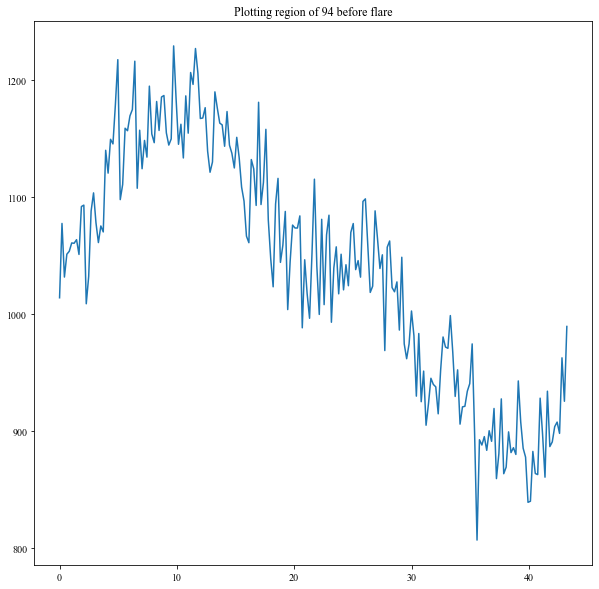

In [144]:
plt.figure(figsize = (10,10))
plt.plot(time_94[0:210],sub_intensity_94_box1[0:210])
plt.title('Plotting region of 94 before flare')
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/2275033679.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.4572946537938907
The gradient for the 304 waveband is 1.6331765008499401
The gradient for the 171 waveband is 2.1776175064264573
The gradient for the 94 waveband is 1.892376265293255


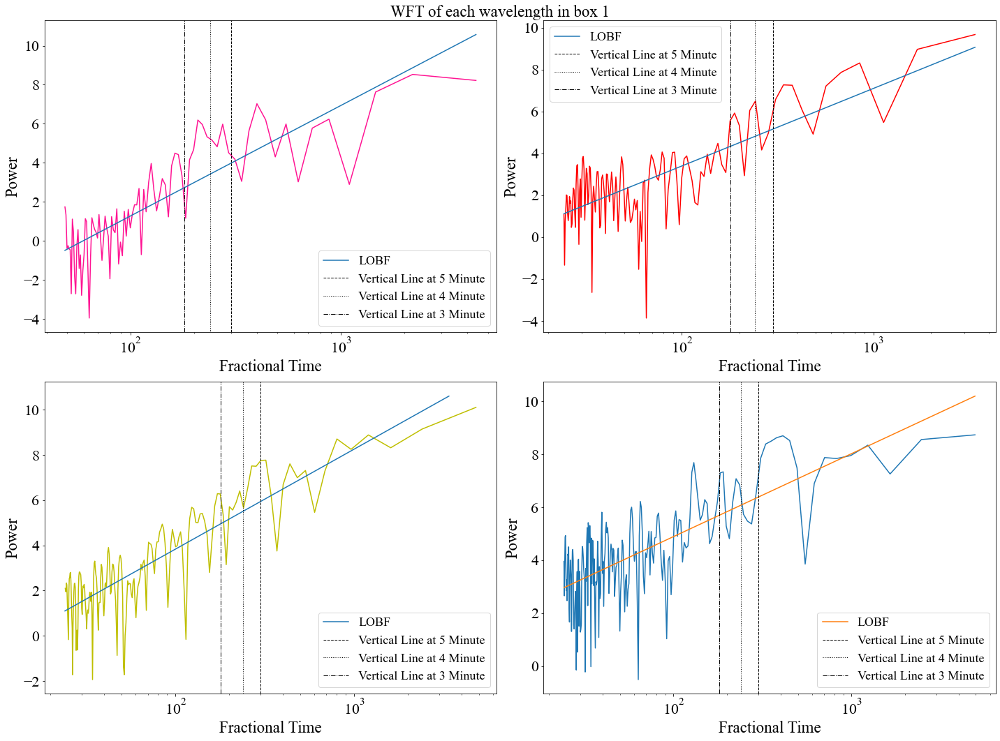

In [145]:
params_1700_box1,params_covarience = curve_fit(PowerFunction,period_1700_box1[1:91],np.log(fft_1700_box1[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box1 = PowerFunction((np.log(period_1700_box1[1:91])),(params_1700_box1[0]),(params_1700_box1[1]))

params_304_box1,params_covarience = curve_fit(PowerFunction,period_304_box1[1:141],np.log(fft_304_box1[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box1 = PowerFunction((np.log(period_304_box1[1:141])),(params_304_box1[0]),(params_304_box1[1]))

params_171_box1,params_covarience = curve_fit(PowerFunction,period_171_box1[1:200],np.log(fft_171_box1[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box1 = PowerFunction((np.log(period_171_box1[1:200])),(params_171_box1[0]),(params_171_box1[1]))

params_94_box1,params_covarience = curve_fit(PowerFunction,period_94_box1[1:205],np.log(fft_94_box1[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box1 = PowerFunction((np.log(period_94_box1[1:205])),(params_94_box1[0]),(params_94_box1[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box1[1]}')
print(f'The gradient for the 304 waveband is {params_304_box1[1]}')
print(f'The gradient for the 171 waveband is {params_171_box1[1]}')
print(f'The gradient for the 94 waveband is {params_94_box1[1]}')

plt.figure(figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 1',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box1[1:91]),np.log(fft_1700_box1[1:91]),color = 'deeppink')
plt.plot((period_1700_box1[1:91]),params_1700_box1[1]*(np.log(period_1700_box1[1:91]))+np.log(params_1700_box1[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box3[1:141]),np.log(fft_304_box3[1:141]),color = 'red')
plt.plot((period_304_box3[1:141]),params_304_box3[1]*(np.log(period_304_box3[1:141]))+np.log(params_304_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box3[1:200]),np.log(fft_171_box3[1:200]),color = 'y')
plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box3[1:205]),np.log(fft_94_box3[1:205]))
plt.plot((period_94_box3[1:205]),params_94_box3[1]*(np.log(period_94_box3[1:205]))+np.log(params_94_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.tight_layout()
plt.show()

# Box 2 Top right

In [146]:
BLx = 414.5
BLy = -192.5
TRx = 417.5
TRy = -189.5  
sub_intensity_1700_box2 , period_1700_box2, fft_1700_box2 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box2, period_304_box2, fft_304_box2 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box2 , period_171_box2, fft_171_box2 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box2 , period_94_box2, fft_94_box2 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

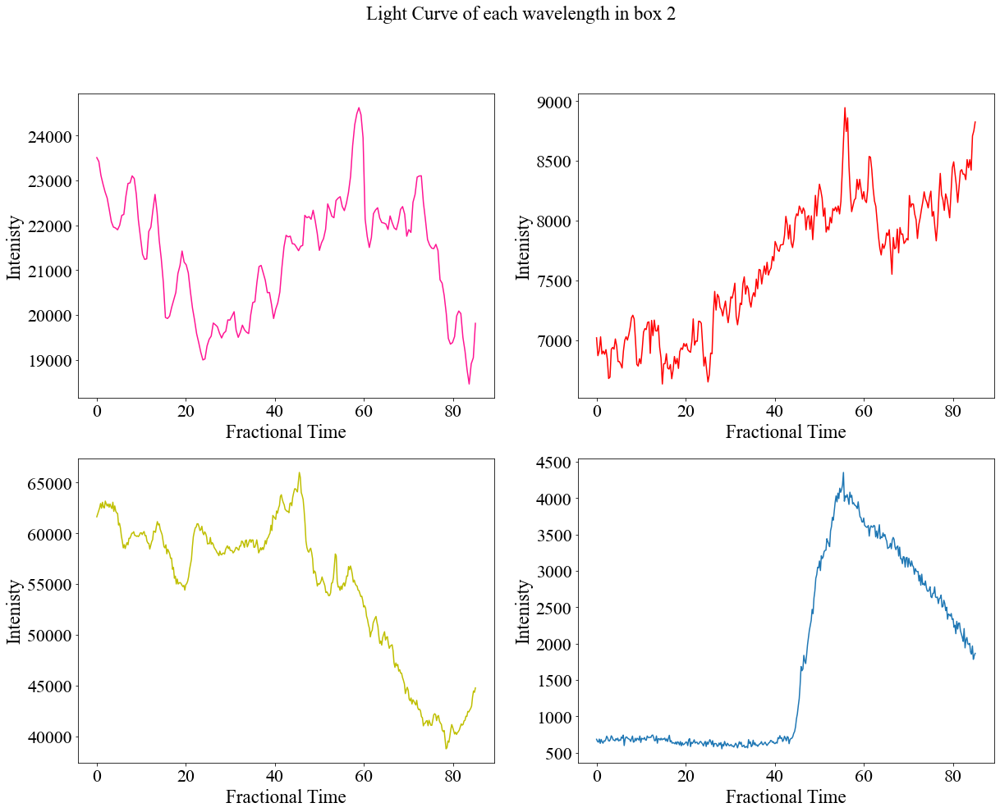

In [147]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 2',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box2,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box2,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box2,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box2)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1552744547.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.319029739511874
The gradient for the 304 waveband is 1.5211053832842423
The gradient for the 171 waveband is 2.300264972547181
The gradient for the 94 waveband is 1.8327110587491775


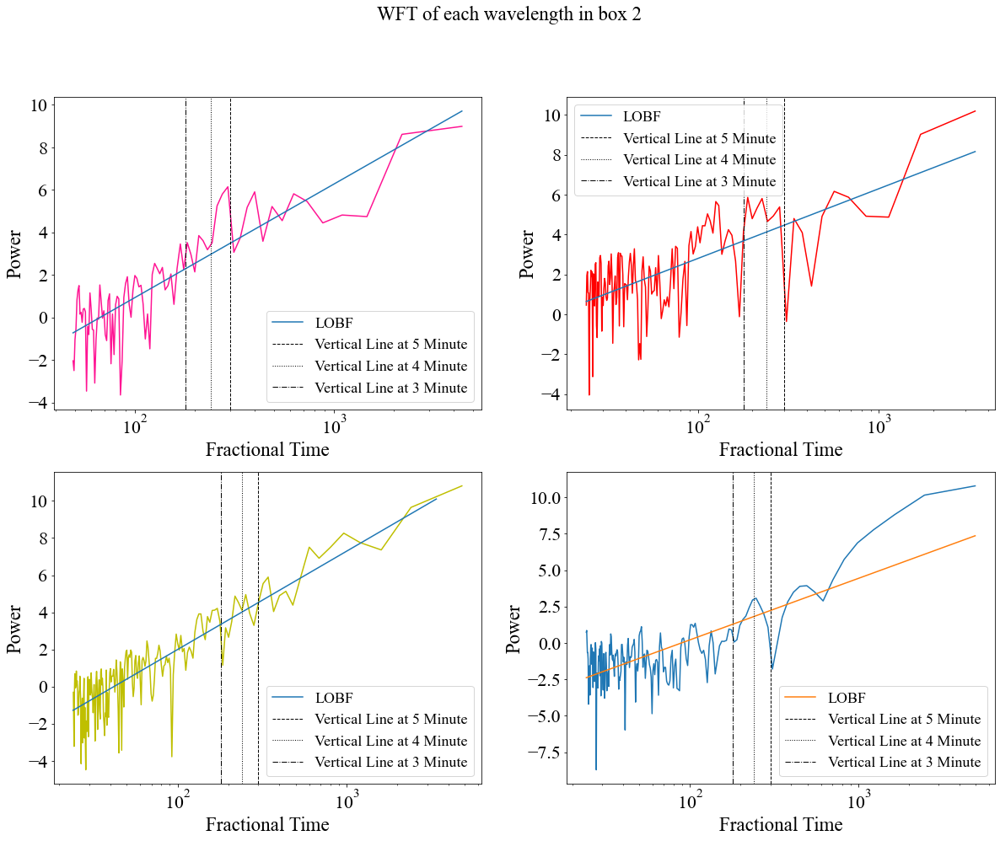

In [148]:
params_1700_box2,params_covarience = curve_fit(PowerFunction,period_1700_box2[1:91],np.log(fft_1700_box2[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box2 = PowerFunction((np.log(period_1700_box2[1:91])),(params_1700_box2[0]),(params_1700_box2[1]))

params_304_box2,params_covarience = curve_fit(PowerFunction,period_304_box2[1:141],np.log(fft_304_box2[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box2 = PowerFunction((np.log(period_304_box2[1:141])),(params_304_box2[0]),(params_304_box2[1]))

params_171_box2,params_covarience = curve_fit(PowerFunction,period_171_box2[1:200],np.log(fft_171_box2[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box2 = PowerFunction((np.log(period_171_box2[1:200])),(params_171_box2[0]),(params_171_box2[1]))

params_94_box2,params_covarience = curve_fit(PowerFunction,period_94_box2[1:205],np.log(fft_94_box2[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box2 = PowerFunction((np.log(period_94_box2[1:205])),(params_94_box2[0]),(params_94_box2[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box2[1]}')
print(f'The gradient for the 304 waveband is {params_304_box2[1]}')
print(f'The gradient for the 171 waveband is {params_171_box2[1]}')
print(f'The gradient for the 94 waveband is {params_94_box2[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 2',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box2[1:91]),np.log(fft_1700_box2[1:91]),color = 'deeppink')
plt.plot((period_1700_box2[1:91]),params_1700_box2[1]*(np.log(period_1700_box2[1:91]))+np.log(params_1700_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_box2[1:141]),np.log(fft_304_box2[1:141]),color = 'red')
plt.plot((period_304_box2[1:141]),params_304_box2[1]*(np.log(period_304_box2[1:141]))+np.log(params_304_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box2[1:200]),np.log(fft_171_box2[1:200]),color = 'y')
plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_box2[1:205]),np.log(fft_94_box2[1:205]))
plt.plot((period_94_box2[1:205]),params_94_box2[1]*(np.log(period_94_box2[1:205]))+np.log(params_94_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

# Box 3 (top left)

In [149]:
BLx = 405 
BLy = -192.5
TRx = 408
TRy = -189.5  
sub_intensity_1700_box3 , period_1700_box3, fft_1700_box3 = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_box3, period_304_box3, fft_304_box3 = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_box3 , period_171_box3, fft_171_box3 = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_box3 , period_94_box3, fft_94_box3 = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

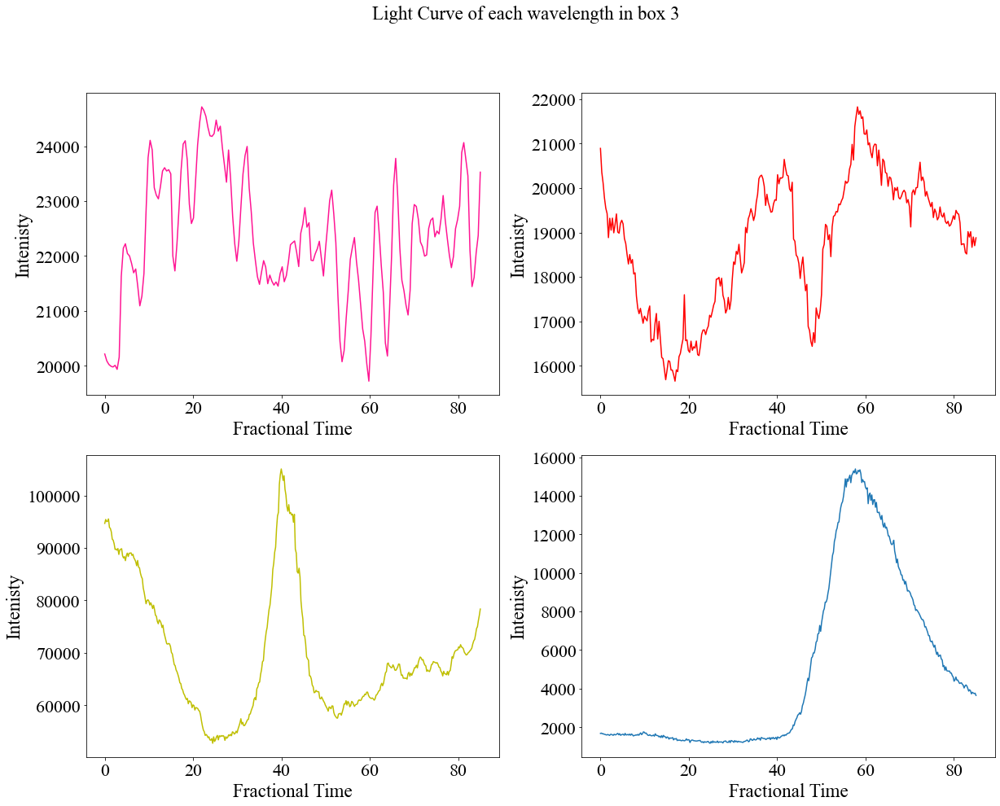

In [150]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 3',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_box3,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_box3,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_box3,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_box3)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/4260405173.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.175934995146351 ± 0.00021175843221266986
The gradient for the 304 waveband is 1.817010432409961 ± 0.0021446592392525064
The gradient for the 171 waveband is 2.073705448240359 ± 0.00010324701908897002
The gradient for the 94 waveband is 1.8488407046343696 ± 4.488662875707351e-05


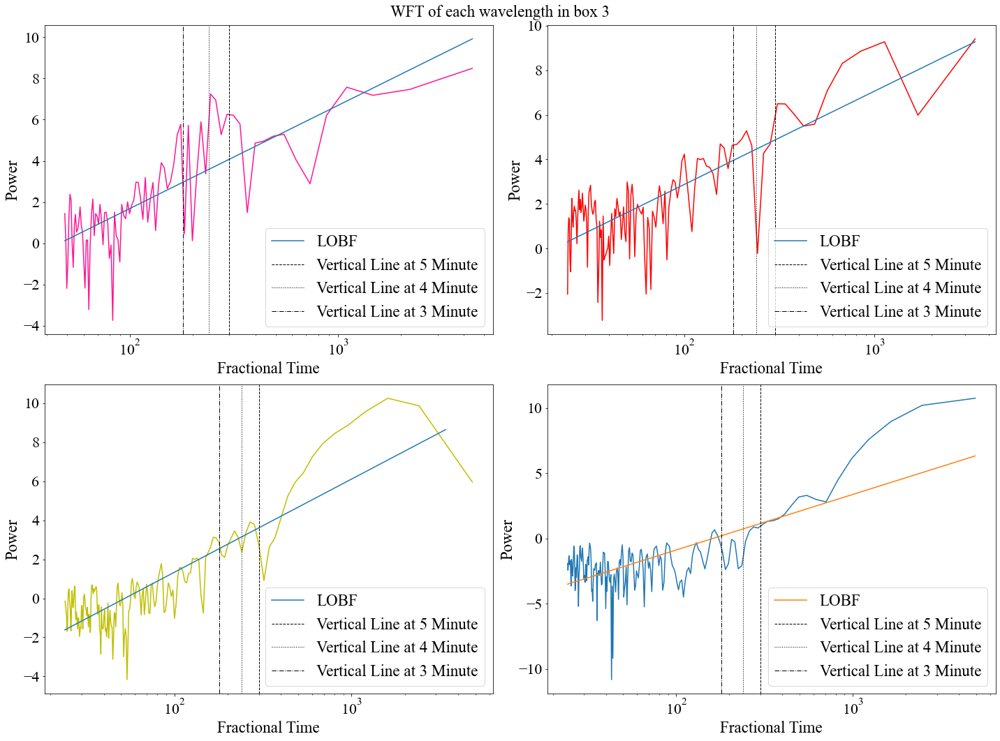

In [151]:
params_1700_box3,params_cov_1700 = curve_fit(PowerFunction,period_1700_box3[1:91],np.log(fft_1700_box3[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_box3 = PowerFunction((np.log(period_1700_box3[1:91])),(params_1700_box3[0]),(params_1700_box3[1]))

params_304_box3,params_cov_304 = curve_fit(PowerFunction,period_304_box3[1:141],np.log(fft_304_box3[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_box3 = PowerFunction((np.log(period_304_box3[1:141])),(params_304_box3[0]),(params_304_box3[1]))

params_171_box3,params_cov_171 = curve_fit(PowerFunction,period_171_box3[1:200],np.log(fft_171_box3[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_box3 = PowerFunction((np.log(period_171_box3[1:200])),(params_171_box3[0]),(params_171_box3[1]))

params_94_box3,params_cov_94 = curve_fit(PowerFunction,period_94_box3[1:205],np.log(fft_94_box3[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box3 = PowerFunction((np.log(period_94_box3[1:205])),(params_94_box3[0]),(params_94_box3[1]))

print(f'The gradient for the 1700 waveband is {params_1700_box3[1]} ± {np.sqrt(params_cov_1700[0][0])}')
print(f'The gradient for the 304 waveband is {params_304_box3[1]} ± {np.sqrt(params_cov_304[0][0])}')
print(f'The gradient for the 171 waveband is {params_171_box3[1]} ± {np.sqrt(params_cov_171[0][0])}')
print(f'The gradient for the 94 waveband is {params_94_box3[1]} ± {np.sqrt(params_cov_94[0][0])}')

plt.figure(figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 3',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_box3[1:91]),np.log(fft_1700_box3[1:91]),color = 'deeppink')
plt.plot((period_1700_box3[1:91]),params_1700_box3[1]*(np.log(period_1700_box3[1:91]))+np.log(params_1700_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 23)

plt.subplot(222)
plt.plot((period_304_box3[1:141]),np.log(fft_304_box3[1:141]),color = 'red')
plt.plot((period_304_box3[1:141]),params_304_box3[1]*(np.log(period_304_box3[1:141]))+np.log(params_304_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 23)

plt.subplot(223)
plt.plot((period_171_box3[1:200]),np.log(fft_171_box3[1:200]),color = 'y')
plt.plot((period_304_box3[1:200]),params_171_box3[1]*(np.log(period_304_box3[1:200]))+np.log(params_171_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 23)

plt.subplot(224)
plt.plot((period_94_box3[1:205]),np.log(fft_94_box3[1:205]))
plt.plot((period_94_box3[1:205]),params_94_box3[1]*(np.log(period_94_box3[1:205]))+np.log(params_94_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 23)

plt.tight_layout()

plt.show()

# Boxes at the back over flare (bottom to top)

# Box 1 (bottom)

In [178]:
BLx = 374.5
BLy = -216
TRx = 377.5  
TRy = -213
sub_intensity_1700_boxC , period_1700_boxC, fft_1700_boxC = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_boxC, period_304_boxC, fft_304_boxC = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_boxC , period_171_boxC, fft_171_boxC = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_boxC , period_94_boxC, fft_94_boxC = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

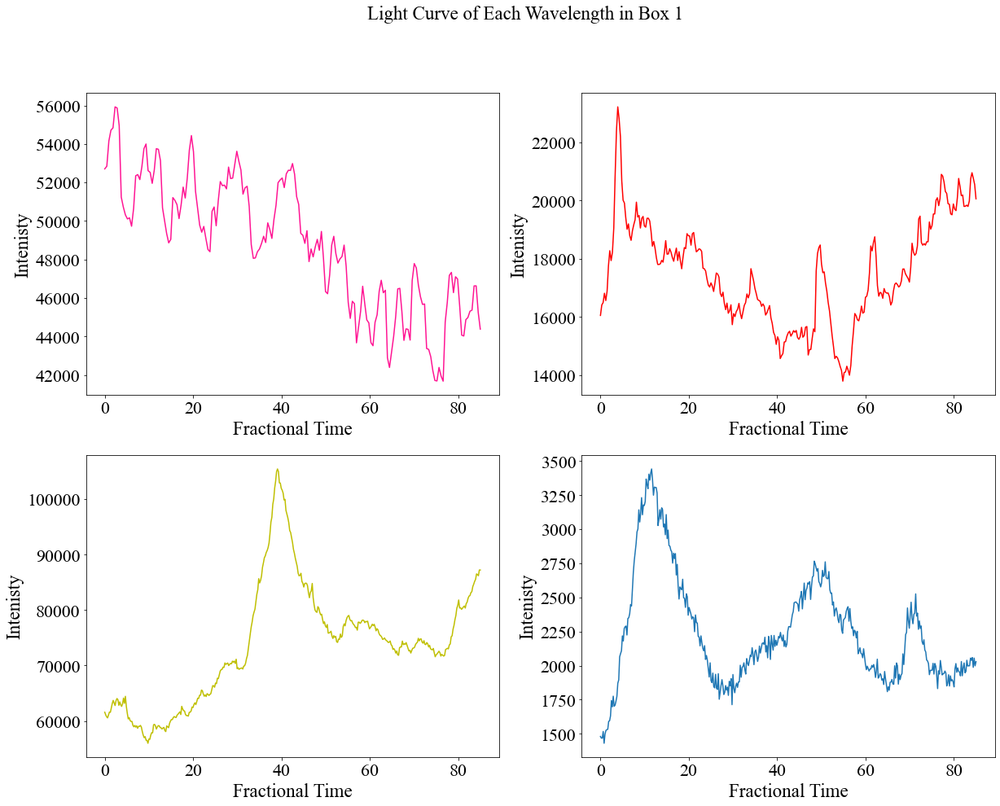

In [179]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of Each Wavelength in Box 1', fontsize=23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_boxC,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_boxC,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_boxC,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_boxC)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1978379551.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_boxC[1:200]),params_171_boxC[1]*(np.log(period_304_boxC[1:200]))+np.log(params_171_boxC[0]),label = 'LOBF')


The gradient for the 1700 waveband is 1.8717054912603874
The gradient for the 304 waveband is 2.0166126900332833
The gradient for the 171 waveband is 2.3975357728355324
The gradient for the 94 waveband is 1.0825717362454534


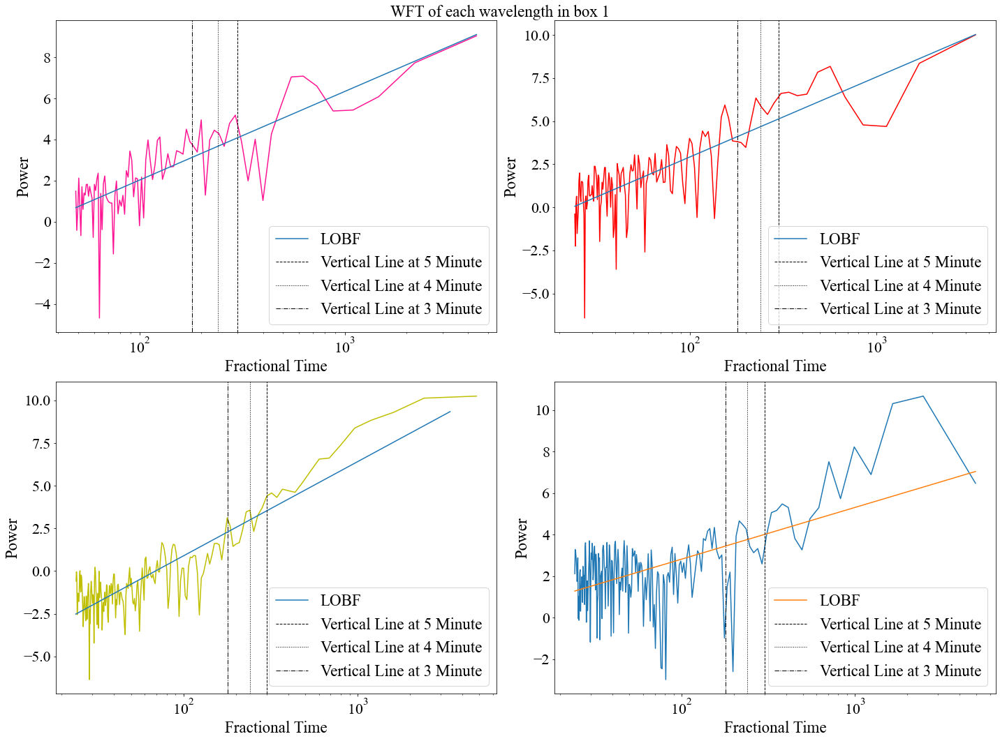

In [180]:
params_1700_boxC,params_covarience = curve_fit(PowerFunction,period_1700_boxC[1:91],np.log(fft_1700_boxC[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_boxC = PowerFunction((np.log(period_1700_boxC[1:91])),(params_1700_boxC[0]),(params_1700_boxC[1]))

params_304_boxC,params_covarience = curve_fit(PowerFunction,period_304_boxC[1:141],np.log(fft_304_boxC[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_boxC = PowerFunction((np.log(period_304_boxC[1:141])),(params_304_boxC[0]),(params_304_boxC[1]))

params_171_boxC,params_covarience = curve_fit(PowerFunction,period_171_boxC[1:200],np.log(fft_171_boxC[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_boxC = PowerFunction((np.log(period_171_boxC[1:200])),(params_171_boxC[0]),(params_171_boxC[1]))

params_94_boxC,params_covarience = curve_fit(PowerFunction,period_94_boxC[1:205],np.log(fft_94_boxC[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_boxC = PowerFunction((np.log(period_94_boxC[1:205])),(params_94_boxC[0]),(params_94_boxC[1]))

print(f'The gradient for the 1700 waveband is {params_1700_boxC[1]}')
print(f'The gradient for the 304 waveband is {params_304_boxC[1]}')
print(f'The gradient for the 171 waveband is {params_171_boxC[1]}')
print(f'The gradient for the 94 waveband is {params_94_boxC[1]}')

plt.figure(figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 1',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_boxC[1:91]),np.log(fft_1700_boxC[1:91]),color = 'deeppink')
plt.plot((period_1700_boxC[1:91]),params_1700_boxC[1]*(np.log(period_1700_boxC[1:91]))+np.log(params_1700_boxC[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 23)

plt.subplot(222)
plt.plot((period_304_boxC[1:141]),np.log(fft_304_boxC[1:141]),color = 'red')
plt.plot((period_304_boxC[1:141]),params_304_boxC[1]*(np.log(period_304_boxC[1:141]))+np.log(params_304_boxC[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 23)

plt.subplot(223)
plt.plot((period_171_boxC[1:200]),np.log(fft_171_boxC[1:200]),color = 'y')
plt.plot((period_304_boxC[1:200]),params_171_boxC[1]*(np.log(period_304_boxC[1:200]))+np.log(params_171_boxC[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 23)

plt.subplot(224)
plt.plot((period_94_boxC[1:205]),np.log(fft_94_boxC[1:205]))
plt.plot((period_94_boxC[1:205]),params_94_boxC[1]*(np.log(period_94_boxC[1:205]))+np.log(params_94_boxC[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 23)

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.tight_layout()
plt.show()


# Box 2 (middle)

In [181]:
BLx = 368.5
BLy = -211
TRx = 371.5  
TRy = -208

BLx = 368
BLy = -211.5
TRx = 371
TRy = -208.5  
sub_intensity_1700_boxB , period_1700_boxB, fft_1700_boxB = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_boxB, period_304_boxB, fft_304_boxB = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_boxB , period_171_boxB, fft_171_boxB = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_boxB , period_94_boxB, fft_94_boxB = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

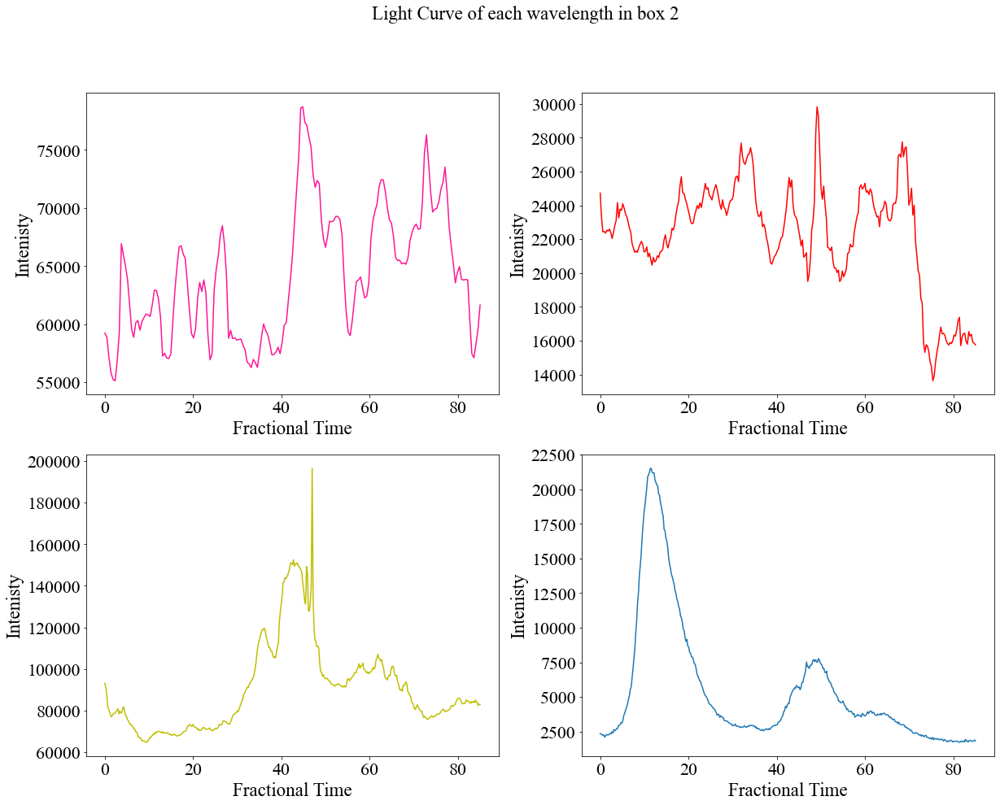

In [ ]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 2',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_boxB,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)


plt.subplot(222)
plt.plot(time_304,sub_intensity_304_boxB,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_boxB,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_boxB)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1783943941.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.72131685260318
The gradient for the 304 waveband is 2.20953052496704
The gradient for the 171 waveband is 1.3178350181675054
The gradient for the 94 waveband is 2.06871236166123


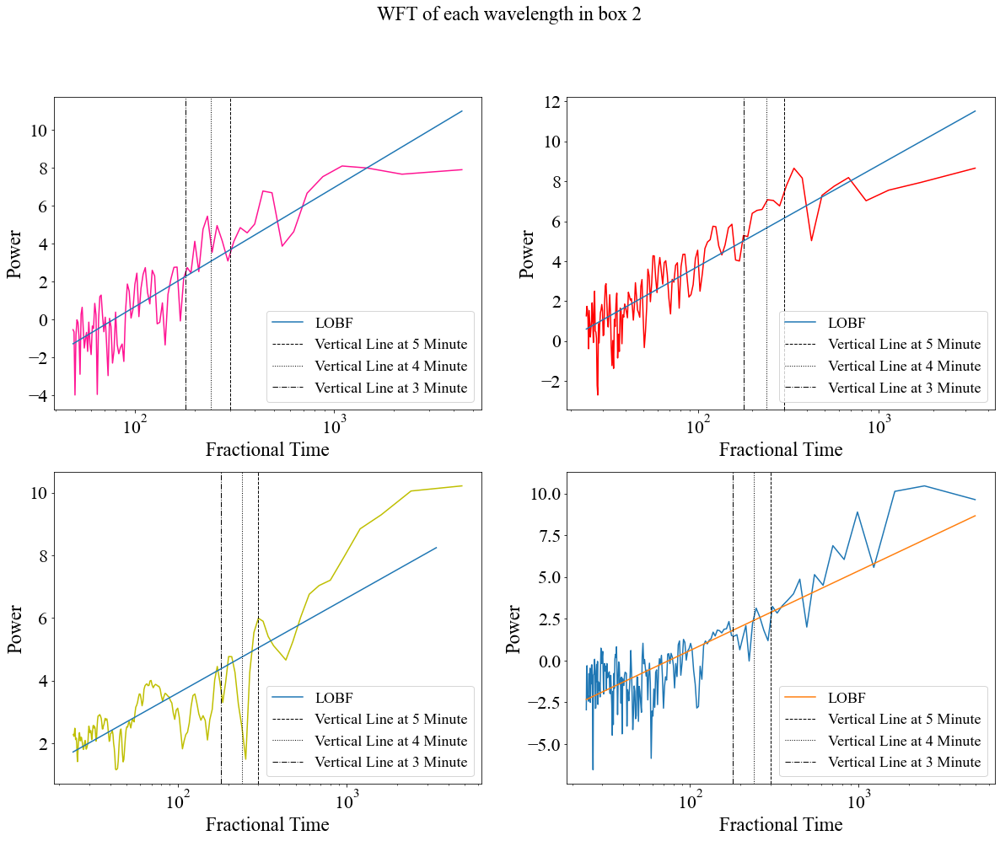

In [182]:
params_1700_boxB,params_covarience = curve_fit(PowerFunction,period_1700_boxB[1:91],np.log(fft_1700_boxB[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_boxB = PowerFunction((np.log(period_1700_boxB[1:91])),(params_1700_boxB[0]),(params_1700_boxB[1]))

params_304_boxB,params_covarience = curve_fit(PowerFunction,period_304_boxB[1:141],np.log(fft_304_boxB[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_boxB = PowerFunction((np.log(period_304_boxB[1:141])),(params_304_boxB[0]),(params_304_boxB[1]))

params_171_boxB,params_covarience = curve_fit(PowerFunction,period_171_boxB[1:200],np.log(fft_171_boxB[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_boxB = PowerFunction((np.log(period_171_boxB[1:200])),(params_171_boxB[0]),(params_171_boxB[1]))

params_94_boxB,params_covarience = curve_fit(PowerFunction,period_94_boxB[1:205],np.log(fft_94_boxB[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_boxB = PowerFunction((np.log(period_94_boxB[1:205])),(params_94_boxB[0]),(params_94_boxB[1]))

print(f'The gradient for the 1700 waveband is {params_1700_boxB[1]}')
print(f'The gradient for the 304 waveband is {params_304_boxB[1]}')
print(f'The gradient for the 171 waveband is {params_171_boxB[1]}')
print(f'The gradient for the 94 waveband is {params_94_boxB[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 2',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_boxB[1:91]),np.log(fft_1700_boxB[1:91]),color = 'deeppink')
plt.plot((period_1700_boxB[1:91]),params_1700_boxB[1]*(np.log(period_1700_boxB[1:91]))+np.log(params_1700_boxB[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_boxB[1:141]),np.log(fft_304_boxB[1:141]),color = 'red')
plt.plot((period_304_boxB[1:141]),params_304_boxB[1]*(np.log(period_304_boxB[1:141]))+np.log(params_304_boxB[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_box2[1:200]),np.log(fft_171_box2[1:200]),color = 'y')
plt.plot((period_304_box2[1:200]),params_171_box2[1]*(np.log(period_304_box2[1:200]))+np.log(params_171_box2[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_boxB[1:205]),np.log(fft_94_boxB[1:205]))
plt.plot((period_94_boxB[1:205]),params_94_boxB[1]*(np.log(period_94_boxB[1:205]))+np.log(params_94_boxB[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

# Box 3 (top left)

In [184]:
BLx = 361
BLy = -207
TRx = 364
TRy = -204 
sub_intensity_1700_boxA , period_1700_boxA, fft_1700_boxA = lightcurve_WFT(submaps_1700,BLx,BLy,TRx,TRy,cadence = 24)
sub_intensity_304_boxA, period_304_boxA, fft_304_boxA = lightcurve_WFT(submaps_304,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_171_boxA , period_171_boxA, fft_171_boxA = lightcurve_WFT(submaps_171,BLx,BLy,TRx,TRy,cadence = 12)
sub_intensity_94_boxA , period_94_boxA, fft_94_boxA = lightcurve_WFT(submaps_94,BLx,BLy,TRx,TRy,cadence = 12)

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1180325450.py:13: RuntimeWarning: divide by zero encountered in divide
  period = 1/freqs


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

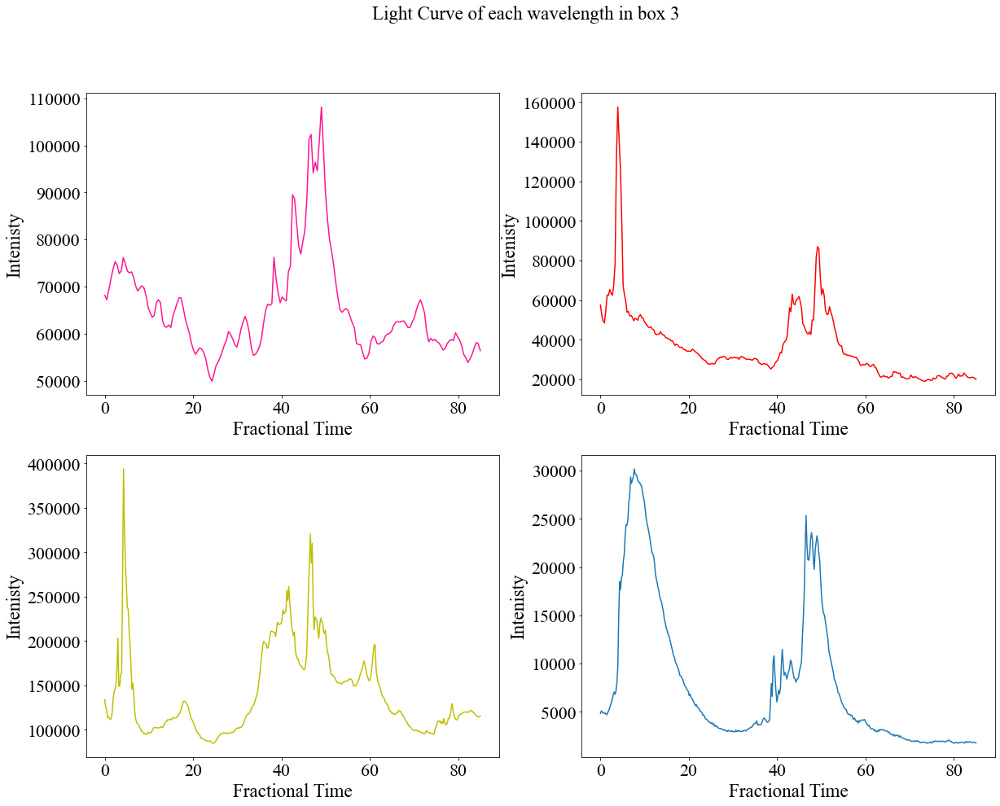

In [185]:
plt.figure(1,figsize = (20,15))
plt.suptitle('Light Curve of each wavelength in box 3',fontsize = 23)
plt.subplot(221)
plt.plot(time_1700,sub_intensity_1700_boxA,color = 'deeppink')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(222)
plt.plot(time_304,sub_intensity_304_boxA,color = 'red')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(223)
plt.plot(time_171,sub_intensity_171_boxA,color = 'y')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(224)
plt.plot(time_94,sub_intensity_94_boxA)
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/1131192262.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)
/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/4025775243.py:50: RuntimeWarning: invalid value encountered in log
  plt.plot((period_304_boxA[1:200]),params_171_boxA[1]*(np.log(period_304_boxA[1:200]))+np.log(params_171_boxA[0]),label = 'LOBF')


The gradient for the 1700 waveband is 2.2045625902645747
The gradient for the 304 waveband is 2.2741120142010507
The gradient for the 171 waveband is 2.0830058673170346
The gradient for the 94 waveband is 2.433583446546826


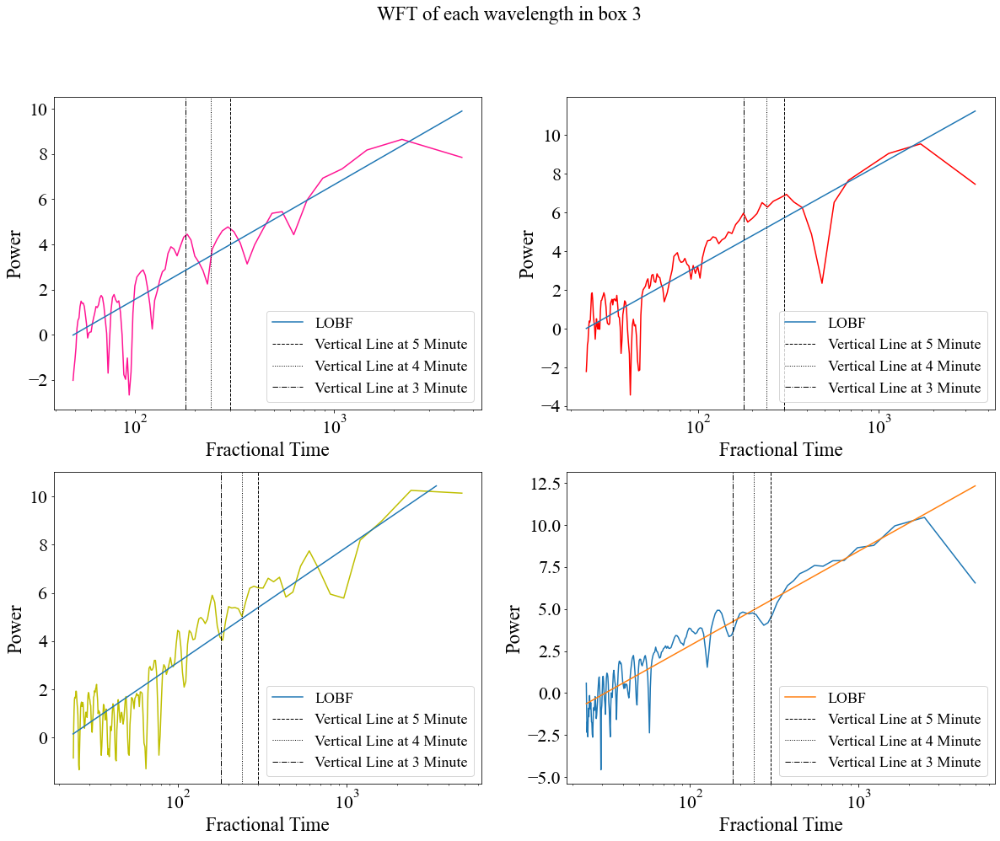

In [186]:
params_1700_boxA,params_covarience = curve_fit(PowerFunction,period_1700_boxA[1:91],np.log(fft_1700_boxA[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_1700_boxA = PowerFunction((np.log(period_1700_boxA[1:91])),(params_1700_boxA[0]),(params_1700_boxA[1]))

params_304_boxA,params_covarience = curve_fit(PowerFunction,period_304_boxA[1:141],np.log(fft_304_boxA[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_304_boxA = PowerFunction((np.log(period_304_boxA[1:141])),(params_304_boxA[0]),(params_304_boxA[1]))

params_171_boxA,params_covarience = curve_fit(PowerFunction,period_171_boxA[1:200],np.log(fft_171_boxA[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_171_boxA = PowerFunction((np.log(period_171_boxA[1:200])),(params_171_boxA[0]),(params_171_boxA[1]))

params_94_boxA,params_covarience = curve_fit(PowerFunction,period_94_boxA[1:205],np.log(fft_94_boxA[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_boxA = PowerFunction((np.log(period_94_boxA[1:205])),(params_94_boxA[0]),(params_94_boxA[1]))

print(f'The gradient for the 1700 waveband is {params_1700_boxA[1]}')
print(f'The gradient for the 304 waveband is {params_304_boxA[1]}')
print(f'The gradient for the 171 waveband is {params_171_boxA[1]}')
print(f'The gradient for the 94 waveband is {params_94_boxA[1]}')

plt.figure(1,figsize = (20,15))


plt.suptitle('WFT of each wavelength in box 3',fontsize = 23)
plt.subplot(221)
plt.plot((period_1700_boxA[1:91]),np.log(fft_1700_boxA[1:91]),color = 'deeppink')
plt.plot((period_1700_boxA[1:91]),params_1700_boxA[1]*(np.log(period_1700_boxA[1:91]))+np.log(params_1700_boxA[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(222)
plt.plot((period_304_boxA[1:141]),np.log(fft_304_boxA[1:141]),color = 'red')
plt.plot((period_304_boxA[1:141]),params_304_boxA[1]*(np.log(period_304_boxA[1:141]))+np.log(params_304_boxA[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(223)
plt.plot((period_171_boxA[1:200]),np.log(fft_171_boxA[1:200]),color = 'y')
plt.plot((period_304_boxA[1:200]),params_171_boxA[1]*(np.log(period_304_boxA[1:200]))+np.log(params_171_boxA[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.subplot(224)
plt.plot((period_94_boxA[1:205]),np.log(fft_94_boxA[1:205]))
plt.plot((period_94_boxA[1:205]),params_94_boxA[1]*(np.log(period_94_boxA[1:205]))+np.log(params_94_boxA[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='Vertical Line at 5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='Vertical Line at 4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='Vertical Line at 3 Minute')
plt.xlabel('Fractional Time',fontsize = 23)
plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)
plt.legend(fontsize = 18)

plt.show()

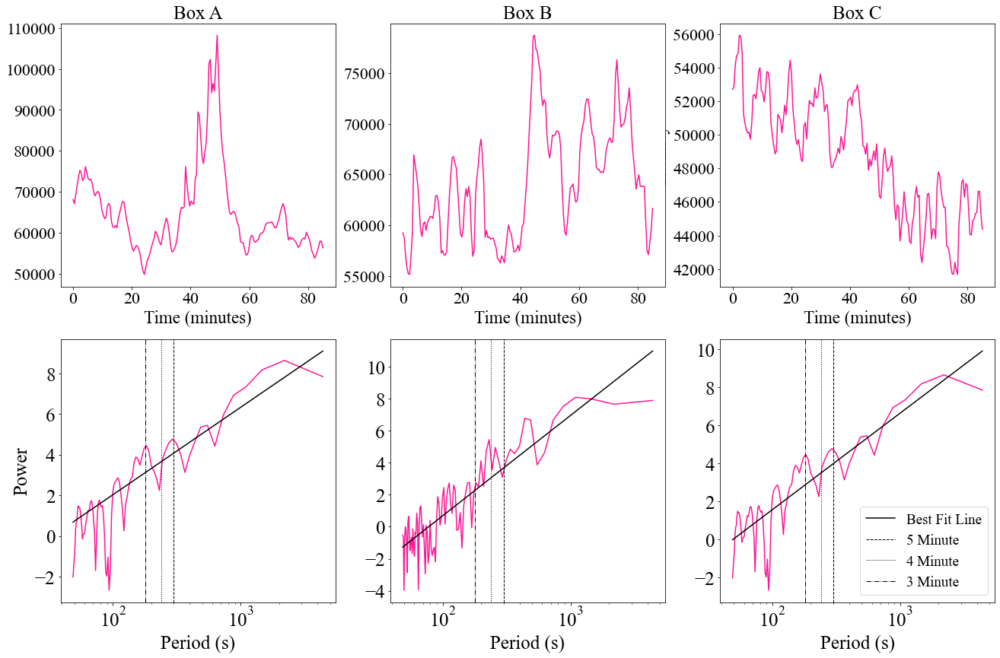

In [202]:
# plt.figure(1,figsize = (20,6)) # good for 1 x 3

plt.figure(figsize = (22,14))
# plt.suptitle('1700 Å Fourier Spectrum',fontsize = 23)



plt.subplot(236)
# plt.title('Box C',fontsize = 25)
plt.plot((period_1700_boxA[1:91]),np.log(fft_1700_boxA[1:91]),color = 'deeppink')
plt.plot((period_1700_boxA[1:91]),params_1700_boxA[1]*(np.log(period_1700_boxA[1:91]))+np.log(params_1700_boxA[0]),label = 'Best Fit Line',color = 'black')
# plt.plot((period_1700_box3[1:91]),np.log(fft_1700_box3[1:91]),color = 'deeppink')
# plt.plot((period_1700_box3[1:91]),params_1700_box3[1]*(np.log(period_1700_box3[1:91]))+np.log(params_1700_box3[0]),label = 'LOBF')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='3 Minute')
plt.xlabel('Period (s)',fontsize = 25)
# plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=25) 
plt.xticks(fontsize=25)
plt.legend(fontsize = 19,loc = 'lower right')

plt.subplot(235)
# plt.title('Box B',fontsize = 25)
plt.plot((period_1700_boxB[1:91]),np.log(fft_1700_boxB[1:91]),color = 'deeppink')
plt.plot((period_1700_boxB[1:91]),params_1700_boxB[1]*(np.log(period_1700_boxB[1:91]))+np.log(params_1700_boxB[0]),label = 'LOBF',color = 'black')
plt.xscale('log')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='3 Minute')
plt.xlabel('Period (s)',fontsize =25)
# plt.ylabel('Power',fontsize = 23)
plt.yticks(fontsize=25) 
plt.xticks(fontsize=25)

plt.subplot(234)
# plt.title('Box A',fontsize = 25)
plt.plot((period_1700_boxC[1:91]),np.log(fft_1700_boxA[1:91]),color = 'deeppink')
plt.plot((period_1700_boxC[1:91]),params_1700_boxC[1]*(np.log(period_1700_boxC[1:91]))+np.log(params_1700_boxC[0]),label = 'Best Fit Line',color = 'black')
plt.axvline(x=300, color='black', linestyle='--', linewidth=1, label='5 Minute')
plt.axvline(x=240, color='black', linestyle=':', linewidth=1, label='4 Minute')
plt.axvline(x=180, color='black', linestyle='-.', linewidth=1, label='3 Minute')
plt.xlabel('Period (s)',fontsize = 25)
plt.ylabel('Power',fontsize = 25)
plt.yticks(fontsize=25) 
plt.xticks(fontsize=25)
plt.xscale('log')
# plt.legend(fontsize = 23)
# plt.savefig("1700_Fourier_Spectrums_3.pdf", format="pdf", bbox_inches="tight")  # Use bbox_inches to trim whitespace

plt.subplot(233)
plt.title('Box C',fontsize = 25)

plt.plot(time_1700,sub_intensity_1700_boxC,color = 'deeppink')
plt.xlabel('Time (minutes)',fontsize = 23)
plt.ylabel('Intenisty',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(232)
plt.title('Box B',fontsize = 25)

plt.plot(time_1700,sub_intensity_1700_boxB,color = 'deeppink')
plt.xlabel('Time (minutes)',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)

plt.subplot(231)
plt.title('Box A',fontsize = 25)

plt.plot(time_1700,sub_intensity_1700_boxA,color = 'deeppink')
plt.xlabel('Time (minutes)',fontsize = 23)
plt.yticks(fontsize=22) 
plt.xticks(fontsize=22)



plt.savefig("1700_Fourier_Intensity.pdf", format="pdf", bbox_inches="tight")  # Use bbox_inches to trim whitespace


plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/684507199.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


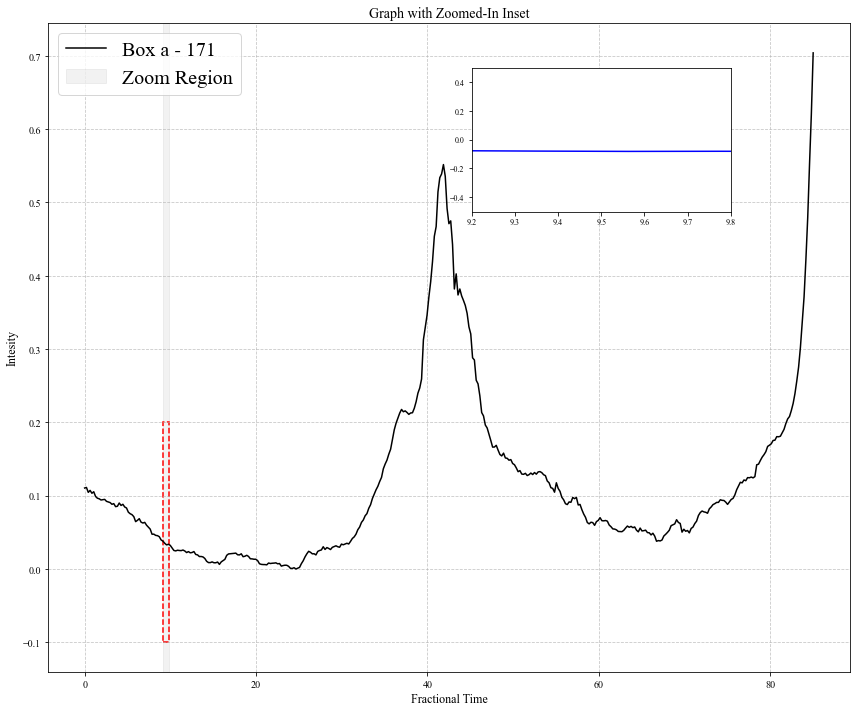

In [162]:
fig, ax = plt.subplots(figsize=(12, 10))

# Plot the main data
ax.plot(time_171, (sub_intensity_171_box4-np.min(sub_intensity_171_box4))/np.max(sub_intensity_171_box4), label='Box a - 171', color='black')

# Highlight the zoomed region
zoom_start, zoom_end = 9.2, 9.8
ax.axvspan(zoom_start, zoom_end, color='gray', alpha=0.1, label='Zoom Region')

# Create the inset (zoomed-in section) and adjust its position
inset_ax = fig.add_axes([0.55, 0.7, 0.3, 0.2])  # [x, y, width, height] in figure coordinates
inset_ax.plot(time_171, (sub_intensity_171_box4-np.mean(sub_intensity_171_box4))/np.max(sub_intensity_171_box4), color='blue')
inset_ax.set_xlim(zoom_start, zoom_end)
inset_ax.set_ylim(-0.5, 0.5)
inset_ax.tick_params(axis='both', which='major', labelsize=8)

# Add a rectangle in the main plot to indicate the zoomed-in area
rect = plt.Rectangle((zoom_start, -0.1), zoom_end - zoom_start, 0.3, 
                     edgecolor='red', facecolor='none', lw=1.5, linestyle='--')
ax.add_patch(rect)

# Label axes and add legend
ax.set_xlabel('Fractional Time', fontsize=12)
ax.set_ylabel('Intesity', fontsize=12)
ax.legend(fontsize=20,loc = 'upper left')
ax.set_title('Graph with Zoomed-In Inset', fontsize=14)

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Save or show the plot
plt.tight_layout()
plt.show()

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_10303/3259002152.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


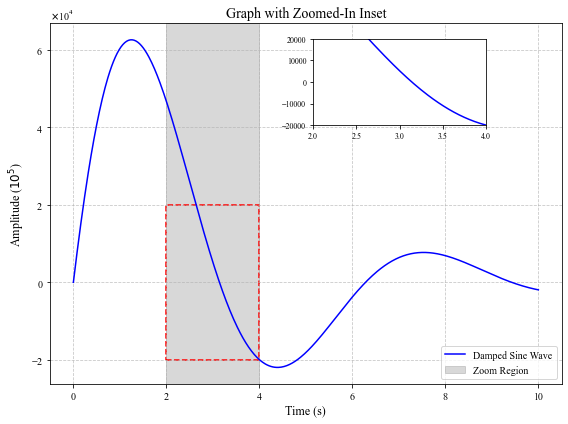

In [163]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import ScalarFormatter

# Generate some data for the example
x = np.linspace(0, 10, 500)
y = 1e5 * (np.sin(x) * np.exp(-x / 3))  # Scale the y values to hundreds of thousands

# Create the main figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the main data
ax.plot(x, y, label='Damped Sine Wave', color='blue')

# Highlight the zoomed region
zoom_start, zoom_end = 2, 4
ax.axvspan(zoom_start, zoom_end, color='gray', alpha=0.3, label='Zoom Region')

# Create the inset (zoomed-in section) and adjust its position
inset_ax = fig.add_axes([0.55, 0.7, 0.3, 0.2])  # [x, y, width, height] in figure coordinates
inset_ax.plot(x, y, color='blue')
inset_ax.set_xlim(zoom_start, zoom_end)
inset_ax.set_ylim(-2e4, 2e4)  # Adjust y-limits for zoomed region
inset_ax.tick_params(axis='both', which='major', labelsize=8)

# Add a rectangle in the main plot to indicate the zoomed-in area
rect = plt.Rectangle((zoom_start, -2e4), zoom_end - zoom_start, 4e4, 
                     edgecolor='red', facecolor='none', lw=1.5, linestyle='--')
ax.add_patch(rect)

# Label axes and move the legend to the bottom-right corner
ax.set_xlabel('Time (s)', fontsize=12)
ax.set_ylabel('Amplitude ($10^5$)', fontsize=12)  # Add a scaling unit to the y-label
ax.legend(loc='lower right', fontsize=10)
ax.set_title('Graph with Zoomed-In Inset', fontsize=14)

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Format y-axis in scientific notation for the main plot
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))

# Save or show the plot
plt.tight_layout()
plt.show()

In [67]:
def power_law_lorenz(x,A,n,a,b,d,c):

    y = A*x**(-n)+(a)/(1+((np.log(x)-b)**2)/d)+c
    return y

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_3913/2639547908.py:9: RuntimeWarning: invalid value encountered in log
  plt.plot((period_94_box3[1:91]),params_94_box3[0]*np.log(period_94_box3[1:91])**(-params_94_box3[1])+(params_94_box3[2])/(1+((np.log(np.log(period_94_box3[1:91])-params_94_box3[3])**2)/params_94_box3[4]))+params_94_box3[5],label = 'LOBF')


[-38.31885532   0.32466947  -1.44907425   5.49266281   0.2139881
  12.31593188]


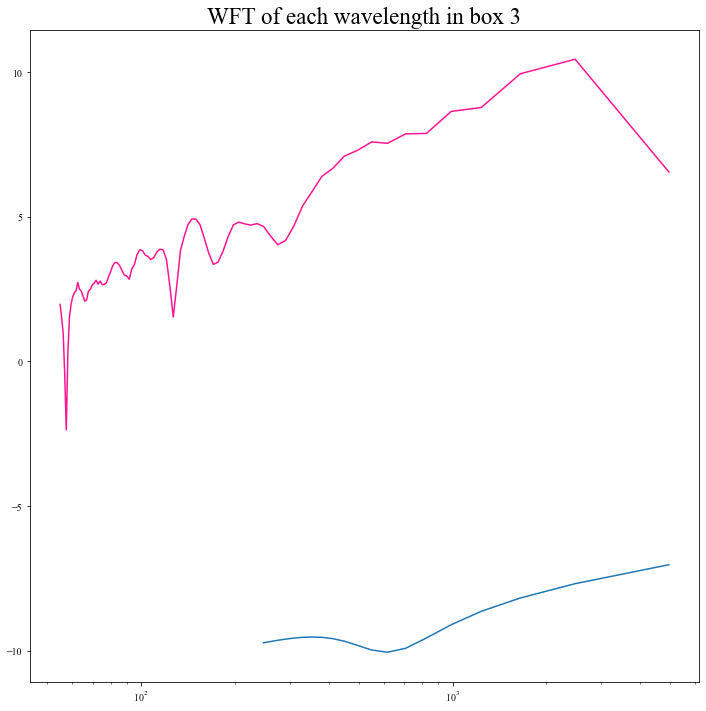

In [68]:
#trying to add a lorenzian onto function 

params_94_box3,params_covarience = curve_fit(power_law_lorenz,period_94_box3[1:205],np.log(fft_94_box3[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)
y_LOBF_94_box3 = power_law_lorenz((np.log(period_94_box3[1:205])),(params_94_box3[0]),(params_94_box3[1]),params_94_box3[2],params_94_box3[3],params_94_box3[4],params_94_box3[5])

plt.figure(figsize = (12,12))
plt.title('WFT of each wavelength in box 3',fontsize = 23)
plt.plot((period_94_box3[1:91]),np.log(fft_94_box3[1:91]),color = 'deeppink')
plt.plot((period_94_box3[1:91]),params_94_box3[0]*np.log(period_94_box3[1:91])**(-params_94_box3[1])+(params_94_box3[2])/(1+((np.log(np.log(period_94_box3[1:91])-params_94_box3[3])**2)/params_94_box3[4]))+params_94_box3[5],label = 'LOBF')
plt.xscale('log')
print(params_94_box3)

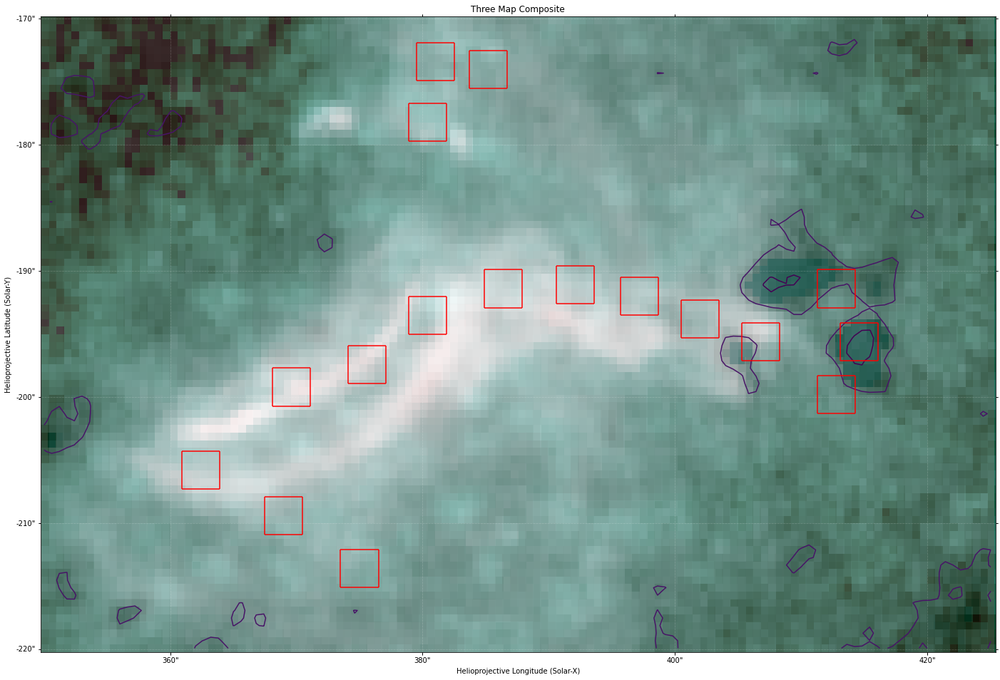

In [197]:
levels = [5,10,100]*u.percent

fig = plt.figure(figsize = (24,24))
ax = fig.add_subplot(projection=flare_94[0])
flare_94[0].plot(axes=ax, clip_interval=(1, 99.9)*u.percent, zorder=0)
flare_1700[0].plot(axes=ax, clip_interval=(1, 99.97)*u.percent, alpha=0.3,
              autoalign=True, zorder=1)
flare_1700[0].draw_contours(axes=ax, levels=levels, zorder=2)
ax.set_title("Three Map Composite")
# plt.colorbar()

# box 1 
plt.hlines(37,30,35, color = 'red' )
plt.hlines(32,30,35, color = 'red' )
plt.vlines(30,32,37,color = 'red')
plt.vlines(35,32,37,color = 'red')


# box 2 done
plt.hlines(40,40,45, color = 'red' )
plt.hlines(35,40,45, color = 'red' )
plt.vlines(40,35,40,color = 'red')
plt.vlines(45,35,40,color = 'red')

# box 3
plt.hlines(41.5,48,53, color = 'red' )
plt.hlines(46.5,48,53, color = 'red' )
plt.vlines(48,46.5,41.5,color = 'red')
plt.vlines(53,46.5,41.5,color = 'red')

# box 4 done
plt.hlines(45,58,63, color = 'red' )
plt.hlines(50,58,63, color = 'red' )
plt.vlines(58,45,50,color = 'red')
plt.vlines(63,45,50,color = 'red')

# box 5
plt.hlines(45.5,67.5,72.5, color = 'red' )
plt.hlines(50.5,67.5,72.5, color = 'red' )
plt.vlines(67.5,45.5,50.5,color = 'red')
plt.vlines(72.5,45.5,50.5,color = 'red')

# box 6 done
plt.hlines(49,76,81, color = 'red' )
plt.hlines(44,76,81, color = 'red' )
plt.vlines(76,44,49,color = 'red')
plt.vlines(81,44,49,color = 'red')


# box 7
plt.hlines(46,84,89, color = 'red' )
plt.hlines(41,84,89, color = 'red' )
plt.vlines(84,41,46,color = 'red')
plt.vlines(89,41,46,color = 'red')

# box 8 done
plt.hlines(43,92,97, color = 'red' )
plt.hlines(38,92,97, color = 'red' )
plt.vlines(92,38,43,color = 'red')
plt.vlines(97,38,43,color = 'red')

#--------------------------------------------------------------------------------------------
# boxes around magnetic loops in the middle  (left to right)



plt.hlines(67,48,53, color = 'red' )
plt.hlines(72,48,53, color = 'red' )
plt.vlines(48,67,72,color = 'red')
plt.vlines(53,67,72,color = 'red')


plt.hlines(75,49,54, color = 'red' )
plt.hlines(80,49,54, color = 'red' )
plt.vlines(49,75,80,color = 'red')
plt.vlines(54,75,80,color = 'red')

plt.hlines(74,56,61, color = 'red' )
plt.hlines(79,56,61, color = 'red' )
plt.vlines(56,74,79,color = 'red')
plt.vlines(61,74,79,color = 'red')


#------------------------------------------------------------------------------------------------
# boxes around magnetic loops at the front (bottom to top)

plt.hlines(36,102,107, color = 'red' )
plt.hlines(31,102,107, color = 'red' )
plt.vlines(102,31,36,color = 'red')
plt.vlines(107,31,36,color = 'red')

plt.hlines(43,105,110, color = 'red' )
plt.hlines(38,105,110, color = 'red' )
plt.vlines(105,38,43,color = 'red')
plt.vlines(110,38,43,color = 'red')

plt.hlines(50,102,107, color = 'red' )
plt.hlines(45,102,107, color = 'red' )
plt.vlines(102,45,50,color = 'red')
plt.vlines(107,45,50,color = 'red')

#------------------------------------------------------------------------------------------------
# boxes at back of flare  (right to left)

plt.hlines(13,39,44, color = 'red' )
plt.hlines(8,39,44, color = 'red' )
plt.vlines(39,8,13,color = 'red')
plt.vlines(44,8,13,color = 'red')


plt.hlines(20,29,34, color = 'red' )
plt.hlines(15,29,34, color = 'red' )
plt.vlines(29,15,20,color = 'red')
plt.vlines(34,15,20,color = 'red')


plt.hlines(26,18,23, color = 'red' )
plt.hlines(21,18,23, color = 'red' )
plt.vlines(18,21,26,color = 'red')
plt.vlines(23,21,26,color = 'red')

plt.show()

# Attempting to fit a best fit line to the wft

In [41]:
period_1700_box1[np.isinf(period_1700_box1)] = 0
# print(period_1700_box1)

print((period_1700_box1[1:91]))

[4392.         2196.         1464.         1098.          878.4
  732.          627.42857143  549.          488.          439.2
  399.27272727  366.          337.84615385  313.71428571  292.8
  274.5         258.35294118  244.          231.15789474  219.6
  209.14285714  199.63636364  190.95652174  183.          175.68
  168.92307692  162.66666667  156.85714286  151.44827586  146.4
  141.67741935  137.25        133.09090909  129.17647059  125.48571429
  122.          118.7027027   115.57894737  112.61538462  109.8
  107.12195122  104.57142857  102.13953488   99.81818182   97.6
   95.47826087   93.44680851   91.5          89.63265306   87.84
   86.11764706   84.46153846   82.86792453   81.33333333   79.85454545
   78.42857143   77.05263158   75.72413793   74.44067797   73.2
   72.           70.83870968   69.71428571   68.625        67.56923077
   66.54545455   65.55223881   64.58823529   63.65217391   62.74285714
   61.85915493   61.           60.16438356   59.35135135   58.56
   57.789

0.004117219428737997 1.6934095197565469


/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_5131/2930574637.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)


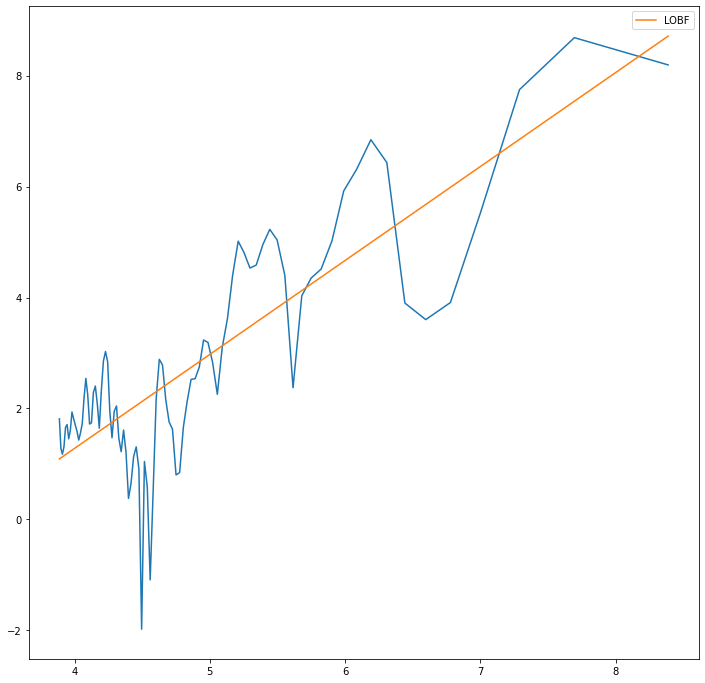

In [78]:
def PowerFunction(x,A,a):
    return np.log(A)+np.log(x)*(a)

params,params_covarience = curve_fit(PowerFunction,period_1700_box1[1:91],np.log(fft_1700_box1[1:91]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)

print(params[0],params[1])
y_LOBF = PowerFunction((np.log(period_1700_box1[1:91])),(params[0]),(params[1]))
plt.figure(figsize = (12,12))
plt.plot(np.log(period_1700_box1[1:91]),np.log(fft_1700_box1[1:91]))
plt.plot(np.log(period_1700_box1[1:91]),1.6934095197565469*(np.log(period_1700_box1[1:91]))+np.log(0.004117219428737997),label = 'LOBF')
# plt.xscale('log')
# plt.yscale('log')
plt.legend()
plt.show()

24.085106382978726
0.006360575464874707 1.817413868499986


/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_5131/2214504372.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)


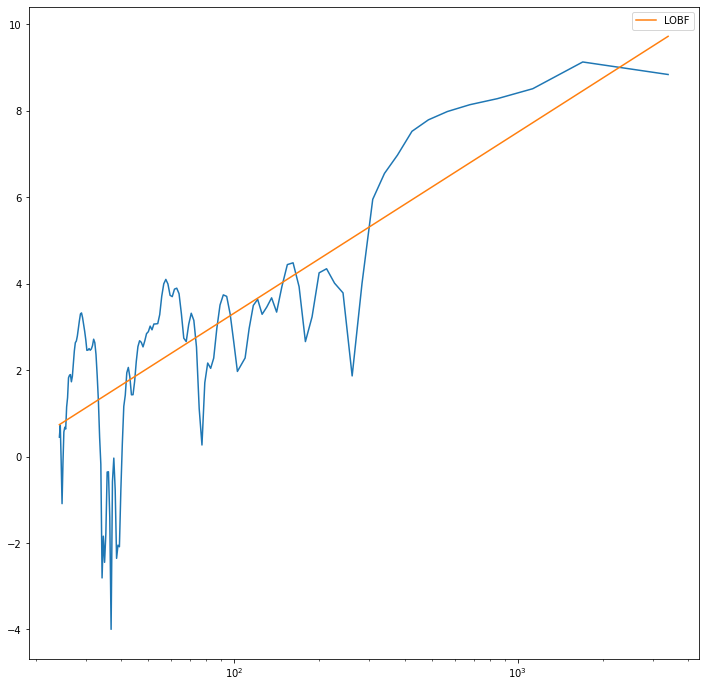

In [159]:
print(period_304_box1[141])

params,params_covarience = curve_fit(PowerFunction,period_304_box1[1:141],np.log(fft_304_box1[1:141]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)

print(params[0],params[1])
y_LOBF = PowerFunction((np.log(period_304_box1[1:141])),(params[0]),(params[1]))
plt.figure(figsize = (12,12))
plt.plot((period_304_box1[1:141]),np.log(fft_304_box1[1:141]))
plt.plot((period_304_box1[1:141]),params[1]*(np.log(period_304_box1[1:141]))+np.log(params[0]),label = 'LOBF')
plt.xscale('log')
# plt.yscale('log')
plt.legend()
plt.show()

24.06
0.03281067280865576 1.6712178600897212


/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_5131/2214504372.py:2: RuntimeWarning: invalid value encountered in log
  return np.log(A)+np.log(x)*(a)


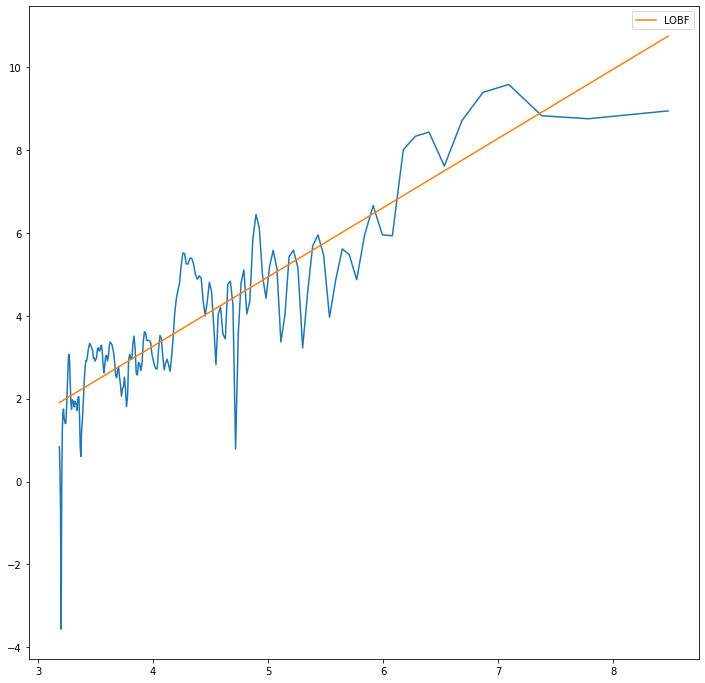

In [105]:
print(period_171_box1[200])

params,params_covarience = curve_fit(PowerFunction,period_171_box1[1:200],np.log(fft_171_box1[1:200]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)

print(params[0],params[1])
y_LOBF = PowerFunction((np.log(period_171_box1[1:200])),(params[0]),(params[1]))
plt.figure(figsize = (12,12))
plt.plot(np.log(period_171_box1[1:200]),np.log(fft_171_box1[1:200]))
plt.plot(np.log(period_171_box1[1:200]),params[1]*(np.log(period_171_box1[1:200]))+np.log(params[0]),label = 'LOBF')
# plt.xscale('log')
# plt.yscale('log')
plt.legend()
plt.show()

In [137]:
print(period_171_box1[200])

# params,params_covarience = curve_fit(PowerFunction,period_94_box1[1:205],np.log(fft_94_box1[1:205]),maxfev = 100000)#,p0, sigma = Nerrorlnn, absolute_sigma = True)

# print(params[0],params[1])
# y_LOBF = PowerFunction((np.log(period_94_box1[1:205])),(params[0]),(params[1]))
# plt.figure(figsize = (12,12))
# plt.plot(np.log(period_94_box1[1:205]),np.log(fft_94_box1[1:205]))
# plt.plot(np.log(period_94_box1[1:205]),params[1]*(np.log(period_94_box1[1:205]))+np.log(params[0]),label = 'LOBF')
# # plt.xscale('log')
# # plt.yscale('log')
# plt.legend()
# plt.show()

24.06


In [ ]:
183 283 401 412

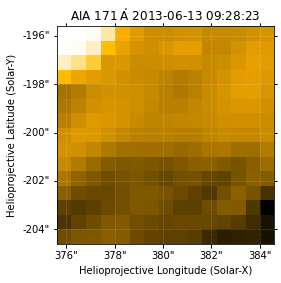

In [33]:
subsubmap_171 = []
for i in submaps_171 :
    # bottom_left = SkyCoord(412* u.arcsec, -198 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(418 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)     maybe still a bit big 
    bottom_left = SkyCoord(376* u.arcsec, -204 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(384 * u.arcsec, -196 * u.arcsec, frame=i.coordinate_frame)   
    # bottom_left = SkyCoord(411* u.arcsec, -200 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(418 * u.arcsec, -193 * u.arcsec, frame=i.coordinate_frame) 
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    subsubmap_171.append(submap)

subsubmap_171[10].plot()

In [34]:
# fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': sunspot_171[0].wcs})

# im = sunspot_171[0].plot(cmap = 'sdoaia171',axes=ax)

# def update(i):
#     ax.images[0].set_array(sunspot_171[i].data)  
#     ax.set_title(f"Frame {i + 1}")  

# anim = FuncAnimation(fig, update, frames=len(sunspot_171), interval=200, repeat=True)
# plt.show()



# anim.save('sunspot_animation_171_8_12_24.gif', writer='imagemagick')

In [35]:
intensity_subsub_171 = intenisty_sum(subsubmap_171)
intensity_roi_171 = intenisty_sum(submaps_171)

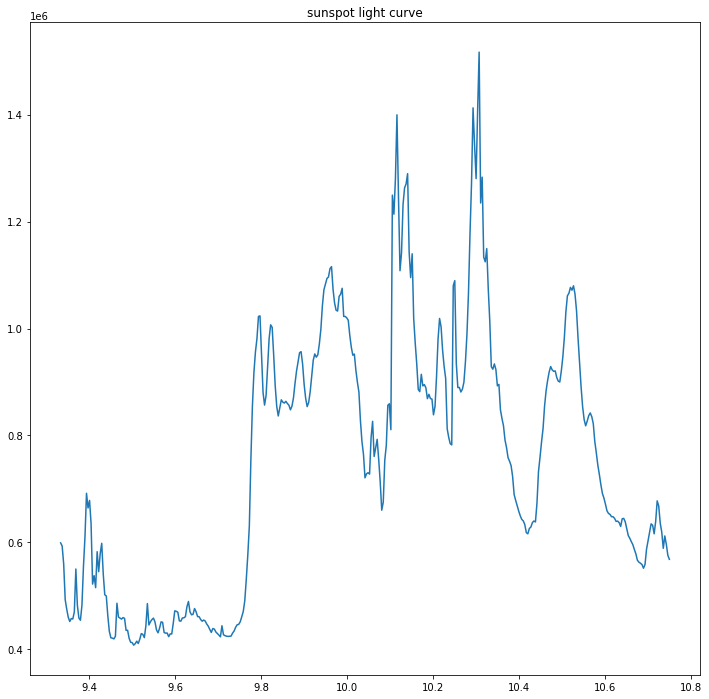

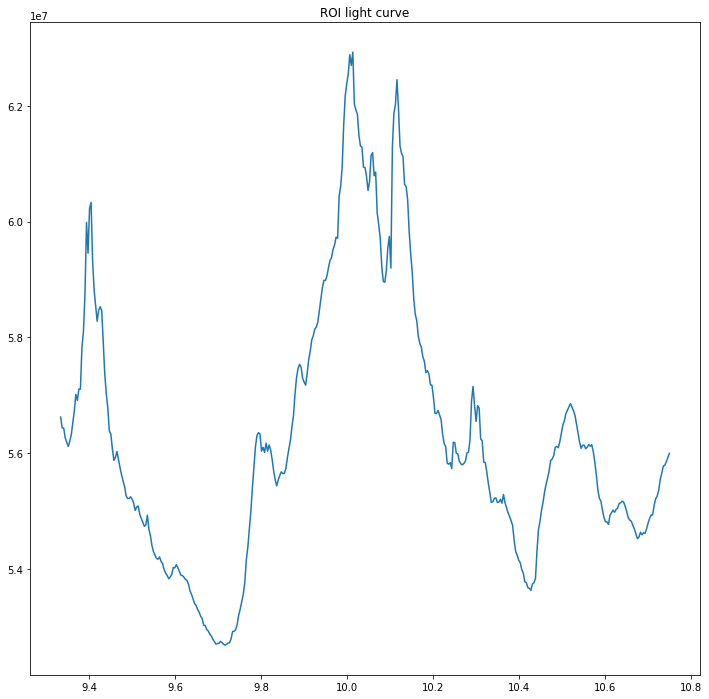

In [36]:
time_171 = np.linspace(9+20/60,10+45/60,401)

plt.figure(figsize = (12,12))
plt.plot(time_171, intensity_subsub_171)
plt.title('sunspot light curve')
plt.show()


plt.figure(figsize = (12,12))
plt.plot(time_171, intensity_roi_171)
plt.title('ROI light curve')
plt.show()



In [37]:
freqs, fft = windowed_fourier(intensity_subsub_171)

<Figure size 1080x1080 with 0 Axes>

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_6472/2756363162.py:2: RuntimeWarning: divide by zero encountered in divide
  period = (1/freqs)


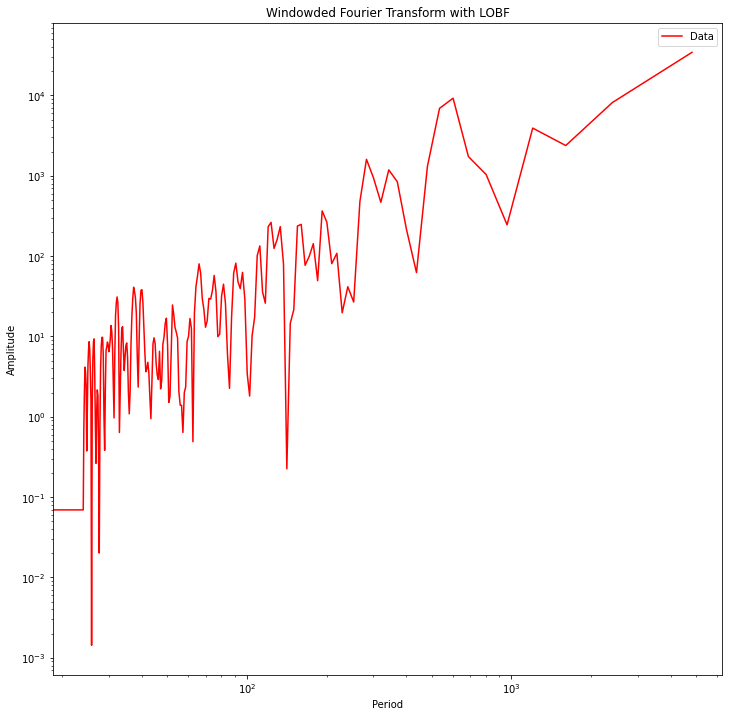

In [38]:
# print(freqs,fft)
period = (1/freqs)

# print(period[1],period)
# Use curve_fit to fit the model to the data
# params, covariance = curve_fit(quadratic, period, fft[1:142],p0=[0.01, 1],maxfev =10000000)#[1:len(freqs)]
# print(len(freqs))
# Extract the optimal parameters
# a_opt, b_opt= params

# print(f" {a_opt},{b_opt},{c_opt}")

# Generate the fitted line
# x_fit = np.arange(np.e**3.1815936570530696,np.e**8.130353547431238)
# y_fit = quadratic(x_fit, a_opt, b_opt)
# print(np.log(1/freqs)[1])
# print(((1/freqs)))
# Plot the data and the fitted line

plt.figure(figsize = (12,12))
plt.plot(period, fft, label="Data", color="red")
# plt.plot(x_fit, y_fit, label="Best fit", color="blue")
plt.xlabel("Period")
plt.ylabel("Amplitude")
plt.legend()
plt.yscale('log')
plt.xscale('log')
# plt.xlim(0,100)
# plt.ylim(0,5)
plt.title("Windowded Fourier Transform with LOBF")
plt.show()

0.003541666666666665


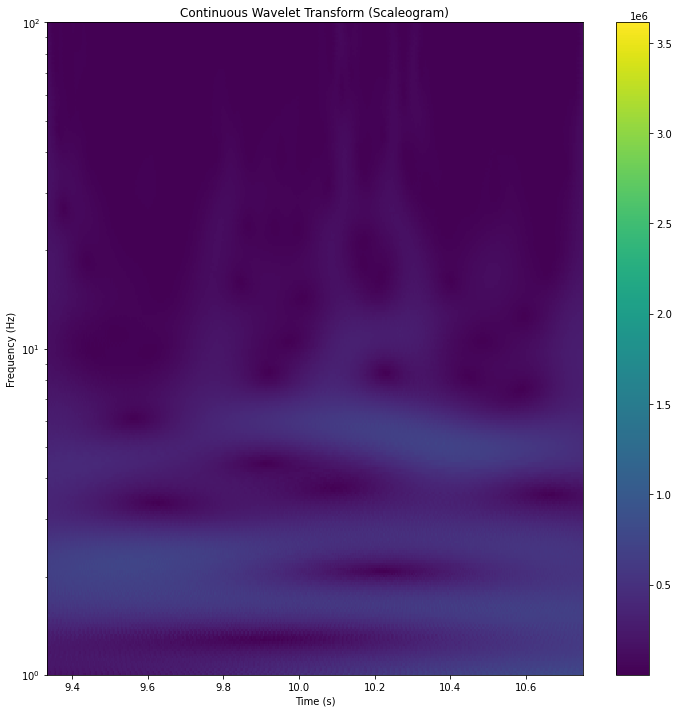

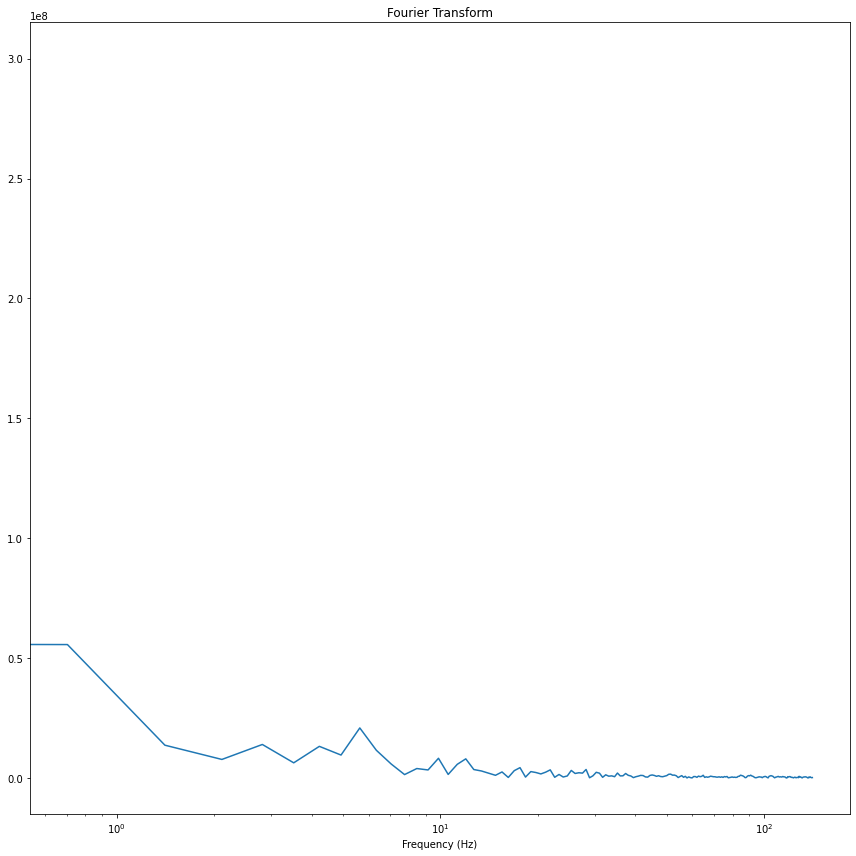

In [39]:


# perform CWT
wavelet = "cmor1.5-1.0"
# logarithmic scale for scales, as suggested by Torrence & Compo:
widths = np.geomspace(1, 1024, num=401)
sampling_period = np.diff(time_171).mean()
print(sampling_period)
cwtmatr, freqs = pywt.cwt(intensity_subsub_171, widths, wavelet, sampling_period=sampling_period)
# absolute take absolute value of complex result
cwtmatr = np.abs(cwtmatr[:-1, :-1])


# plot result using matplotlib's pcolormesh (image with annoted axes)

plt.figure(figsize=(12,12))
plt.pcolormesh(time_171, freqs, cwtmatr)
plt.yscale("log")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.ylim(1,100)
plt.title("Continuous Wavelet Transform (Scaleogram)")
plt.colorbar()
plt.show()

plt.figure(figsize=(12,12))
yf = rfft(intensity_subsub_171)
xf = rfftfreq(len(intensity_subsub_171), sampling_period)
plt.semilogx(xf, np.abs(yf))
plt.xlabel("Frequency (Hz)")
plt.title("Fourier Transform")
plt.tight_layout()
plt.show()

In [40]:
from wavelet_function import wavelet

In [ ]:
J1 = (np.log(2)*(401* 2/180))/0.1

wave, period, scale ,coi = wavelet(intensity_subsub_171,12,dj = 0.1,s0 = 160,J1 = J1,mother = 'MORLET')

print(wave[30])


ValueError: operands could not be broadcast together with shapes (401,) (400,) 

TypeError: Dimensions of C (31, 30) should be one smaller than X(32) and Y(32) while using shading='flat' see help(pcolormesh)

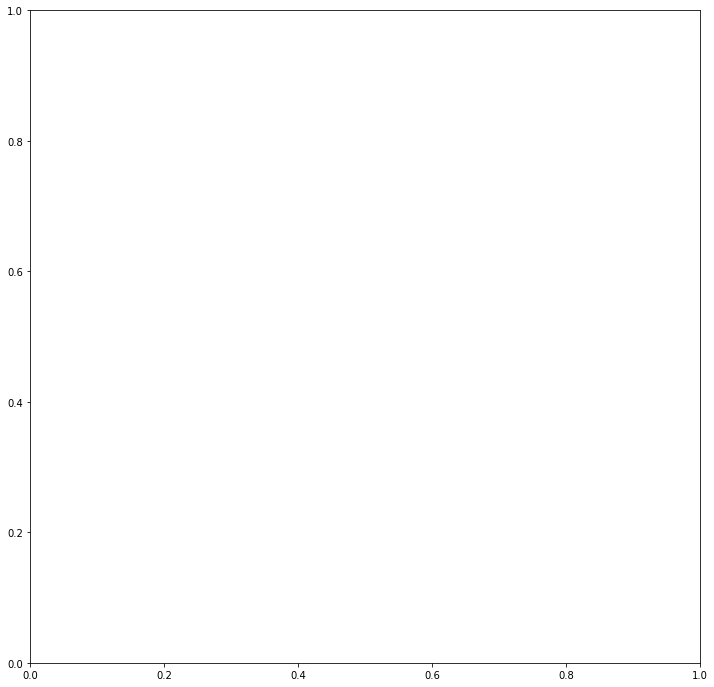

In [ ]:
plt.figure(figsize=(12,12))
plt.pcolormesh(period,scale,wave)

# 94 waveband anlysis

In [41]:
map_list_94 = os.listdir('fully_calibrated_FD_94_fixingtime')
path = np.sort(map_list_94)

maps_94 = []
for img in path:
    img_path = os.path.join('fully_calibrated_FD_94_fixingtime', img)
    
    aia_map = sunpy.map.Map(img_path)
    
    maps_94.append(aia_map)

In [42]:
submaps_94 = submaps(maps_94)

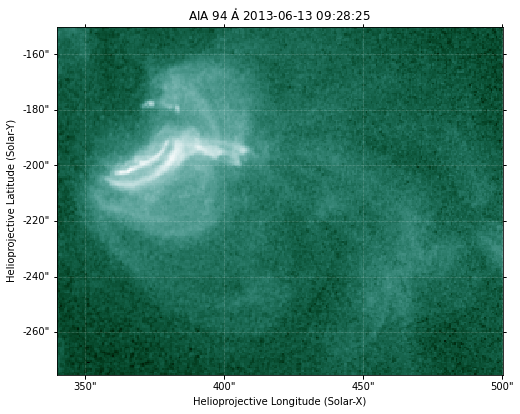

MovieWriter imagemagick unavailable; using Pillow instead.


In [ ]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': submaps_94[0].wcs})

im = submaps_94[0].plot(cmap = 'sdoaia94',axes=ax)

def update(i):
    ax.images[0].set_array(submaps_94[i].data)  
    ax.set_title(f"Frame {i + 1}")  

anim = FuncAnimation(fig, update, frames=len(submaps_94), interval=200, repeat=True)
plt.show()



anim.save('solar_flare_animation_94_8_12_24.gif', writer='imagemagick')

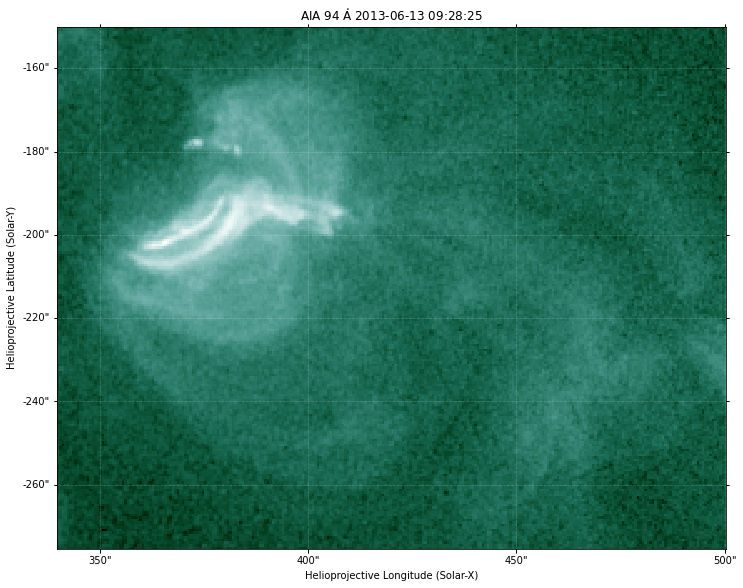

In [ ]:
plt.figure(figsize=(12,12))
submaps_94[0].plot()

In [44]:
intensity_submaps_94 = intenisty_sum(submaps_94)

In [ ]:
len(intensity_submaps_94)

412

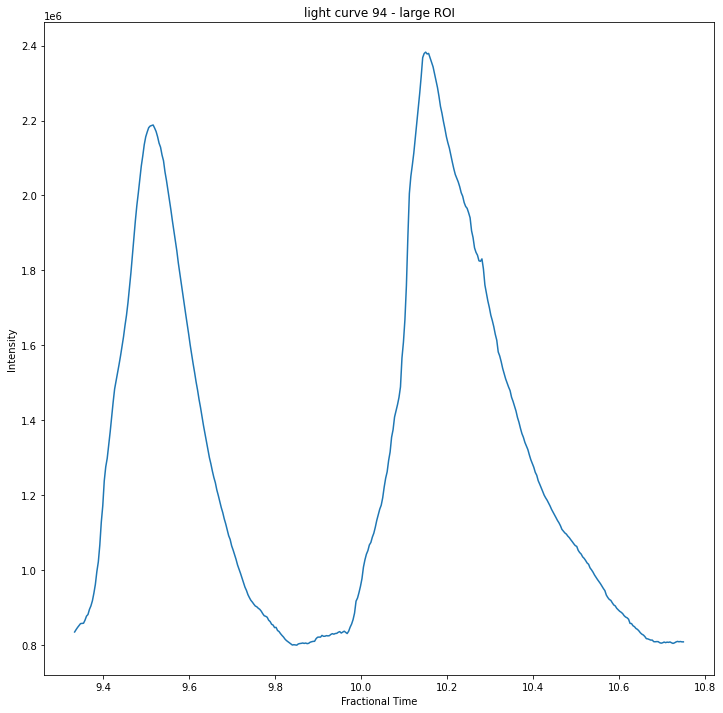

In [45]:
time_94 =np.linspace(9+20/60, 10+45/60, 412)

plt.figure(figsize=(12,12))
plt.plot(time_94, intensity_submaps_94)
plt.title('light curve 94 - large ROI')
plt.xlabel('Fractional Time')
plt.ylabel('Intensity')
plt.show()

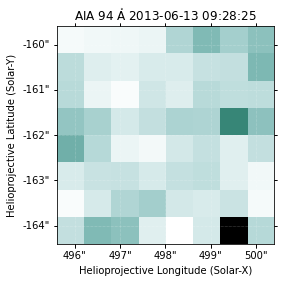

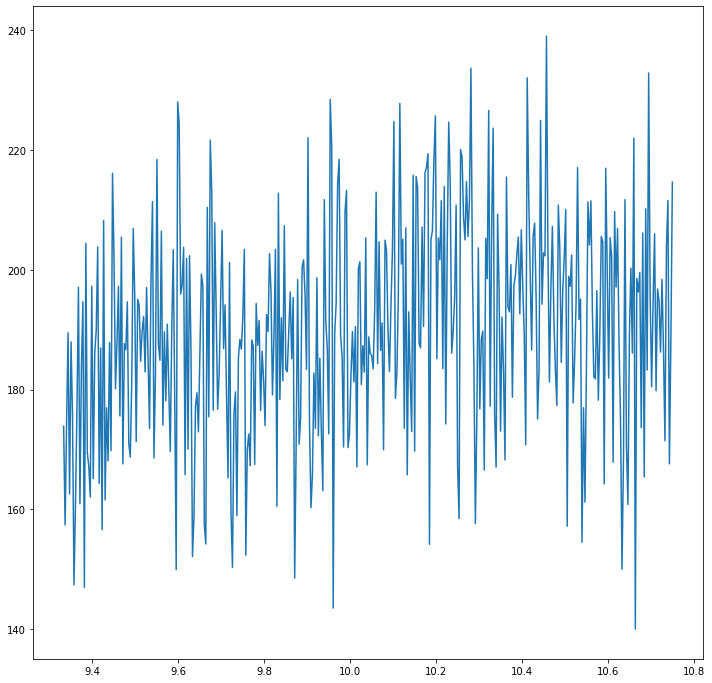

In [46]:
nothing_94 = []
for i in submaps_94 :
    # bottom_left = SkyCoord(350* u.arcsec, -220 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(425 * u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)     #just flare (ribbon)
    # bottom_left = SkyCoord(413* u.arcsec, -197.5 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(416.5 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)   
    # bottom_left = SkyCoord(411* u.arcsec, -200 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(418 * u.arcsec, -193 * u.arcsec, frame=i.coordinate_frame) 
    bottom_left = SkyCoord(496* u.arcsec, -164 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(500 * u.arcsec, -160 * u.arcsec, frame=i.coordinate_frame) 
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    nothing_94.append(submap)

nothing_94[400].plot()

nothing_94_intensity = intenisty_sum(nothing_94)
plt.figure(figsize = (12,12))
plt.plot(time_94,nothing_94_intensity)
plt.show()

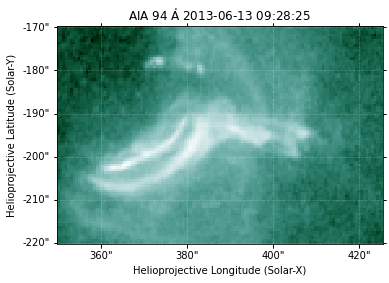

In [47]:
flare_94 = []
for i in submaps_94 :
    bottom_left = SkyCoord(350* u.arcsec, -220 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(425 * u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)     #just flare (ribbon)
    # bottom_left = SkyCoord(413* u.arcsec, -197.5 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(416.5 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)   
    # bottom_left = SkyCoord(411* u.arcsec, -200 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(418 * u.arcsec, -193 * u.arcsec, frame=i.coordinate_frame) 
    # bottom_left = SkyCoord(490* u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(500 * u.arcsec, -160 * u.arcsec, frame=i.coordinate_frame) 
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    flare_94.append(submap)

flare_94[0].plot()

In [49]:
def lightcurve_WFT(maps, BL, TR,time,box):

    time = time

    sub = []
    for i in maps :
        bottom_left = SkyCoord(375 * u.arcsec, -199 * u.arcsec, frame=i.coordinate_frame)
        top_right = SkyCoord(378 * u.arcsec, -196 * u.arcsec, frame=i.coordinate_frame)    
        submap = i.submap(bottom_left=bottom_left, top_right=top_right)
        sub.append(submap)

    sub_intensity = intenisty_sum(sub)

    plt.figure(figsize=(12,12))
    plt.plot(time,sub_intensity)
    plt.xlabel('fractional time')
    plt.ylabel('Intensity')
    plt.title(f'light curve over box {box}')
    plt.show()


    freqs, fft = windowed_fourier(sub_intensity)


    period = (1/freqs)
    plt.figure(figsize = (12,12))
    plt.plot(period, fft, label="Data", color="red")
    plt.xlabel("Period")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.yscale('log')
    plt.xscale('log')
    plt.title(f"Windowded Fourier Transform - of box {box}")
    plt.show()

   



In [ ]:
sub_box1 = []
for i in flare_94 :
    bottom_left = SkyCoord(375 * u.arcsec, -199 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(378 * u.arcsec, -196 * u.arcsec, frame=i.coordinate_frame)    
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    sub_box1.append(submap)



[6036.930401727832, 6519.348176041336, 6881.780681626241, 6950.746512441772, 6780.378202628493, 7009.717466955813, 7200.258698088445, 7420.588622646427, 8305.950955316363, 8387.166136857408, 8726.144659101323, 9678.540928350982, 10098.35992124685, 11276.215074527658, 12654.167043494821, 14942.824368802769, 17769.674391757086, 21809.75880475157, 24635.294064100057, 28427.805928180078, 31733.360477269416, 35412.40170715736, 34573.606300021136, 35612.044516847025, 36241.25872916267, 37419.220709881134, 37384.5968663839, 37756.10615480482, 37582.24916147847, 37115.31777415934, 37528.68516377263, 37312.449850365745, 36013.90400231596, 35721.25627607729, 35388.81819194842, 35284.500368821835, 34979.12955542996, 34960.45325745931, 35233.93653429287, 35927.01361320662, 36226.37611521794, 36714.64598734267, 37323.00754239986, 37593.5184625784, 37927.500830891564, 38861.24583019245, 38964.81276444095, 39016.19663454251, 39372.034667179454, 38950.679879028066, 38766.22710723899, 38796.42766237189

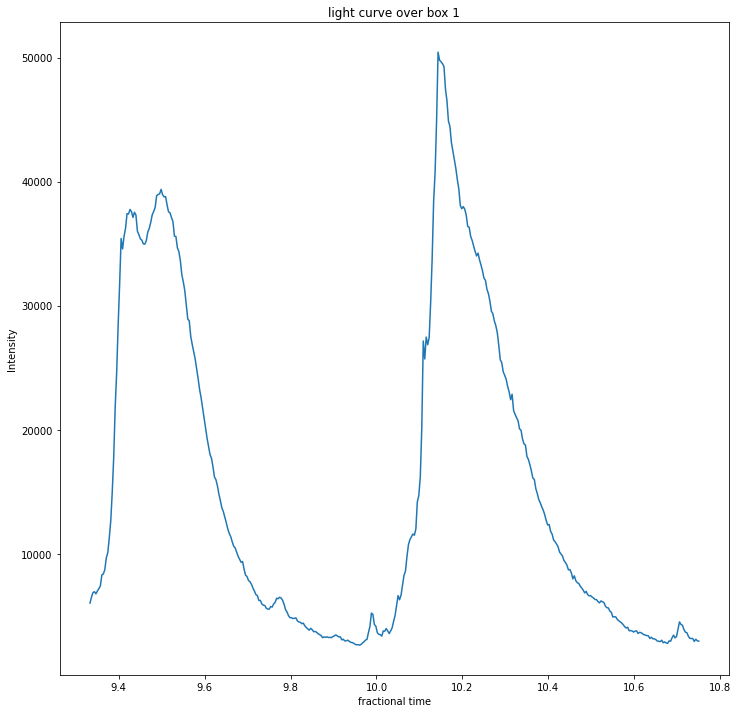

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_23091/3800913907.py:14: RuntimeWarning: divide by zero encountered in divide
  period = (1/freqs)


<Figure size 1080x1080 with 0 Axes>

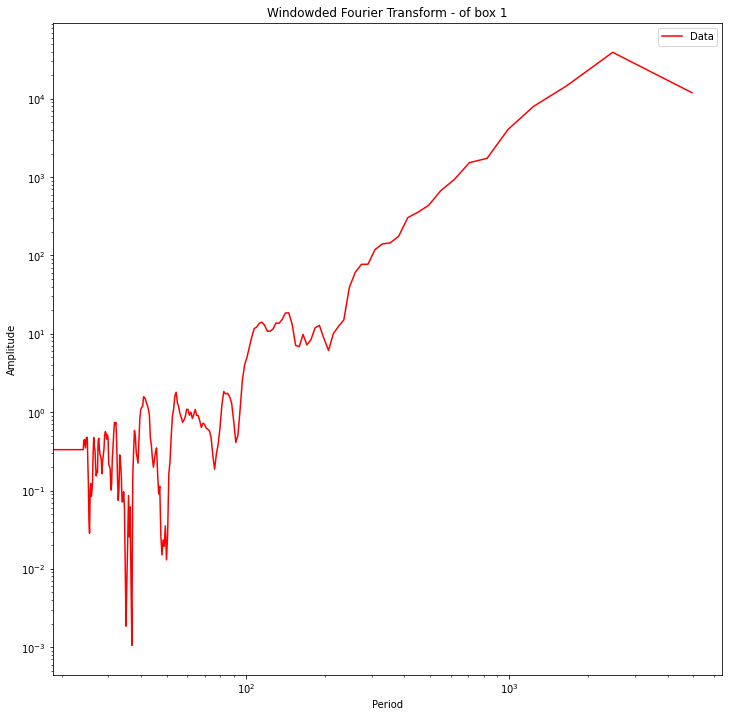

In [ ]:


sub_box1_intensity = intenisty_sum(sub_box1)
print(sub_box1_intensity)
plt.figure(figsize=(12,12))
plt.plot(time_94,sub_box1_intensity)
plt.xlabel('fractional time')
plt.ylabel('Intensity')
plt.title(f'light curve over box 1')
plt.show()


freqs, fft = windowed_fourier(sub_box1_intensity)


period = (1/freqs)
plt.figure(figsize = (12,12))
plt.plot(period, fft, label="Data", color="red")
plt.xlabel("Period")
plt.ylabel("Amplitude")
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.title(f"Windowded Fourier Transform - of box 1")
plt.show()

[6074.380577879692, 6039.5123175366925, 6003.8934096844605, 6056.1986726770265, 6251.6846610933435, 6185.247484202711, 6267.9951070653715, 6271.919434426775, 6663.548176021879, 6895.341671453997, 7328.580283762801, 7608.182779811092, 7974.471109354586, 8634.418677171616, 9351.125481289197, 10206.186453465918, 11517.915364020288, 12638.144334054976, 14740.177189713628, 14856.009679493298, 16960.831952492714, 17959.681873283964, 19361.31847259179, 22307.529420991363, 23255.368351974204, 27336.957436507244, 29366.441704066685, 33166.01595807584, 34585.093355827186, 35169.71390522217, 36980.80134463688, 37349.95935976459, 39279.23560531729, 39488.77776547354, 41159.458503874914, 38825.197138599244, 38574.83066340381, 36863.19397858217, 37236.335936554984, 38527.49284040624, 39174.615660019634, 40060.57730815526, 40682.9128095529, 40280.09796126595, 40411.427880797964, 40437.722657091086, 40707.43873526667, 41428.71913494238, 41496.78106540296, 40894.69862464381, 41120.72099252074, 40356.23

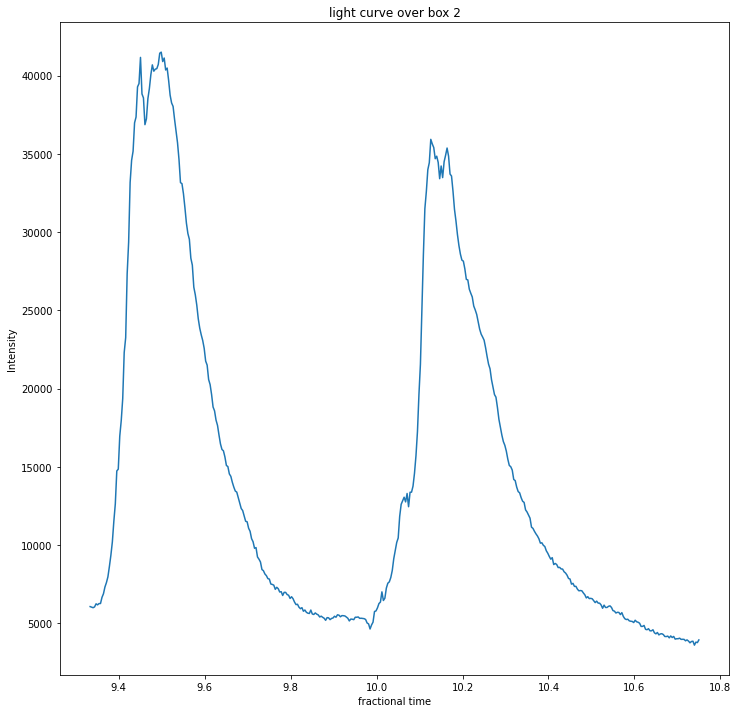

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_23091/2287262071.py:23: RuntimeWarning: divide by zero encountered in divide
  period = (1/freqs)


<Figure size 1080x1080 with 0 Axes>

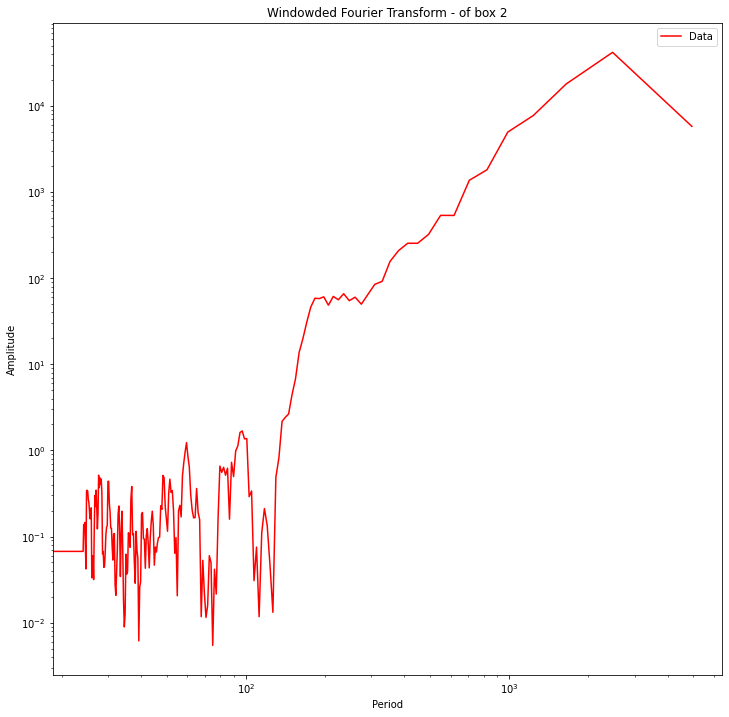

In [ ]:
sub_box2 = []
for i in flare_94 :
    bottom_left = SkyCoord(384 * u.arcsec, -193 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(387 * u.arcsec, -190 * u.arcsec, frame=i.coordinate_frame)    
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    sub_box2.append(submap)



sub_box2_intensity = intenisty_sum(sub_box2)
print(sub_box2_intensity)
plt.figure(figsize=(12,12))
plt.plot(time_94,sub_box2_intensity)
plt.xlabel('fractional time')
plt.ylabel('Intensity')
plt.title(f'light curve over box 2')
plt.show()


freqs, fft = windowed_fourier(sub_box2_ntensity)


period = (1/freqs)
plt.figure(figsize = (12,12))
plt.plot(period, fft, label="Data", color="red")
plt.xlabel("Period")
plt.ylabel("Amplitude")
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.title(f"Windowded Fourier Transform - of box 2")
plt.show()

[5823.430792356758, 5751.549229783199, 5893.108059188752, 6110.865375513319, 6076.850498287811, 6102.780658417967, 6236.047383383389, 6141.337864685356, 6073.283042194969, 6062.624944566, 6269.797753156652, 5962.127772546943, 6058.654421702691, 6357.2332799069745, 6416.171499065455, 6451.924193244201, 6628.638944001902, 6817.161617032981, 7046.05635726886, 7102.360038404789, 7170.824283484044, 7334.737207655099, 7661.535875855128, 7995.540463814457, 8317.2528563157, 8584.119278668895, 8905.550273500297, 9216.562909685048, 9429.145480353724, 9860.876483823662, 10267.2191644446, 10276.022839406822, 11110.201898606143, 11076.559349485608, 11438.923202301185, 11488.127184692903, 12210.115906201463, 12386.345457175252, 13143.720197235973, 13460.740863920546, 13739.133552129559, 14454.691643443899, 14941.113593734515, 15484.929686119902, 15711.406004755281, 15798.149002880087, 16021.458735678356, 16175.882931495395, 15940.187800456137, 15542.197280401806, 15627.075389574595, 15516.0706361829

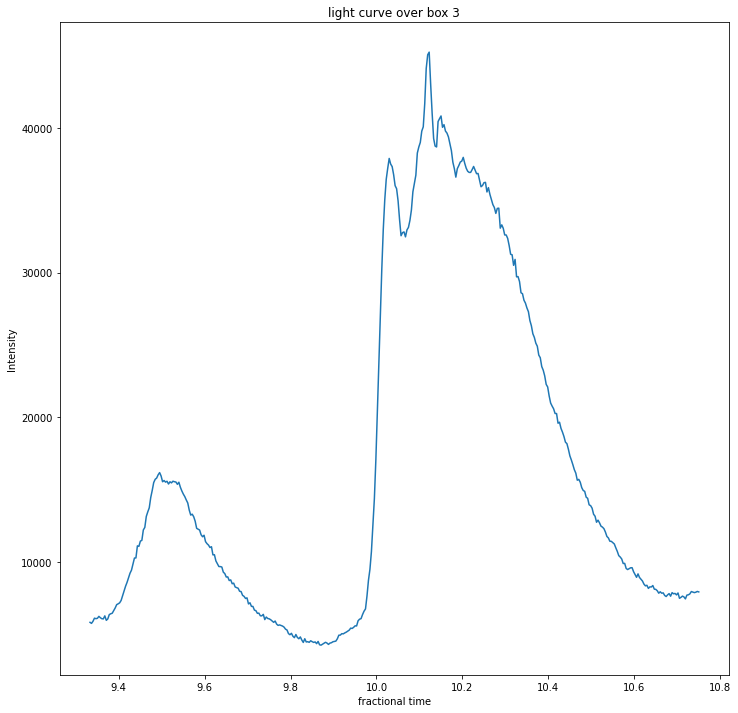

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_23091/4243133304.py:23: RuntimeWarning: divide by zero encountered in divide
  period = (1/freqs)


<Figure size 1080x1080 with 0 Axes>

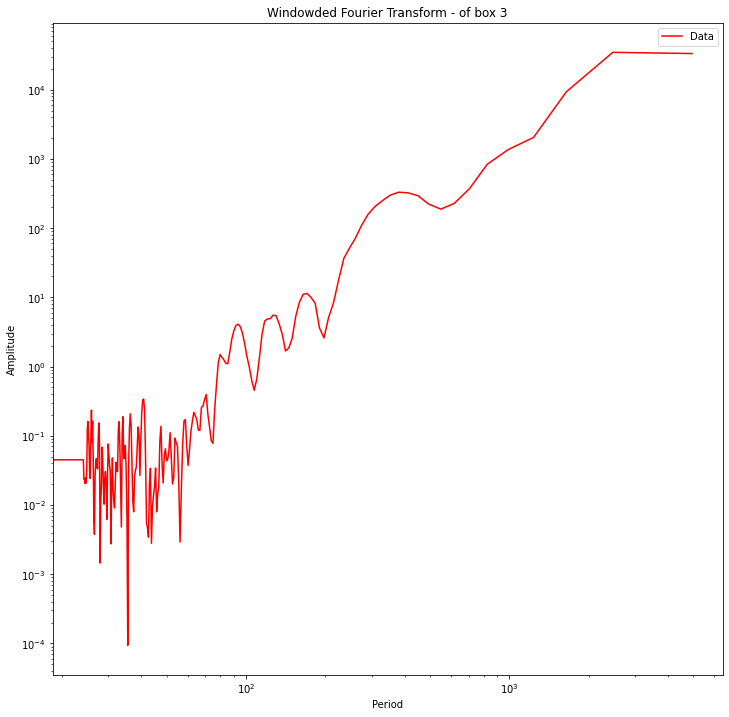

In [ ]:
sub_box3 = []
for i in flare_94 :
    bottom_left = SkyCoord(397 * u.arcsec, -196 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(400 * u.arcsec, -192 * u.arcsec, frame=i.coordinate_frame)    
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    sub_box3.append(submap)



sub_box3_intensity = intenisty_sum(sub_box3)
print(sub_box3_intensity)
plt.figure(figsize=(12,12))
plt.plot(time_94,sub_box3_intensity)
plt.xlabel('fractional time')
plt.ylabel('Intensity')
plt.title(f'light curve over box 3')
plt.show()


freqs, fft = windowed_fourier(sub_box3_intensity)


period = (1/freqs)
plt.figure(figsize = (12,12))
plt.plot(period, fft, label="Data", color="red")
plt.xlabel("Period")
plt.ylabel("Amplitude")
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.title(f"Windowded Fourier Transform - of box 3")
plt.show()

[3854.9981865447653, 3796.249515474981, 3843.8002369514734, 3807.0811858960305, 3814.0311100299655, 3624.350421343072, 3739.6616822351925, 3807.4123651724776, 3641.202034125962, 3622.087028682476, 3757.5917435131223, 3602.4928951071547, 3675.6280485247216, 3595.9228525452977, 3650.3086584427456, 3705.373955806439, 3671.7263130082706, 3701.6931943028544, 3694.961121429035, 3774.931182854117, 3886.621357619738, 3990.3816512385984, 3958.151427184583, 4061.2276335842935, 4125.591416995939, 4050.4362151532973, 4094.9827485973606, 4158.816931645422, 4233.652721369615, 4256.64237358177, 4263.0857467716205, 4427.79651798987, 4401.013811272321, 4506.204924650851, 4643.550671609032, 4626.070631251087, 4722.944869935458, 4620.183610114074, 4596.6798732482575, 4812.0160646534405, 4892.467067712237, 5124.216458721622, 5125.945356749227, 5227.837301659566, 5623.53808485443, 5849.920121748092, 6155.391294208821, 6435.536847871959, 6866.25601301563, 6939.1381390529095, 6747.865190881593, 6728.58193902

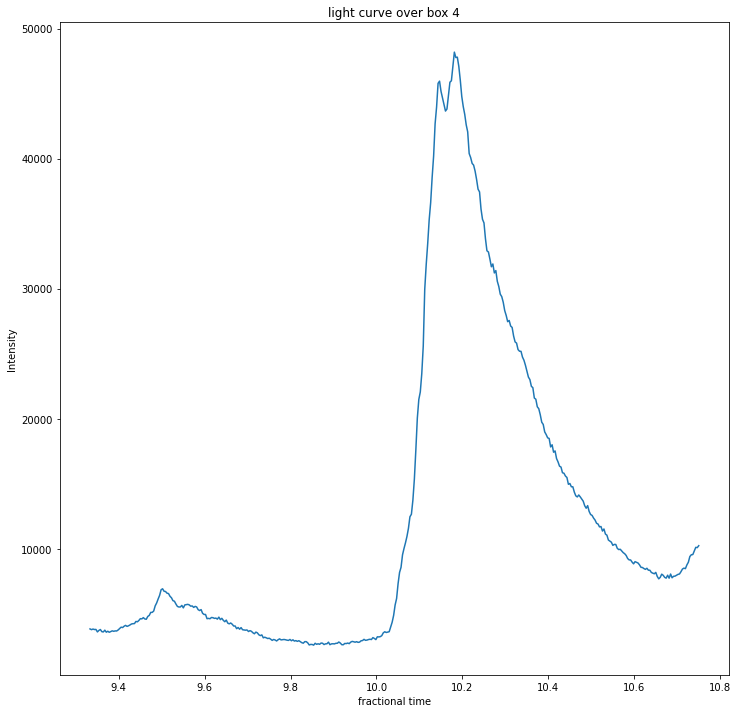

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_23091/1758825969.py:23: RuntimeWarning: divide by zero encountered in divide
  period = (1/freqs)


<Figure size 1080x1080 with 0 Axes>

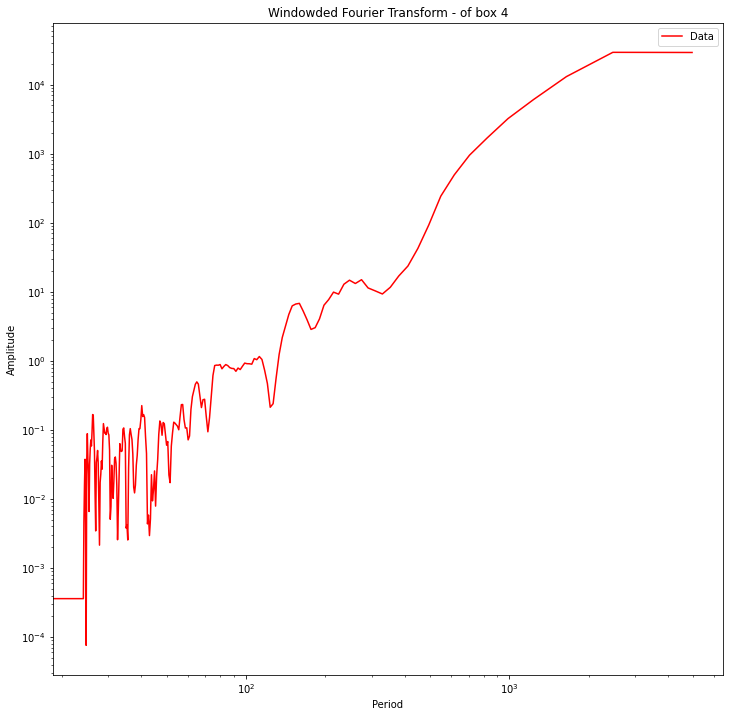

In [ ]:
sub_box4 = []
for i in flare_94 :
    bottom_left = SkyCoord(405 * u.arcsec, -197 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(408 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)    
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    sub_box4.append(submap)



sub_box4_intensity = intenisty_sum(sub_box4)
print(sub_box4_intensity)
plt.figure(figsize=(12,12))
plt.plot(time_94,sub_box4_intensity)
plt.xlabel('fractional time')
plt.ylabel('Intensity')
plt.title(f'light curve over box 4')
plt.show()


freqs, fft = windowed_fourier(sub_box4_intensity)


period = (1/freqs)
plt.figure(figsize = (12,12))
plt.plot(period, fft, label="Data", color="red")
plt.xlabel("Period")
plt.ylabel("Amplitude")
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.title(f"Windowded Fourier Transform - of box 4")
plt.show()

In [ ]:
flare_94_1 = []
for i in submaps_94 :
    bottom_left = SkyCoord(350* u.arcsec, -220 * u.arcsec, frame=i.coordinate_frame)
    top_right = SkyCoord(425 * u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)     #just flare (ribbon)
    # bottom_left = SkyCoord(413* u.arcsec, -197.5 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(416.5 * u.arcsec, -194 * u.arcsec, frame=i.coordinate_frame)   
    # bottom_left = SkyCoord(411* u.arcsec, -200 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(418 * u.arcsec, -193 * u.arcsec, frame=i.coordinate_frame) 
    # bottom_left = SkyCoord(490* u.arcsec, -170 * u.arcsec, frame=i.coordinate_frame)
    # top_right = SkyCoord(500 * u.arcsec, -160 * u.arcsec, frame=i.coordinate_frame) 
    submap = i.submap(bottom_left=bottom_left, top_right=top_right)
    flare_94.append(submap)

In [ ]:
freqs, fft = windowed_fourier(nothing_94_intensity)

<Figure size 1080x1080 with 0 Axes>

/var/folders/96/6cy2m0cs6f58g_nf35j6n89c0000gn/T/ipykernel_23091/1296289678.py:2: RuntimeWarning: divide by zero encountered in divide
  period = (1/freqs)


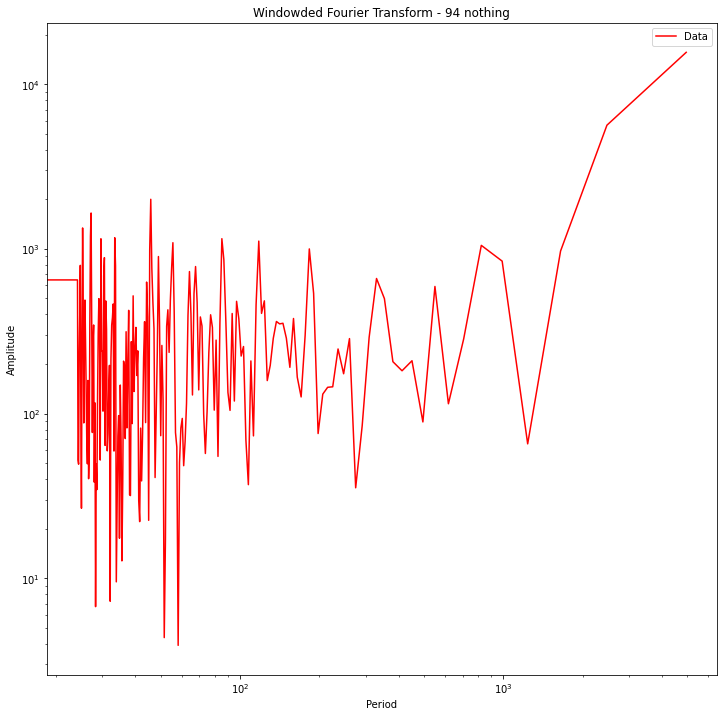

In [ ]:
# print(freqs,fft)
period = (1/freqs)

# print(period[1],period)
# Use curve_fit to fit the model to the data
# params, covariance = curve_fit(quadratic, period, fft[1:142],p0=[0.01, 1],maxfev =10000000)#[1:len(freqs)]
# print(len(freqs))
# Extract the optimal parameters
# a_opt, b_opt= params

# print(f" {a_opt},{b_opt},{c_opt}")

# Generate the fitted line
# x_fit = np.arange(np.e**3.1815936570530696,np.e**8.130353547431238)
# y_fit = quadratic(x_fit, a_opt, b_opt)
# print(np.log(1/freqs)[1])
# print(((1/freqs)))
# Plot the data and the fitted line

plt.figure(figsize = (12,12))
plt.plot(period, fft, label="Data", color="red")
# plt.plot(x_fit, y_fit, label="Best fit", color="blue")
plt.xlabel("Period")
plt.ylabel("Amplitude")
plt.legend()
plt.yscale('log')
plt.xscale('log')
# plt.xlim(0,100)
# plt.ylim(0,5)
plt.title("Windowded Fourier Transform - 94 nothing")
plt.show()

# windowed FT of the red boxes in 171 wavneband